In [ ]:
!pip install mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mne #library untuk pemrosesan sinyal elektroensefalografi (EEG)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import firwin, lfilter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 13.5 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/TA

Mounted at /content/drive
/content/drive/MyDrive/TA


# pantek

Akurasi: 0.9998344918901027
Laporan Klasifikasi:
               precision    recall  f1-score   support

      kejang       1.00      1.00      1.00      2997
tidak kejang       1.00      1.00      1.00      3045

    accuracy                           1.00      6042
   macro avg       1.00      1.00      1.00      6042
weighted avg       1.00      1.00      1.00      6042



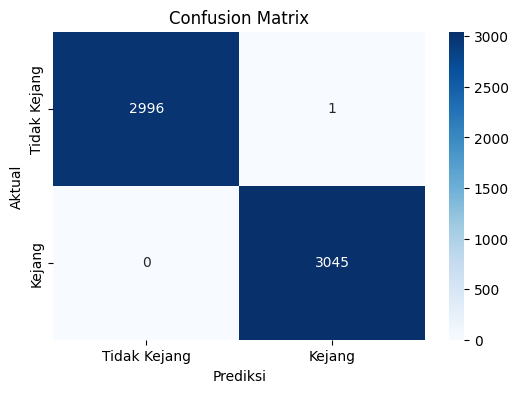

In [ ]:
# Load the data from the CSV file into a pandas DataFrame
TA_20_1 = pd.read_csv("/content/drive/MyDrive/TA/FFT/chb04_28_1.csv")

# Step 11: Siapkan data untuk klasifikasi
X = TA_20_1.drop(['frekuensi', 'seizure'], axis=1)
y = TA_20_1['seizure']

# Step 12: Bagi data menjadi latih dan uji secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Step 13: Latih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# Step 14: Evaluasi model -> Cetak akurasi dan laporan
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))

# Step 15: Matriks Evaluasi
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()

Akurasi pada data latih: 1.0
Akurasi pada data uji: 0.9996675531914894
Laporan Klasifikasi (Data Uji):
               precision    recall  f1-score   support

      kejang       1.00      1.00      1.00      2938
tidak kejang       1.00      1.00      1.00      3078

    accuracy                           1.00      6016
   macro avg       1.00      1.00      1.00      6016
weighted avg       1.00      1.00      1.00      6016



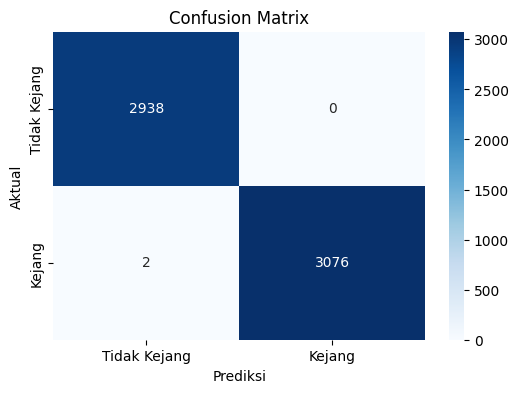

Cross-validation scores: [1.         1.         1.         1.         0.99966755 1.
 0.99966755 1.         0.99933511 1.        ]
Mean CV Accuracy: 0.9998670212765959
Standard Deviation: 0.00022052026531618036


In [ ]:
# ini random forest
# Import library yang diperlukan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the data from the CSV file into a pandas DataFrame
TA_27 = pd.read_csv("/content/drive/MyDrive/TA/FFT/chb05_06.csv")

# Step 11: Siapkan data untuk klasifikasi
X = TA_27.drop(['frekuensi', 'seizure'], axis=1)
y = TA_27['seizure']

# Step 12: Bagi data menjadi latih dan uji secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Step 13: Latih model Random Forest dengan max_features='sqrt'
model = RandomForestClassifier(n_estimators=50, max_depth=10, max_features='sqrt', random_state=42)
model.fit(X_train, y_train)

# Prediksi pada data latih
y_train_pred = model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)

# Prediksi pada data uji
y_pred = model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred)

# Step 14: Evaluasi model -> Cetak akurasi dan laporan
print("Akurasi pada data latih:", train_accuracy)  # Akurasi pada data latih
print("Akurasi pada data uji:", test_accuracy)  # Akurasi pada data uji
print("Laporan Klasifikasi (Data Uji):\n", classification_report(y_test, y_pred))

# Step 15: Matriks Evaluasi
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()

# Step 16: K-Fold Cross Validation (Stratified K-Fold)
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(model, X, y, cv=kf, scoring='accuracy')

# Cetak hasil cross-validation
print("Cross-validation scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))
print("Standard Deviation:", np.std(cv_scores))




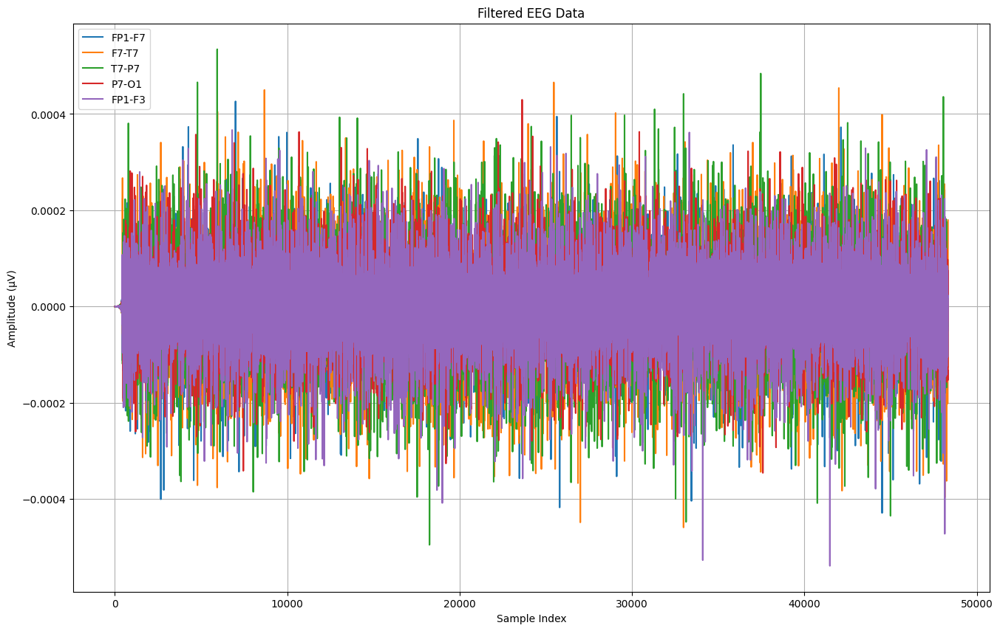

ValueError: Length of values (48332) does not match length of index (24166)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import firwin, lfilter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# 1. Import data yang sudah diberi label
df = pd.read_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv")

# 2. Bagi data menjadi data latih dan uji secara stratified
X = df.drop(['Time', 'seizure'], axis=1)
y = df['seizure']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Simpan data latih dan uji
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)
train_df.to_csv("/content/drive/MyDrive/TA/SPLIT_train.csv", index=False)
test_df.to_csv("/content/drive/MyDrive/TA/SPLIT_test.csv", index=False)

# 3. Terapkan Bandpass Filter (1-30 Hz, Hamming window)
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    return lfilter(taps, 1.0, data, axis=0)

lowcut, highcut, sampling_rate, num_taps = 1, 30, 256, 846

X_train_filtered = bandpass_filter_fir(X_train.values, lowcut, highcut, sampling_rate, num_taps)
X_test_filtered = bandpass_filter_fir(X_test.values, lowcut, highcut, sampling_rate, num_taps)

train_filtered_df = pd.DataFrame(X_train_filtered, columns=X_train.columns)
test_filtered_df = pd.DataFrame(X_test_filtered, columns=X_test.columns)
train_filtered_df['seizure'] = y_train.values
test_filtered_df['seizure'] = y_test.values

# 5. Simpan data setelah filtering
train_filtered_df.to_csv("/content/drive/MyDrive/TA/FILTERING_train_filtered.csv", index=False)
test_filtered_df.to_csv("/content/drive/MyDrive/TA/FILTERING_test_filtered.csv", index=False)

# 4. Visualisasi data setelah filtering
plt.figure(figsize=(16, 10))
for channel in X_train.columns[:5]:  # Visualisasi contoh 5 channel pertama
    plt.plot(train_filtered_df.index, train_filtered_df[channel], label=channel)
plt.title('Filtered EEG Data')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude (µV)')
plt.legend()
plt.grid()
plt.show()

# 6. Terapkan FFT
def compute_fft(signal, sampling_rate):
    N = len(signal)
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, 1.0 / sampling_rate)
    return fft_freqs[:N // 2], np.abs(fft_vals[:N // 2])

fft_train, fft_test = [], []
for channel in X_train.columns:
    freqs, fft_vals_train = compute_fft(train_filtered_df[channel].values, sampling_rate)
    _, fft_vals_test = compute_fft(test_filtered_df[channel].values, sampling_rate)
    fft_train.append(fft_vals_train)
    fft_test.append(fft_vals_test)

ffft_train_df = pd.DataFrame(np.array(fft_train).T, columns=X_train.columns[:len(fft_train)])
fft_test_df = pd.DataFrame(np.array(fft_test).T, columns=X_test.columns[:len(fft_test)])

fft_train_df['seizure'] = y_train.values
fft_test_df['seizure'] = y_test.values

# 7. Simpan data setelah FFT
fft_train_df.to_csv("/content/drive/MyDrive/TA/FFT_train_fft.csv", index=False)
fft_test_df.to_csv("/content/drive/MyDrive/TA/FFT_test_fft.csv", index=False)

# 6. Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))
for channel in X_train.columns[:5]:
    plt.plot(freqs, fft_train_df[channel], label=channel)
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid()
plt.show()

# 8. Klasifikasi dengan Random Forest
X_train_fft = fft_train_df.drop('seizure', axis=1)
X_test_fft = fft_test_df.drop('seizure', axis=1)
y_train_fft = fft_train_df['seizure']
y_test_fft = fft_test_df['seizure']

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_fft, y_train_fft)
y_pred_train = model.predict(X_train_fft)
y_pred_test = model.predict(X_test_fft)

# 9. Evaluasi Model
print("Akurasi Data Latih:", accuracy_score(y_train_fft, y_pred_train))
print("Akurasi Data Uji:", accuracy_score(y_test_fft, y_pred_test))
print("Laporan Klasifikasi Data Uji:\n", classification_report(y_test_fft, y_pred_test))

# 10. Confusion Matrix
cm = confusion_matrix(y_test_fft, y_pred_test)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb05_06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-16-21327f2ff3d2>:12: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data1 = mne.io.read_raw_edf(data1)


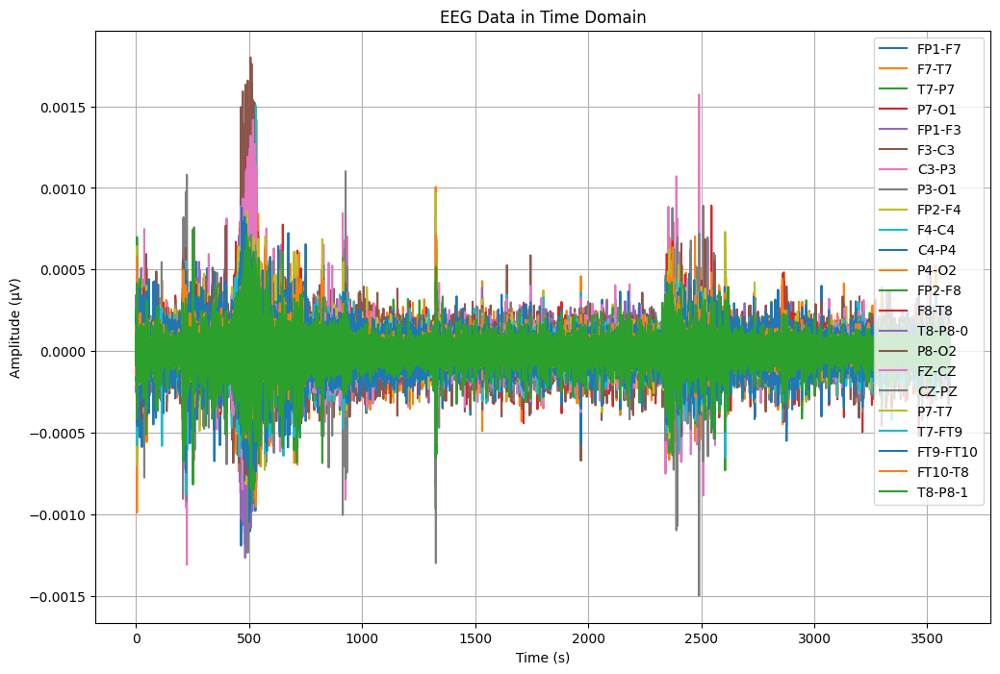

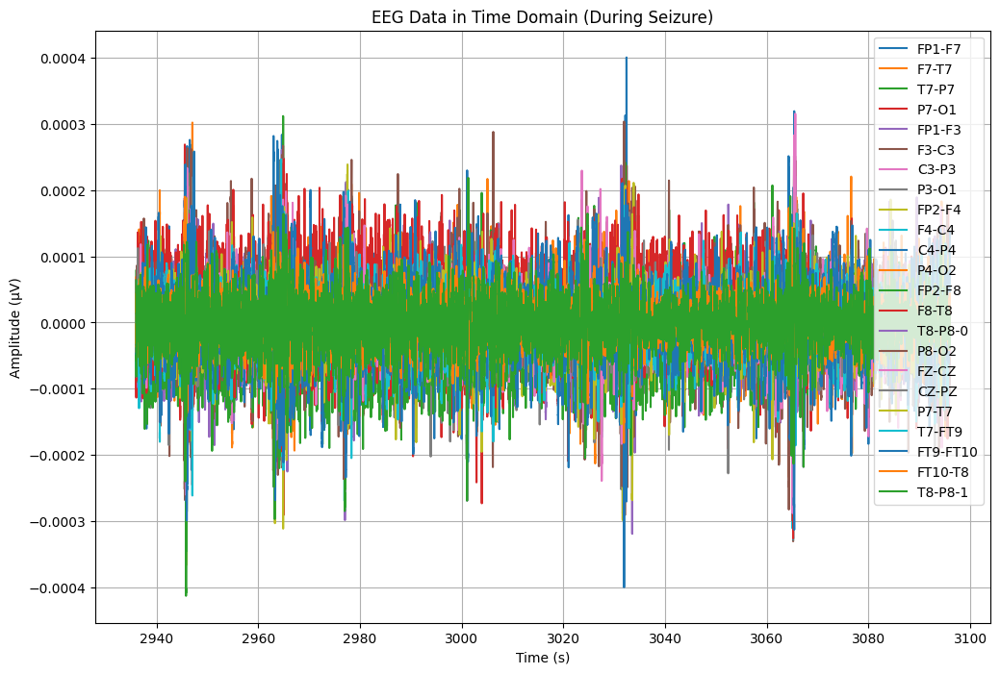

Data berhasil disimpan dalam file CSV:           FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
751616  0.000028 -0.000015  0.000078 -0.000081  0.000023 -5.724054e-05   
751617  0.000024 -0.000012  0.000072 -0.000086  0.000017 -6.310134e-05   
751618  0.000026 -0.000012  0.000063 -0.000088  0.000015 -6.700855e-05   
751619  0.000029 -0.000008  0.000055 -0.000091  0.000013 -6.974359e-05   
751620  0.000030 -0.000009  0.000050 -0.000089  0.000007 -7.208791e-05   
...          ...       ...       ...       ...       ...           ...   
792571 -0.000053 -0.000018 -0.000035  0.000072 -0.000070  7.228327e-06   
792572 -0.000048 -0.000017 -0.000036  0.000064 -0.000062  4.102564e-06   
792573 -0.000045 -0.000019 -0.000038  0.000063 -0.000056  1.953602e-07   
792574 -0.000041 -0.000023 -0.000039  0.000061 -0.000048 -4.884005e-06   
792575 -0.000034 -0.000027 -0.000038  0.000054 -0.000041 -9.181929e-06   

           C3-P3     P3-O1        FP2-F4         F4-C4  ...       T8-P8-

<ipython-input-16-21327f2ff3d2>:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['seizure'] = df_1.apply(label_seizure, axis=1)


Data yang sudah diberi label berhasil disimpan dalam file CSV:           FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
751616  0.000028 -0.000015  0.000078 -0.000081  0.000023 -5.724054e-05   
751617  0.000024 -0.000012  0.000072 -0.000086  0.000017 -6.310134e-05   
751618  0.000026 -0.000012  0.000063 -0.000088  0.000015 -6.700855e-05   
751619  0.000029 -0.000008  0.000055 -0.000091  0.000013 -6.974359e-05   
751620  0.000030 -0.000009  0.000050 -0.000089  0.000007 -7.208791e-05   
...          ...       ...       ...       ...       ...           ...   
792571 -0.000053 -0.000018 -0.000035  0.000072 -0.000070  7.228327e-06   
792572 -0.000048 -0.000017 -0.000036  0.000064 -0.000062  4.102564e-06   
792573 -0.000045 -0.000019 -0.000038  0.000063 -0.000056  1.953602e-07   
792574 -0.000041 -0.000023 -0.000039  0.000061 -0.000048 -4.884005e-06   
792575 -0.000034 -0.000027 -0.000038  0.000054 -0.000041 -9.181929e-06   

           C3-P3     P3-O1        FP2-F4        

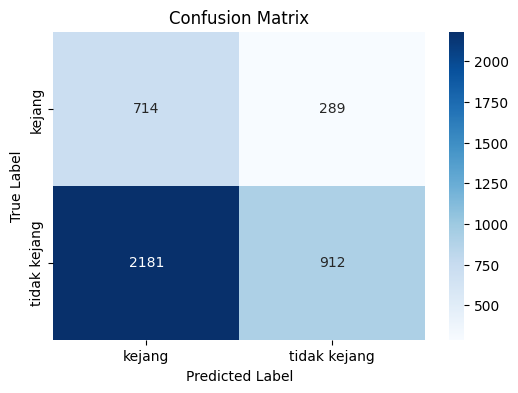

In [ ]:
import mne
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

#3. Load data EEG dari file EDF
data1 = "/content/drive/MyDrive/TA/EDF/chb05_06.edf"
data1 = mne.io.read_raw_edf(data1)
data1

data, times = data1.get_data(return_times=True)
channel_names = data1.ch_names

#4. Ekstrak data dan simpan ke DataFrame pandas
df1 = pd.DataFrame(data.T, columns=channel_names)
df1['Time'] = times

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df1['Time']

# # Step 5: Plot data EEG mentah
plt.figure(figsize=(12, 8))
for channel in channels:
    plt.plot(time, df1[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# potong data
sample_rate = 256

# Step 6: Tentukan rentang waktu analisis
start_time_seconds = 2936
end_time_seconds = 3096

# Step 7: Potong data berdasarkan waktu -> Simpan ke CSV
start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_1 = df1.iloc[start_index:end_index]

# Mengambil data waktu dari kolom 'Time'
time = df_1['Time']

# Membuat plot
plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in df_1.columns:
        plt.plot(time, df_1[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Menyimpan data yang sudah di potong
df_1.to_csv("/content/drive/MyDrive/TA/SAMPEL/chb05_06.csv", index=False)

print(f"Data berhasil disimpan dalam file CSV: {df_1}")

# Step 8: Tambahkan label kejang/tidak kejang -> Simpan ke CSV
# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 2996:
        return "tidak kejang"
    elif 2996 <= row['Time'] < 3036:
        return "kejang"
    else:
        return "tidak kejang"

df_1['seizure'] = df_1.apply(label_seizure, axis=1)

# Simpan data yang sudah diberi label ke file CSV
df_1.to_csv("/content/drive/MyDrive/TA/LABEL/chb05_06.csv", index=False)

print(f"Data yang sudah diberi label berhasil disimpan dalam file CSV: {df_1}")

# 9. Bagi data menjadi train (80%) dan test (20%)
train, test = train_test_split(df_1, test_size=0.2, random_state=42, stratify=df_1['seizure'])
train.to_csv("/content/drive/MyDrive/TA/TRAIN_chb05_06_train.csv", index=False)
test.to_csv("/content/drive/MyDrive/TA/TEST_chb05_06_test.csv", index=False)

# 10. Terapkan band-pass filter
def bandpass_filter(data, lowcut, highcut, fs, num_taps=846):
    nyquist = 0.5 * fs
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    return lfilter(taps, 1.0, data, axis=0)

lowcut, highcut = 1, 30
train_filtered = bandpass_filter(train.iloc[:, :-2].values, lowcut, highcut, sample_rate)
test_filtered = bandpass_filter(test.iloc[:, :-2].values, lowcut, highcut, sample_rate)

train.iloc[:, :-2] = train_filtered
test.iloc[:, :-2] = test_filtered

train.to_csv("/content/drive/MyDrive/TA/TRAIN_FILTERED_chb05_06_train.csv", index=False)
test.to_csv("/content/drive/MyDrive/TA/TEST_FILTERED_chb05_06_test.csv", index=False)

# 11. Ekstraksi fitur FFT
def compute_fft(data, fs):
    N = data.shape[0]
    freqs = np.fft.fftfreq(N, d=1/fs)[:N//2]
    fft_vals = np.abs(np.fft.fft(data, axis=0))[:N//2]
    return freqs, fft_vals

train_freqs, train_fft = compute_fft(train.iloc[:, :-2].values, sample_rate)
test_freqs, test_fft = compute_fft(test.iloc[:, :-2].values, sample_rate)

train_fft_df = pd.DataFrame(train_fft, columns=channel_names)
test_fft_df = pd.DataFrame(test_fft, columns=channel_names)

train_fft_df['seizure'] = train['seizure'].values[:len(train_fft_df)]
test_fft_df['seizure'] = test['seizure'].values[:len(test_fft_df)]

train_fft_df.to_csv("/content/drive/MyDrive/TA/FFT_chb05_06_train_fft.csv", index=False)
test_fft_df.to_csv("/content/drive/MyDrive/TA/FFT_chb05_06_test_fft.csv", index=False)

# 12. Klasifikasi Random Forest
X_train = train_fft_df.drop(columns=['seizure'])
y_train = train_fft_df['seizure']
X_test = test_fft_df.drop(columns=['seizure'])
y_test = test_fft_df['seizure']

clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Prediksi pada data latih
y_train_pred = clf.predict(X_train)

# Evaluasi akurasi
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Akurasi pada data latih: {train_accuracy:.4f}")
print(f"Akurasi pada data uji: {test_accuracy:.4f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


Akurasi pada data latih: 0.9999
Akurasi pada data uji: 0.5283


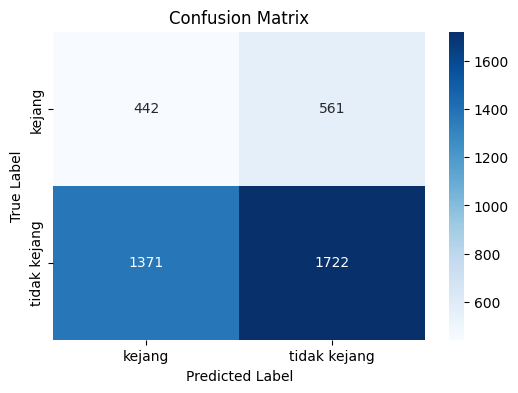

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Prediksi pada data latih
y_train_pred = clf.predict(X_train)

# Evaluasi akurasi
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_pred)

print(f"Akurasi pada data latih: {train_accuracy:.4f}")
print(f"Akurasi pada data uji: {test_accuracy:.4f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


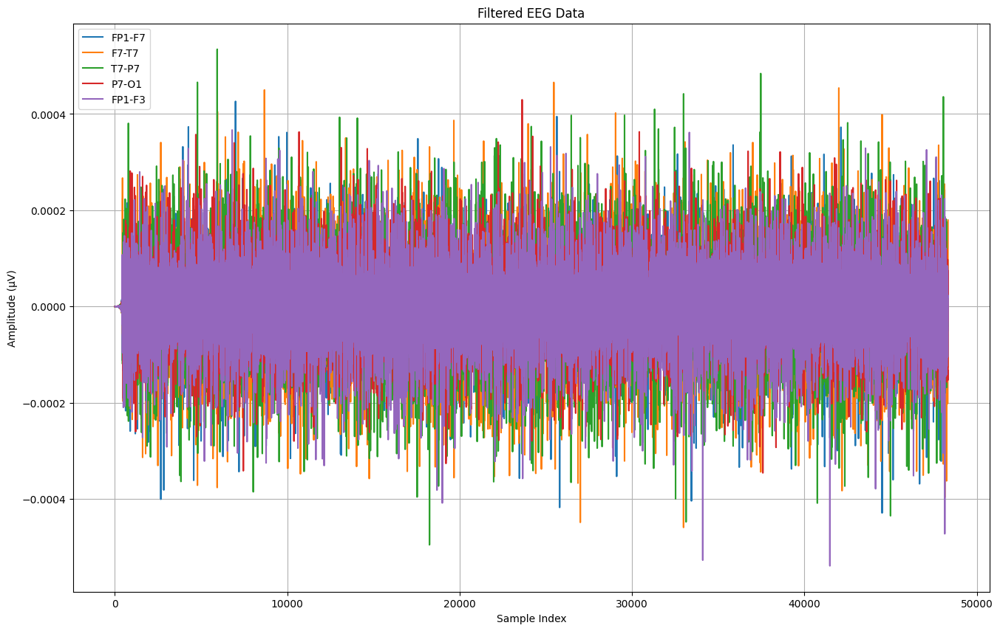

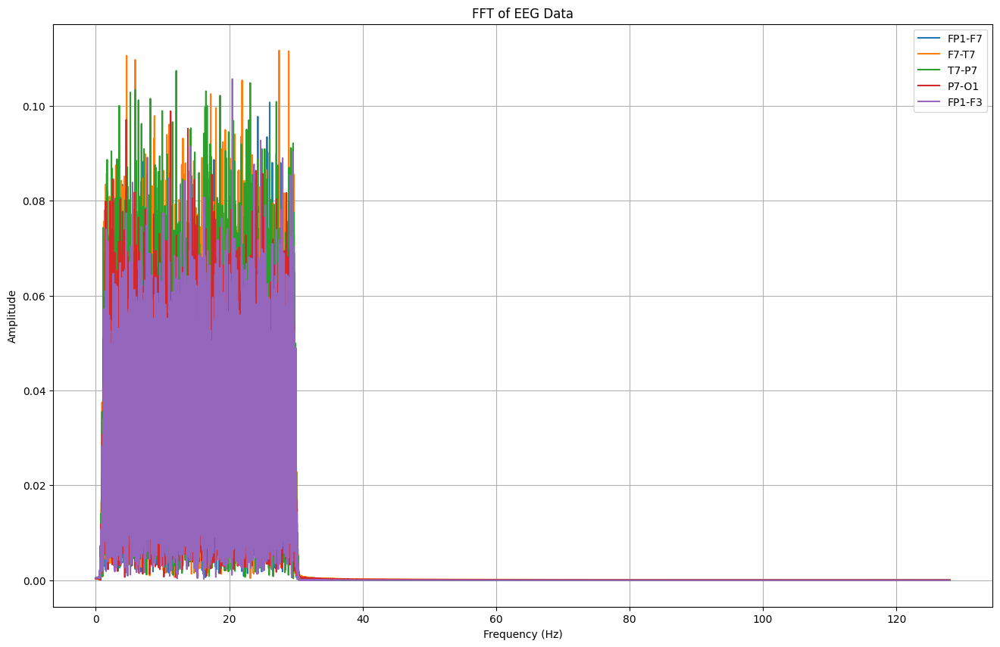

Akurasi Data Latih: 1.0
Akurasi Data Uji: 0.48295266468056935
Laporan Klasifikasi Data Uji:
               precision    recall  f1-score   support

      kejang       0.48      0.84      0.62      2968
tidak kejang       0.47      0.14      0.21      3074

    accuracy                           0.48      6042
   macro avg       0.48      0.49      0.41      6042
weighted avg       0.48      0.48      0.41      6042



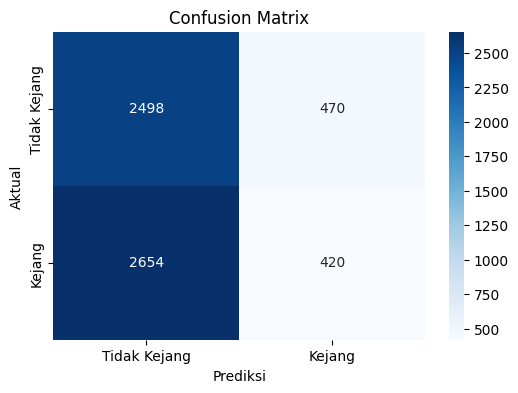

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import firwin, lfilter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# 1. Import data yang sudah diberi label
df = pd.read_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv")

# 2. Bagi data menjadi data latih dan uji secara stratified
X = df.drop(['Time', 'seizure'], axis=1)
y = df['seizure']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Simpan data latih dan uji
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)
train_df.to_csv("/content/drive/MyDrive/TA/SPLIT_train.csv", index=False)
test_df.to_csv("/content/drive/MyDrive/TA/SPLIT_test.csv", index=False)

# 3. Terapkan Bandpass Filter (1-30 Hz, Hamming window)
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    return lfilter(taps, 1.0, data, axis=0)

lowcut, highcut, sampling_rate, num_taps = 1, 30, 256, 846

X_train_filtered = bandpass_filter_fir(X_train.values, lowcut, highcut, sampling_rate, num_taps)
X_test_filtered = bandpass_filter_fir(X_test.values, lowcut, highcut, sampling_rate, num_taps)

train_filtered_df = pd.DataFrame(X_train_filtered, columns=X_train.columns)
test_filtered_df = pd.DataFrame(X_test_filtered, columns=X_test.columns)
train_filtered_df['seizure'] = y_train.values
test_filtered_df['seizure'] = y_test.values

# 5. Simpan data setelah filtering
train_filtered_df.to_csv("/content/drive/MyDrive/TA/FILTERING_train_filtered.csv", index=False)
test_filtered_df.to_csv("/content/drive/MyDrive/TA/FILTERING_test_filtered.csv", index=False)

# 4. Visualisasi data setelah filtering
plt.figure(figsize=(16, 10))
for channel in X_train.columns[:5]:  # Visualisasi contoh 5 channel pertama
    plt.plot(train_filtered_df.index, train_filtered_df[channel], label=channel)
plt.title('Filtered EEG Data')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude (µV)')
plt.legend()
plt.grid()
plt.show()

# 6. Terapkan FFT
def compute_fft(signal, sampling_rate):
    N = len(signal)
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, 1.0 / sampling_rate)
    return fft_freqs[:N // 2], np.abs(fft_vals[:N // 2])

fft_train, fft_test = [], []
for channel in X_train.columns:
    freqs, fft_vals_train = compute_fft(train_filtered_df[channel].values, sampling_rate)
    _, fft_vals_test = compute_fft(test_filtered_df[channel].values, sampling_rate)
    fft_train.append(fft_vals_train)
    fft_test.append(fft_vals_test)

# ... (previous code) ...

fft_train_df = pd.DataFrame(np.array(fft_train).T, columns=X_train.columns)
fft_test_df = pd.DataFrame(np.array(fft_test).T, columns=X_test.columns)

# Adjust the length of y_train before assigning it
fft_train_df['seizure'] = y_train.values[:len(fft_train_df)]  #  Slice y_train to match fft_train_df length
fft_test_df['seizure'] = y_test.values[:len(fft_test_df)]    # Slice y_test to match fft_test_df length

# ... (rest of the code) ...

# 7. Simpan data setelah FFT
fft_train_df.to_csv("/content/drive/MyDrive/TA/FFT_train_fft.csv", index=False)
fft_test_df.to_csv("/content/drive/MyDrive/TA/FFT_test_fft.csv", index=False)

# 6. Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))
for channel in X_train.columns[:5]:
    plt.plot(freqs, fft_train_df[channel], label=channel)
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid()
plt.show()

# 8. Klasifikasi dengan Random Forest
X_train_fft = fft_train_df.drop('seizure', axis=1)
X_test_fft = fft_test_df.drop('seizure', axis=1)
y_train_fft = fft_train_df['seizure']
y_test_fft = fft_test_df['seizure']

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_fft, y_train_fft)
y_pred_train = model.predict(X_train_fft)
y_pred_test = model.predict(X_test_fft)

# 9. Evaluasi Model
print("Akurasi Data Latih:", accuracy_score(y_train_fft, y_pred_train))
print("Akurasi Data Uji:", accuracy_score(y_test_fft, y_pred_test))
print("Laporan Klasifikasi Data Uji:\n", classification_report(y_test_fft, y_pred_test))

# 10. Confusion Matrix
cm = confusion_matrix(y_test_fft, y_pred_test)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()


# mboh

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import firwin, lfilter
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# 1. Import data yang sudah diberi label
df = pd.read_csv("/content/drive/MyDrive/TA/LABEL/chb05_06.csv")

# 2. Pisahkan fitur (X) dan label (y) TANPA menghapus "Time"
X = df.drop(['seizure'], axis=1)  # Time tetap dipertahankan
y = df['seizure']

# 3. Bagi data menjadi latih dan uji secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 4. Gabungkan kembali "Time" dan label "seizure"
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

# 5. Simpan data latih dan uji ke file CSV
train_df.to_csv("/content/drive/MyDrive/TA/SPLIT_train.csv", index=False)
test_df.to_csv("/content/drive/MyDrive/TA/SPLIT_test.csv", index=False)

print("Data latih dan uji berhasil disimpan dengan kolom 'Time' tetap ada.")

Data latih dan uji berhasil disimpan dengan kolom 'Time' tetap ada.


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/TA/SPLIT_train.csv")
df

,FP1-F7,F7-T7,T7-P7,P7-O1,FP1-F3,F3-C3,C3-P3,P3-O1,FP2-F4,F4-C4,...,P8-O2,FZ-CZ,CZ-PZ,P7-T7,T7-FT9,FT9-FT10,FT10-T8,T8-P8-1,Time,seizure
0,0.000001,0.000046,-0.000004,-0.000076,-0.000008,-1.543346e-05,4.493284e-06,-0.000011,1.191697e-05,-0.000002,...,-0.000072,-4.004884e-05,0.000008,0.000004,-0.000009,-0.000024,0.000022,0.000031,3077.675781,tidak kejang
1,-0.000040,-0.000006,0.000013,0.000053,-0.000020,5.860806e-07,1.953602e-07,0.000039,-3.809524e-05,0.000016,...,0.000024,8.400488e-06,0.000006,-0.000013,0.000016,0.000015,0.000014,-0.000021,3045.476562,tidak kejang
2,0.000024,-0.000054,0.000030,-0.000044,0.000061,-1.347985e-05,-6.837607e-06,-0.000083,-1.699634e-05,-0.000003,...,-0.000026,-1.621490e-05,-0.000028,-0.000030,-0.000022,0.000034,0.000027,-0.000023,3056.820312,tidak kejang
3,0.000012,0.000034,0.000010,0.000024,-0.000002,4.434676e-05,-1.387057e-05,0.000054,1.387057e-05,0.000048,...,-0.000043,4.630037e-05,0.000025,-0.000009,-0.000026,0.000053,0.000029,0.000013,3071.144531,tidak kejang
4,-0.000057,-0.000046,0.000021,0.000041,-0.000026,-3.965812e-05,2.012210e-05,0.000006,3.770452e-05,-0.000024,...,0.000022,5.860806e-07,0.000012,-0.000021,0.000039,0.000083,-0.000038,-0.000017,3074.453125,tidak kejang
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32763,0.000027,0.000069,-0.000061,-0.000056,-0.000094,3.848596e-05,1.894994e-05,0.000014,-1.010012e-04,-0.000015,...,0.000003,6.466422e-05,0.000021,0.000062,-0.000051,-0.000055,-0.000049,-0.000016,3008.230469,kejang
32764,0.000015,0.000055,-0.000029,-0.000080,-0.000012,2.949939e-05,-1.035409e-05,-0.000046,-3.536020e-05,-0.000006,...,-0.000062,-1.230769e-05,-0.000016,0.000030,-0.000025,-0.000025,-0.000028,0.000024,3011.988281,kejang
32765,-0.000016,0.000210,0.000019,-0.000131,-0.000024,1.443712e-04,-7.228327e-06,-0.000030,1.953602e-07,-0.000018,...,0.000017,2.539683e-06,-0.000004,-0.000018,-0.000109,-0.000029,-0.000007,-0.000004,3005.066406,kejang
32766,0.000028,-0.000087,-0.000029,0.000012,0.000079,-6.114774e-05,-7.365079e-05,-0.000019,2.793651e-05,-0.000032,...,0.000005,-2.207570e-05,-0.000061,0.000029,0.000047,-0.000023,-0.000004,-0.000044,2937.601562,tidak kejang


In [ ]:
# 3. Definisikan fungsi Band-Pass Filter (1-30 Hz) menggunakan Hamming Window
def bandpass_filter(data, lowcut, highcut, fs, num_taps=846):
    nyquist = 0.5 * fs  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], window="hamming", pass_zero=False)
    return lfilter(taps, 1.0, data, axis=0)

# 4. Terapkan filter pada data EEG
fs = 256  # Sampling rate (Hz)
lowcut, highcut = 1, 30  # Rentang frekuensi (Hz)

X_train_filtered = bandpass_filter(X_train.values, lowcut, highcut, fs)
X_test_filtered = bandpass_filter(X_test.values, lowcut, highcut, fs)

# 5. Simpan data yang sudah difilter kembali ke DataFrame
X_train_filtered_df = pd.DataFrame(X_train_filtered, columns=X_train.columns)
X_test_filtered_df = pd.DataFrame(X_test_filtered, columns=X_test.columns)

# 6. Gabungkan dengan label kembali
train_filtered_df = pd.concat([X_train_filtered_df, y_train.reset_index(drop=True)], axis=1)
test_filtered_df = pd.concat([X_test_filtered_df, y_test.reset_index(drop=True)], axis=1)

# 7. Simpan data latih dan uji yang sudah difilter
train_filtered_df.to_csv("/content/drive/MyDrive/TA/SPLIT_TRAIN_FILTERED.csv", index=False)
test_filtered_df.to_csv("/content/drive/MyDrive/TA/SPLIT_TEST_FILTERED.csv", index=False)

print("Proses filtering selesai. Data tersimpan.")

Proses filtering selesai. Data tersimpan.


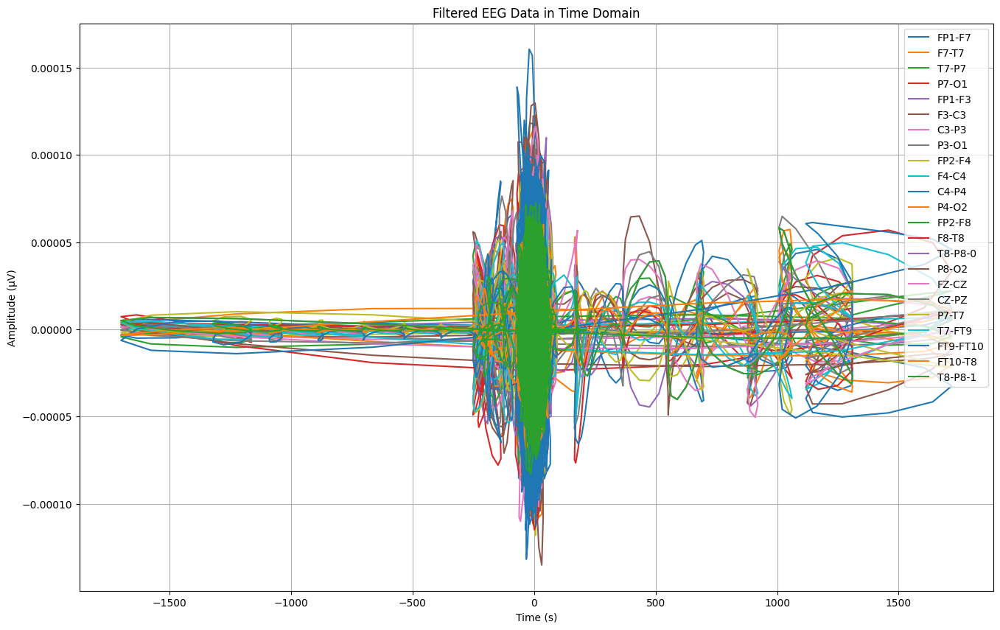

In [ ]:
# Visualisasi data setelah filtering
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan data dari kanal yang dipilih
for channel in channels:
    if channel in train_filtered_df.columns:
        plt.plot(train_filtered_df['Time'], train_filtered_df[channel], label=channel)

# Menambahkan judul dan label
plt.title('Filtered EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Proses FFT selesai. Data tersimpan.


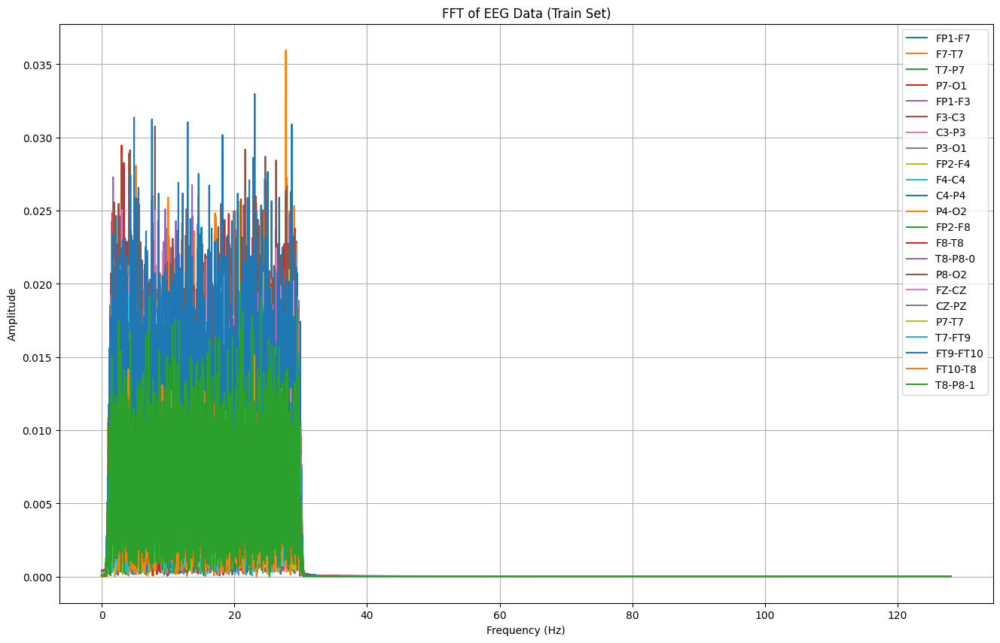

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Import data train dan test yang sudah difilter
train_filtered_df = pd.read_csv("/content/drive/MyDrive/TA/SPLIT_TRAIN_FILTERED.csv")
test_filtered_df = pd.read_csv("/content/drive/MyDrive/TA/SPLIT_TEST_FILTERED.csv")

# 2. Simpan kolom "Time" dan "seizure" agar tidak diproses oleh FFT
time_train = train_filtered_df["Time"]
time_test = test_filtered_df["Time"]
seizure_train = train_filtered_df["seizure"]
seizure_test = test_filtered_df["seizure"]

# 3. Hilangkan kolom "Time" dan "seizure" sebelum FFT
X_train = train_filtered_df.drop(columns=["Time", "seizure"])
X_test = test_filtered_df.drop(columns=["Time", "seizure"])

# 4. Daftar nama channel EEG
channels = X_train.columns  # Menggunakan kolom dari data train sebagai daftar channel

# 5. Fungsi FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate=256):
    """Menghitung FFT dari sinyal EEG dan mengambil frekuensi positif."""
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])  # Ambil magnitudo FFT positif
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# 6. Proses FFT pada setiap channel untuk data train
train_fft_features = []
for channel in channels:
    fft_freqs, fft_vals = compute_fft(X_train[channel].values)
    train_fft_features.append(fft_vals)

# 7. Proses FFT pada setiap channel untuk data test
test_fft_features = []
for channel in channels:
    fft_freqs, fft_vals = compute_fft(X_test[channel].values)
    test_fft_features.append(fft_vals)

# 8. Mengubah fitur FFT menjadi DataFrame
train_fft_df = pd.DataFrame(np.array(train_fft_features).T, columns=channels)
test_fft_df = pd.DataFrame(np.array(test_fft_features).T, columns=channels)

# 9. Tambahkan kembali kolom "Time" dan "seizure"
train_fft_df.insert(0, "Time", time_train[:len(train_fft_df)])
train_fft_df["seizure"] = seizure_train[:len(train_fft_df)]
test_fft_df.insert(0, "Time", time_test[:len(test_fft_df)])
test_fft_df["seizure"] = seizure_test[:len(test_fft_df)]

# 10. Simpan hasil FFT ke file CSV
train_fft_df.to_csv("/content/drive/MyDrive/TA/SPLIT_TRAIN_FFT.csv", index=False)
test_fft_df.to_csv("/content/drive/MyDrive/TA/SPLIT_TEST_FFT.csv", index=False)

print("Proses FFT selesai. Data tersimpan.")

# 11. Visualisasi FFT dari beberapa channel
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']


for channel in channels:
    fft_freqs, fft_vals = compute_fft(X_train[channel].values)
    plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data (Train Set)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


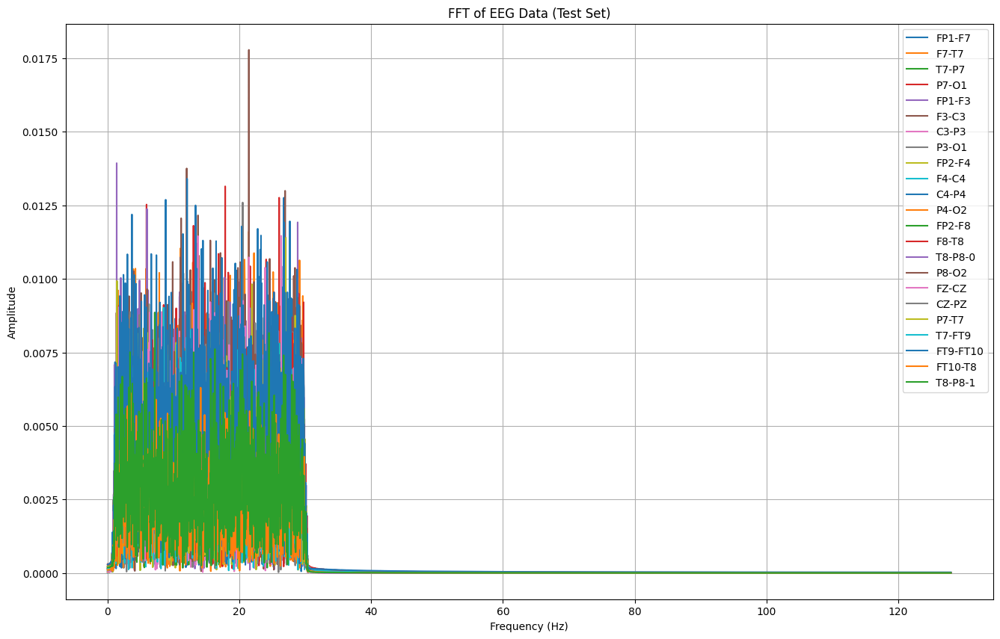

In [ ]:
# 11. Visualisasi FFT dari beberapa channel
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']


for channel in channels:
    fft_freqs, fft_vals = compute_fft(X_test[channel].values)
    plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data (Test Set)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Akurasi Data Latih: 1.0
Akurasi Data Uji: 0.4306640625
Laporan Klasifikasi Data Uji:
               precision    recall  f1-score   support

      kejang       0.25      0.64      0.36      1003
tidak kejang       0.76      0.36      0.49      3093

    accuracy                           0.43      4096
   macro avg       0.50      0.50      0.42      4096
weighted avg       0.63      0.43      0.46      4096



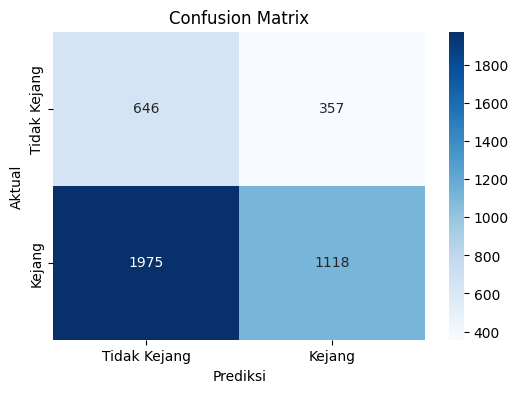

In [ ]:
fft_train_df = pd.read_csv("/content/drive/MyDrive/TA/SPLIT_TRAIN_FFT.csv")
fft_test_df = pd.read_csv("/content/drive/MyDrive/TA/SPLIT_TEST_FFT.csv")


# 8. Klasifikasi dengan Random Forest
X_train_fft = fft_train_df.drop('seizure', axis=1)
X_test_fft = fft_test_df.drop('seizure', axis=1)
y_train_fft = fft_train_df['seizure']
y_test_fft = fft_test_df['seizure']

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_fft, y_train_fft)
y_pred_train = model.predict(X_train_fft)
y_pred_test = model.predict(X_test_fft)

# 9. Evaluasi Model
print("Akurasi Data Latih:", accuracy_score(y_train_fft, y_pred_train))
print("Akurasi Data Uji:", accuracy_score(y_test_fft, y_pred_test))
print("Laporan Klasifikasi Data Uji:\n", classification_report(y_test_fft, y_pred_test))

# 10. Confusion Matrix
cm = confusion_matrix(y_test_fft, y_pred_test)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb04_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-3-8fa57f5c1a53>:13: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data20_1 = mne.io.read_raw_edf(data20_1)
<ipython-input-3-8fa57f5c1a53>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_20_1['seizure'] = df_20_1.apply(label_seizure, axis=1)


Akurasi: 0.502151605428666
Laporan Klasifikasi:
               precision    recall  f1-score   support

      kejang       0.49      0.22      0.30      5940
tidak kejang       0.51      0.78      0.61      6144

    accuracy                           0.50     12084
   macro avg       0.50      0.50      0.46     12084
weighted avg       0.50      0.50      0.46     12084



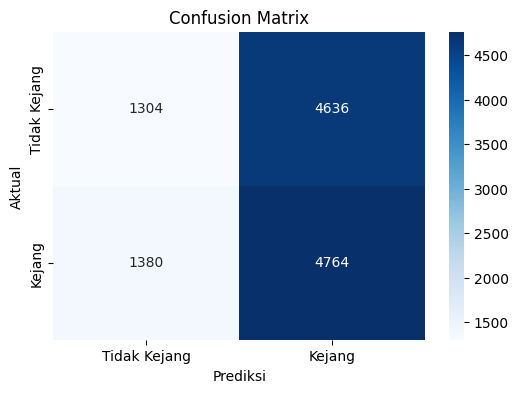

In [ ]:
import mne
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
import numpy as np  # Import numpy
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns  # Import seaborn

# 3. Load data EEG dari file EDF
data20_1 = "/content/drive/MyDrive/TA/EDF/chb04_28.edf"
data20_1 = mne.io.read_raw_edf(data20_1)
data20_1

data, times = data20_1.get_data(return_times=True)
channel_names = data20_1.ch_names

# 4. Ekstrak data dan simpan ke DataFrame pandas
df20_1 = pd.DataFrame(data.T, columns=channel_names)
df20_1['Time'] = times

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8', '1']
time = df20_1['Time']

# Step 5: Potong data
sample_rate = 256

# Tentukan rentang waktu analisis
start_time_seconds = 3722
end_time_seconds = 3958

# Potong data berdasarkan waktu -> Simpan ke CSV
start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_20_1 = df20_1.iloc[start_index:end_index]

# Menyimpan data yang sudah di potong
df_20_1.to_csv("/content/drive/MyDrive/TA/SAMPEL/chb04_28_1.csv", index=False)

# Step 8: Tambahkan label kejang/tidak kejang
def label_seizure(row):
    if row['Time'] < 3782:
        return "tidak kejang"
    elif 3782 <= row['Time'] < 3898:
        return "kejang"
    else:
        return "tidak kejang"

df_20_1['seizure'] = df_20_1.apply(label_seizure, axis=1)

# Simpan data yang sudah diberi label ke file CSV
df_20_1.to_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv", index=False)

# **Langkah Pemisahan Data Latih dan Uji**
X = df_20_1.drop(['Time', 'seizure'], axis=1)  # Fitur
y = df_20_1['seizure']  # Label

# Pisahkan data latih dan uji secara stratified (80% latih, 20% uji)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# **Fungsi untuk Bandpass Filter**
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Definisi parameter filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846

# Terapkan filter bandpass pada data latih dan uji secara terpisah
train_filtered = bandpass_filter_fir(X_train.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)
test_filtered = bandpass_filter_fir(X_test.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Simpan hasil filter dalam DataFrame
X_train_filtered = pd.DataFrame(train_filtered, columns=X_train.columns)
X_test_filtered = pd.DataFrame(test_filtered, columns=X_test.columns)

# Tambahkan label kejang pada data latih dan uji
X_train_filtered['seizure'] = y_train.values
X_test_filtered['seizure'] = y_test.values

# **Fungsi untuk Menghitung FFT**
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    return fft_freqs, np.abs(fft_vals)

# Terapkan FFT pada data latih dan uji secara terpisah
def apply_fft_to_dataset(filtered_df, sampling_rate):
    fft_features = []
    fft_freqs = None  # Simpan frekuensi hanya sekali

    for channel in filtered_df.columns[:-1]:  # Kecuali kolom 'seizure'
        signal = filtered_df[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

    # Sesuaikan panjang data FFT dengan panjang data asli
    fft_data = np.array(fft_features).T
    while len(fft_data) < len(filtered_df):
        fft_data = np.pad(fft_data, ((0, len(filtered_df) - len(fft_data)), (0, 0)), mode='constant')

    # Simpan hasil FFT ke dalam DataFrame
    df_fft = pd.DataFrame(fft_data)
    df_fft['frekuensi'] = fft_freqs
    df_fft['seizure'] = filtered_df['seizure'].values

    return df_fft

# Terapkan FFT pada data latih dan uji
X_train_fft = apply_fft_to_dataset(X_train_filtered, sampling_rate)
X_test_fft = apply_fft_to_dataset(X_test_filtered, sampling_rate)

# **Model Klasifikasi Random Forest**
# Pisahkan fitur dan label untuk data latih dan uji setelah FFT
X_train_final = X_train_fft.drop(['seizure', 'frekuensi'], axis=1)
y_train_final = X_train_fft['seizure']
X_test_final = X_test_fft.drop(['seizure', 'frekuensi'], axis=1)
y_test_final = X_test_fft['seizure']

# Latih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_final, y_train_final)

# Prediksi data uji
y_pred = model.predict(X_test_final)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test_final, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test_final, y_pred))

# Matriks Evaluasi
cm = confusion_matrix(y_test_final, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
import mne
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
import numpy as np  # Import numpy
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns # Import seaborn

# 3. Load data EEG dari file EDF
data20_1 = "/content/drive/MyDrive/TA/EDF/chb04_28.edf"
data20_1 = mne.io.read_raw_edf(data20_1)
data20_1

data, times = data20_1.get_data(return_times=True)
channel_names = data20_1.ch_names

# 4. Ekstrak data dan simpan ke DataFrame pandas
df20_1 = pd.DataFrame(data.T, columns=channel_names)
df20_1['Time'] = times

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df20_1['Time']

# Step 5: Potong data
sample_rate = 256

# Tentukan rentang waktu analisis
start_time_seconds = 3722
end_time_seconds = 3958

# Potong data berdasarkan waktu -> Simpan ke CSV
start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_20_1 = df20_1.iloc[start_index:end_index]

# Menyimpan data yang sudah di potong
df_20_1.to_csv("/content/drive/MyDrive/TA/SAMPEL/chb04_28_1.csv", index=False)

# Step 8: Tambahkan label kejang/tidak kejang
def label_seizure(row):
    if row['Time'] < 3782:
        return "tidak kejang"
    elif 3782 <= row['Time'] < 3898:
        return "kejang"
    else:
        return "tidak kejang"

df_20_1['seizure'] = df_20_1.apply(label_seizure, axis=1)

# Simpan data yang sudah diberi label ke file CSV
df_20_1.to_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv", index=False)

# **Langkah Pemisahan Data Latih dan Uji**
# Langkah ini dilakukan sebelum preprocessing
X = df_20_1.drop(['Time', 'seizure'], axis=1)  # Fitur
y = df_20_1['seizure']  # Label

# Pisahkan data latih dan uji secara stratified (80% latih, 20% uji)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# **Fungsi untuk Bandpass Filter**
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Definisi parameter filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846

# Terapkan filter bandpass pada data latih dan uji
train_filtered = bandpass_filter_fir(X_train.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)
test_filtered = bandpass_filter_fir(X_test.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Simpan hasil filter dalam DataFrame
X_train_filtered = pd.DataFrame(train_filtered, columns=X_train.columns)
X_test_filtered = pd.DataFrame(test_filtered, columns=X_test.columns)

# Tambahkan label kejang pada data latih dan uji
X_train_filtered['seizure'] = y_train.values
X_test_filtered['seizure'] = y_test.values

# **Fungsi untuk Menghitung FFT**
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])  # Ambil setengah dari spektrum
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi yang relevan
    return fft_freqs, fft_vals

# Terapkan FFT pada data latih dan uji
def apply_fft_to_dataset(filtered_df, sampling_rate):
    fft_features = []
    fft_freqs = None  # Simpan frekuensi hanya sekali

    for channel in filtered_df.columns[:-1]:  # Kecuali kolom 'seizure'
        signal = filtered_df[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

    # Sesuaikan panjang data FFT dengan panjang data asli
    fft_data = np.array(fft_features).T
    while len(fft_data) < len(filtered_df):
        fft_data = np.pad(fft_data, ((0, len(filtered_df) - len(fft_data)), (0, 0)), mode='constant')

    # Simpan hasil FFT ke dalam DataFrame
    df_fft = pd.DataFrame(fft_data)
    df_fft['frekuensi'] = fft_freqs
    df_fft['seizure'] = filtered_df['seizure'].values

    return df_fft

# Terapkan FFT pada data latih dan uji
X_train_fft = apply_fft_to_dataset(X_train_filtered, sampling_rate)
X_test_fft = apply_fft_to_dataset(X_test_filtered, sampling_rate)

# **Model Klasifikasi Random Forest**
# Pisahkan fitur dan label untuk data latih dan uji setelah FFT
X_train_final = X_train_fft.drop(['seizure', 'frekuensi'], axis=1)
y_train_final = X_train_fft['seizure']
X_test_final = X_test_fft.drop(['seizure', 'frekuensi'], axis=1)
y_test_final = X_test_fft['seizure']

# Latih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_final, y_train_final)

# Prediksi data uji
y_pred = model.predict(X_test_final)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test_final, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test_final, y_pred))

# Matriks Evaluasi
cm = confusion_matrix(y_test_final, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb04_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-15-18a10222c453>:13: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data20_1 = mne.io.read_raw_edf(data20_1)
<ipython-input-15-18a10222c453>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_20_1['seizure'] = df_20_1.apply(label_seizure, axis=1)


ValueError: Length of values (24166) does not match length of index (48332)

In [ ]:
# Step 1: Load data EEG dengan label
df_20_1 = pd.read_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv")
# **Langkah Pemisahan Data Latih dan Uji**
# Langkah ini dilakukan sebelum preprocessing
X = df_20_1.drop(['Time', 'seizure'], axis=1)  # Fitur
y = df_20_1['seizure']  # Label

# Pisahkan data latih dan uji secara stratified (80% latih, 20% uji)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# **Fungsi untuk Bandpass Filter**
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Definisi parameter filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846

# Terapkan filter bandpass pada data latih dan uji
train_filtered = bandpass_filter_fir(X_train.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)
test_filtered = bandpass_filter_fir(X_test.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Simpan hasil filter dalam DataFrame
X_train_filtered = pd.DataFrame(train_filtered, columns=X_train.columns)
X_test_filtered = pd.DataFrame(test_filtered, columns=X_test.columns)

# Tambahkan label kejang pada data latih dan uji
X_train_filtered['seizure'] = y_train.values
X_test_filtered['seizure'] = y_test.values

# **Fungsi untuk Menghitung FFT**
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Terapkan FFT pada data latih dan uji
def apply_fft_to_dataset(filtered_df, sampling_rate):
    fft_features = []
    fft_freqs = None  # Simpan frekuensi hanya sekali

    for channel in filtered_df.columns[:-1]:  # Kecuali kolom 'seizure'
        signal = filtered_df[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

    # Simpan hasil FFT ke dalam DataFrame
    df_fft = pd.DataFrame(fft_features).T
    df_fft['frekuensi'] = fft_freqs
    df_fft['seizure'] = df_fft['seizure'].values

    return df_fft

# Terapkan FFT pada data latih dan uji
X_train_fft = apply_fft_to_dataset(X_train_filtered, sampling_rate)
X_test_fft = apply_fft_to_dataset(X_test_filtered, sampling_rate)

# **Model Klasifikasi Random Forest**
# Pisahkan fitur dan label untuk data latih dan uji setelah FFT
X_train_final = X_train_fft.drop(['seizure', 'frekuensi'], axis=1)
y_train_final = X_train_fft['seizure']
X_test_final = X_test_fft.drop(['seizure', 'frekuensi'], axis=1)
y_test_final = X_test_fft['seizure']

# Latih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_final, y_train_final)

# Prediksi data uji
y_pred = model.predict(X_test_final)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test_final, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test_final, y_pred))

# Matriks Evaluasi
cm = confusion_matrix(y_test_final, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()

KeyError: 'seizure'

Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb04_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-18-a72115566422>:13: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data20_1 = mne.io.read_raw_edf(data20_1)
<ipython-input-18-a72115566422>:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_20_1['seizure'] = df_20_1.apply(label_seizure, axis=1)


Akurasi: 0.502151605428666
Laporan Klasifikasi:
               precision    recall  f1-score   support

      kejang       0.49      0.22      0.30      5940
tidak kejang       0.51      0.78      0.61      6144

    accuracy                           0.50     12084
   macro avg       0.50      0.50      0.46     12084
weighted avg       0.50      0.50      0.46     12084



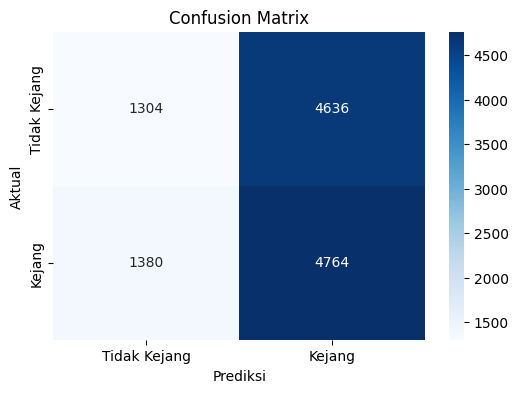

In [ ]:
import mne
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
import numpy as np  # Import numpy
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns # Import seaborn

# 3. Load data EEG dari file EDF
data20_1 = "/content/drive/MyDrive/TA/EDF/chb04_28.edf"
data20_1 = mne.io.read_raw_edf(data20_1)
data20_1

data, times = data20_1.get_data(return_times=True)
channel_names = data20_1.ch_names

# 4. Ekstrak data dan simpan ke DataFrame pandas
df20_1 = pd.DataFrame(data.T, columns=channel_names)
df20_1['Time'] = times

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8', '1']
time = df20_1['Time']

# Step 5: Potong data
sample_rate = 256

# Tentukan rentang waktu analisis
start_time_seconds = 3722
end_time_seconds = 3958

# Potong data berdasarkan waktu -> Simpan ke CSV
start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_20_1 = df20_1.iloc[start_index:end_index]

# Menyimpan data yang sudah di potong
df_20_1.to_csv("/content/drive/MyDrive/TA/SAMPEL/chb04_28_1.csv", index=False)

# Step 8: Tambahkan label kejang/tidak kejang
def label_seizure(row):
    if row['Time'] < 3782:
        return "tidak kejang"
    elif 3782 <= row['Time'] < 3898:
        return "kejang"
    else:
        return "tidak kejang"

df_20_1['seizure'] = df_20_1.apply(label_seizure, axis=1)

# Simpan data yang sudah diberi label ke file CSV
df_20_1.to_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv", index=False)

# **Langkah Pemisahan Data Latih dan Uji**
# Langkah ini dilakukan sebelum preprocessing
X = df_20_1.drop(['Time', 'seizure'], axis=1)  # Fitur
y = df_20_1['seizure']  # Label

# Pisahkan data latih dan uji secara stratified (80% latih, 20% uji)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# **Fungsi untuk Bandpass Filter**
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Definisi parameter filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846

# Terapkan filter bandpass pada data latih dan uji
train_filtered = bandpass_filter_fir(X_train.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)
test_filtered = bandpass_filter_fir(X_test.values, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Simpan hasil filter dalam DataFrame
X_train_filtered = pd.DataFrame(train_filtered, columns=X_train.columns)
X_test_filtered = pd.DataFrame(test_filtered, columns=X_test.columns)

# Tambahkan label kejang pada data latih dan uji
X_train_filtered['seizure'] = y_train.values
X_test_filtered['seizure'] = y_test.values

# **Fungsi untuk Menghitung FFT**
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    # Ambil spektrum penuh tanpa pemotongan
    return fft_freqs, np.abs(fft_vals)

# Terapkan FFT pada data latih dan uji
def apply_fft_to_dataset(filtered_df, sampling_rate):
    fft_features = []
    fft_freqs = None  # Simpan frekuensi hanya sekali

    for channel in filtered_df.columns[:-1]:  # Kecuali kolom 'seizure'
        signal = filtered_df[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

    # Sesuaikan panjang data FFT dengan panjang data asli
    fft_data = np.array(fft_features).T
    while len(fft_data) < len(filtered_df):
        fft_data = np.pad(fft_data, ((0, len(filtered_df) - len(fft_data)), (0, 0)), mode='constant')

    # Simpan hasil FFT ke dalam DataFrame
    df_fft = pd.DataFrame(fft_data)
    df_fft['frekuensi'] = fft_freqs
    df_fft['seizure'] = filtered_df['seizure'].values

    return df_fft

# Terapkan FFT pada data latih dan uji
X_train_fft = apply_fft_to_dataset(X_train_filtered, sampling_rate)
X_test_fft = apply_fft_to_dataset(X_test_filtered, sampling_rate)

# **Model Klasifikasi Random Forest**
# Pisahkan fitur dan label untuk data latih dan uji setelah FFT
X_train_final = X_train_fft.drop(['seizure', 'frekuensi'], axis=1)
y_train_final = X_train_fft['seizure']
X_test_final = X_test_fft.drop(['seizure', 'frekuensi'], axis=1)
y_test_final = X_test_fft['seizure']

# Latih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train_final, y_train_final)

# Prediksi data uji
y_pred = model.predict(X_test_final)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test_final, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test_final, y_pred))

# Matriks Evaluasi
cm = confusion_matrix(y_test_final, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
# Step 1: Load data EEG dengan label
df_20_1 = pd.read_csv("/content/drive/MyDrive/TA/LABEL/chb04_28_1.csv")

# Step 2: Split data sebelum preprocessing
X = df_20_1.drop(['seizure'], axis=1)  # Jangan drop 'Time' dulu kalau diperlukan
y = df_20_1['seizure']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Simpan sebagai DataFrame
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)


In [ ]:
# 3. Definisikan fungsi Band-Pass Filter (1-30 Hz) menggunakan Hamming Window
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846

# Terapkan filtering pada data train dan test secara terpisah
train_filtered = bandpass_filter_fir(X_train.drop(['Time'], axis=1), lowcut_freq, highcut_freq, sampling_rate, num_taps)
test_filtered = bandpass_filter_fir(X_test.drop(['Time'], axis=1), lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Simpan hasil filtering dalam DataFrame
train_filtered_df = pd.DataFrame(train_filtered, columns=X_train.columns[:-1])
test_filtered_df = pd.DataFrame(test_filtered, columns=X_test.columns[:-1])

train_filtered_df['Time'] = X_train['Time'].values
test_filtered_df['Time'] = X_test['Time'].values
train_filtered_df['seizure'] = y_train.values
test_filtered_df['seizure'] = y_test.values


Data FFT untuk train disimpan dalam: /content/drive/MyDrive/TA/FFT_train_fft.csv
Data FFT untuk test disimpan dalam: /content/drive/MyDrive/TA/FFT_test_fft.csv


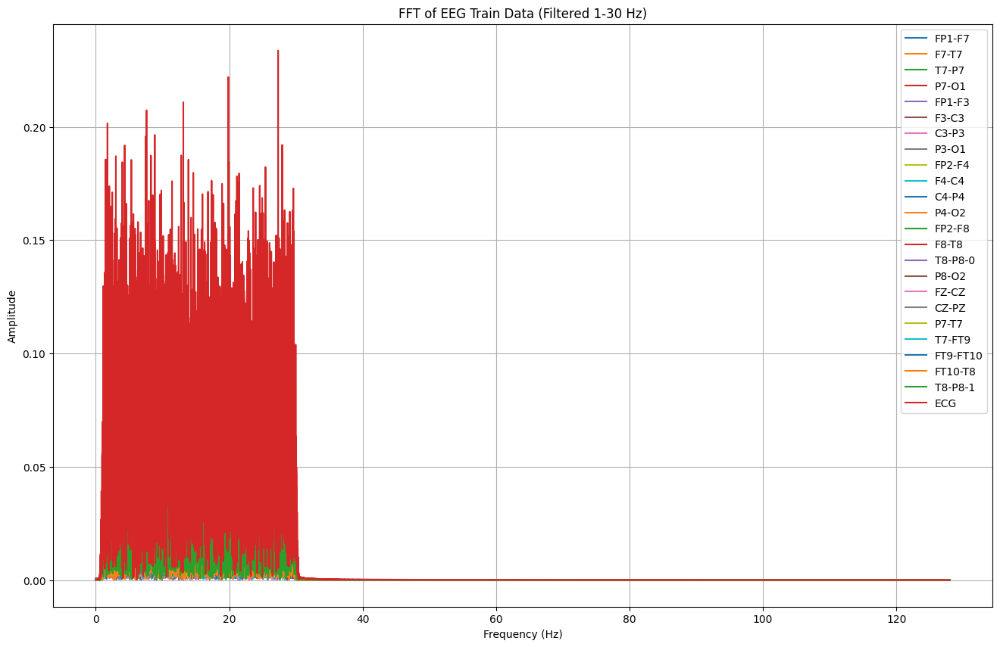

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter

# 1. Fungsi Band-Pass Filter (1-30 Hz) menggunakan FIR dengan Hamming Window
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# 2. Fungsi untuk menghitung FFT
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval waktu antar sampel
    fft_vals = np.fft.fft(signal)  # FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi FFT
    fft_vals = np.abs(fft_vals[:N // 2])  # Ambil hanya bagian positif
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# 3. Definisi parameter filtering
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846  # Jumlah koefisien filter

# 4. Terapkan filtering pada data train dan test
train_filtered = bandpass_filter_fir(X_train.drop(['Time'], axis=1), lowcut_freq, highcut_freq, sampling_rate, num_taps)
test_filtered = bandpass_filter_fir(X_test.drop(['Time'], axis=1), lowcut_freq, highcut_freq, sampling_rate, num_taps)

# 5. Simpan hasil filtering dalam DataFrame
train_filtered_df = pd.DataFrame(train_filtered, columns=X_train.columns[:-1])
test_filtered_df = pd.DataFrame(test_filtered, columns=X_test.columns[:-1])

train_filtered_df['Time'] = X_train['Time'].values
test_filtered_df['Time'] = X_test['Time'].values
train_filtered_df['seizure'] = y_train.values
test_filtered_df['seizure'] = y_test.values

# 6. Terapkan FFT pada data train dan test
def apply_fft_to_dataset(filtered_df, sampling_rate):
    channels = filtered_df.columns[:-2]  # Semua kolom kecuali 'Time' dan 'seizure'
    fft_features = []
    fft_freqs = None  # Simpan frekuensi hanya sekali

    for channel in channels:
        signal = filtered_df[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

    # Simpan hasil FFT ke dalam DataFrame
    df_fft = pd.DataFrame(fft_features).T
    df_fft.columns = channels  # Set nama kolom sesuai dengan channel EEG
    df_fft['frekuensi'] = fft_freqs  # Tambahkan kolom frekuensi
    df_fft['seizure'] = filtered_df['seizure']  # Salin label kejang/tidak kejang

    return df_fft

# 7. Terapkan FFT pada data train dan test
train_fft_df = apply_fft_to_dataset(train_filtered_df, sampling_rate)
test_fft_df = apply_fft_to_dataset(test_filtered_df, sampling_rate)

# 8. Simpan hasil FFT ke file CSV
train_fft_output_path = "/content/drive/MyDrive/TA/FFT_train_fft.csv"
test_fft_output_path = "/content/drive/MyDrive/TA/FFT_test_fft.csv"

train_fft_df.to_csv(train_fft_output_path, index=False)
test_fft_df.to_csv(test_fft_output_path, index=False)

print(f"Data FFT untuk train disimpan dalam: {train_fft_output_path}")
print(f"Data FFT untuk test disimpan dalam: {test_fft_output_path}")

# 9. Visualisasi hasil FFT untuk train
plt.figure(figsize=(16, 10))
channels = train_fft_df.columns[:-2]

for channel in channels:
    plt.plot(train_fft_df['frekuensi'], train_fft_df[channel], label=channel)

plt.title('FFT of EEG Train Data (Filtered 1-30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


Accuracy: 49.95%

Classification Report:
              precision    recall  f1-score   support

      kejang       0.48      0.41      0.44      2946
tidak kejang       0.51      0.59      0.55      3096

    accuracy                           0.50      6042
   macro avg       0.50      0.50      0.49      6042
weighted avg       0.50      0.50      0.50      6042



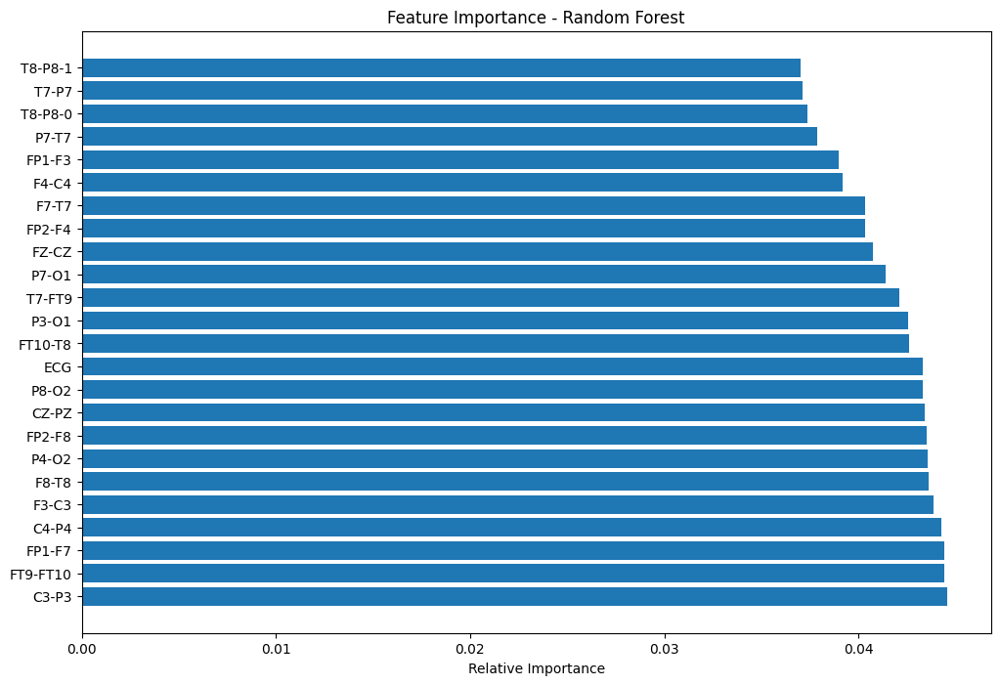

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split

# 10. Pisahkan fitur dan label untuk data training dan testing
X_train_fft = train_fft_df.drop(['seizure', 'frekuensi'], axis=1)
y_train_fft = train_fft_df['seizure']

X_test_fft = test_fft_df.drop(['seizure', 'frekuensi'], axis=1)
y_test_fft = test_fft_df['seizure']

# 11. Inisialisasi dan latih model Random Forest
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_fft, y_train_fft)

# 12. Prediksi hasil untuk data testing
y_pred = rf_classifier.predict(X_test_fft)

# 13. Evaluasi model
accuracy = accuracy_score(y_test_fft, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("\nClassification Report:")
print(classification_report(y_test_fft, y_pred))

# 14. Visualisasi feature importances
importances = rf_classifier.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title("Feature Importance - Random Forest")
plt.barh(range(X_train_fft.shape[1]), importances[indices], align="center")
plt.yticks(range(X_train_fft.shape[1]), X_train_fft.columns[indices])
plt.xlabel("Relative Importance")
plt.show()


Data hasil filtering disimpan dalam: /content/drive/MyDrive/TA/FILTERING_chb05_06.csv
Data hasil FFT disimpan dalam: /content/drive/MyDrive/TA/FFT_chb05_06.csv


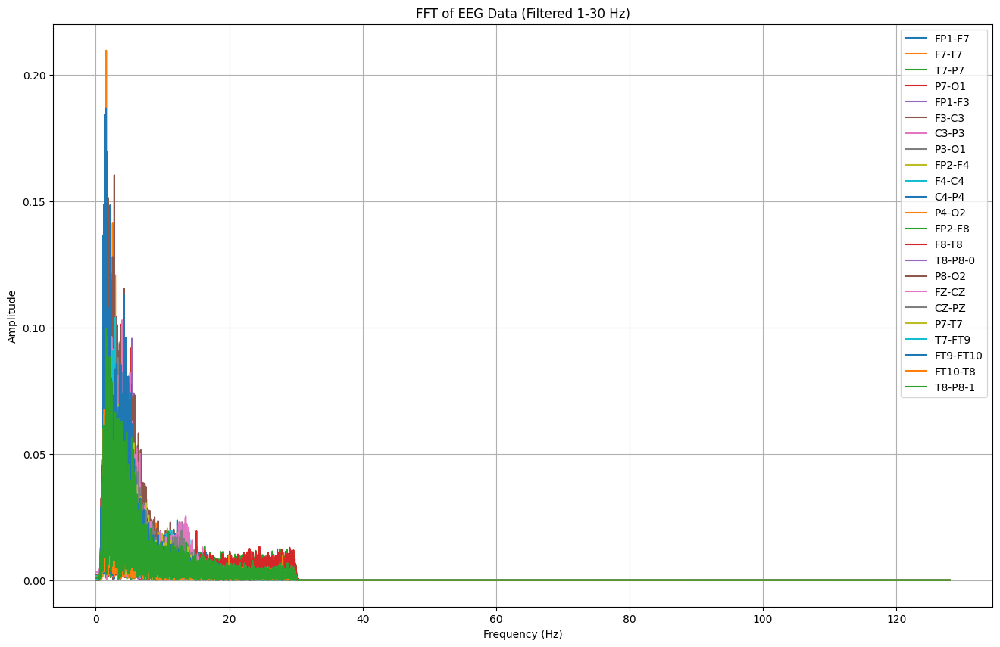

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter

# 1. Fungsi Band-Pass Filter (1-30 Hz) menggunakan FIR dengan Hamming Window
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# 2. Fungsi untuk menghitung FFT
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval waktu antar sampel
    fft_vals = np.fft.fft(signal)  # FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi FFT
    fft_vals = np.abs(fft_vals[:N // 2])  # Ambil hanya bagian positif
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# 3. Load data EEG
data_path = "/content/drive/MyDrive/TA/LABEL/chb05_06.csv"
df = pd.read_csv(data_path)

# 4. Definisi parameter filtering
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 846  # Jumlah koefisien filter

# 5. Terapkan filtering pada semua channel EEG
channels = df.columns[:-2]  # Semua kolom kecuali 'Time' dan 'seizure'
filtered_data = bandpass_filter_fir(df[channels].values, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# 6. Simpan hasil filtering dalam DataFrame
df_filtered = pd.DataFrame(filtered_data, columns=channels)
df_filtered['Time'] = df['Time'].values
df_filtered['seizure'] = df['seizure'].values

# Simpan hasil filtering ke dalam file CSV
filtered_output_path = "/content/drive/MyDrive/TA/FILTERING_chb05_06.csv"
df_filtered.to_csv(filtered_output_path, index=False)
print(f"Data hasil filtering disimpan dalam: {filtered_output_path}")

# 7. Terapkan FFT pada data yang telah difilter
fft_features = []
fft_freqs = None  # Menyimpan frekuensi hanya satu kali

for channel in channels:
    signal = df_filtered[channel].values
    fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
    fft_features.append(fft_vals)

# 8. Konversi hasil FFT ke DataFrame
df_fft = pd.DataFrame(fft_features).T
df_fft.columns = channels  # Set nama kolom sesuai dengan channel EEG
df_fft['frekuensi'] = fft_freqs  # Tambahkan kolom frekuensi
df_fft['seizure'] = df_filtered['seizure']  # Salin label kejang/tidak kejang

# 9. Simpan hasil FFT ke file CSV
fft_output_path = "/content/drive/MyDrive/TA/FFT_chb05_06.csv"
df_fft.to_csv(fft_output_path, index=False)
print(f"Data hasil FFT disimpan dalam: {fft_output_path}")

# 10. Visualisasi hasil FFT
plt.figure(figsize=(16, 10))
for channel in channels:
    plt.plot(df_fft['frekuensi'], df_fft[channel], label=channel)

plt.title('FFT of EEG Data (Filtered 1-30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb05_16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-4-9bf46a25e729>:13: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data23 = mne.io.read_raw_edf(data23)


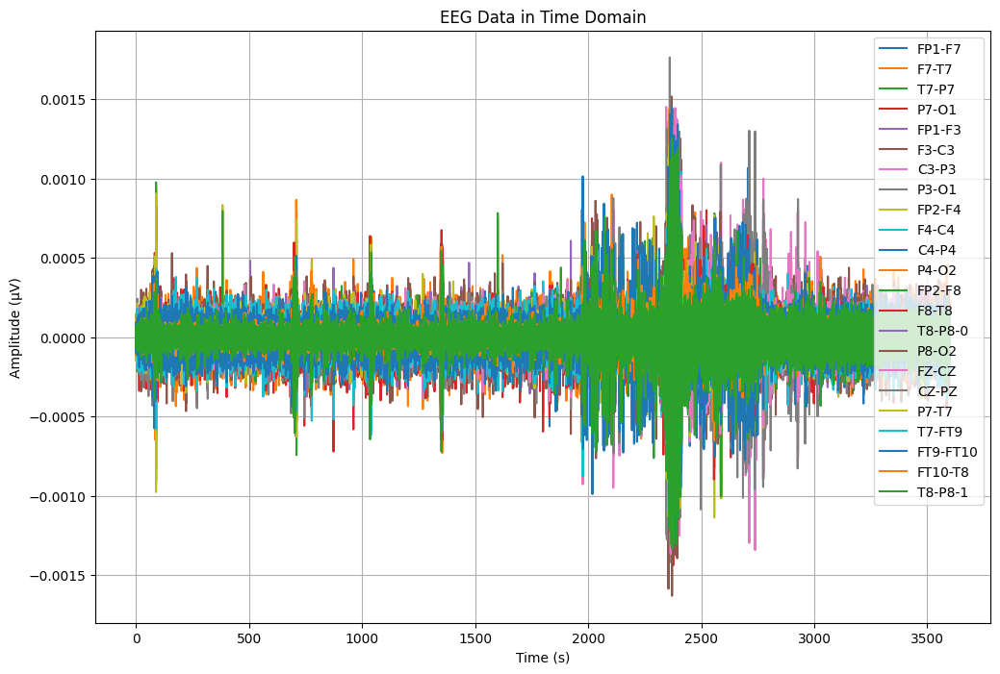

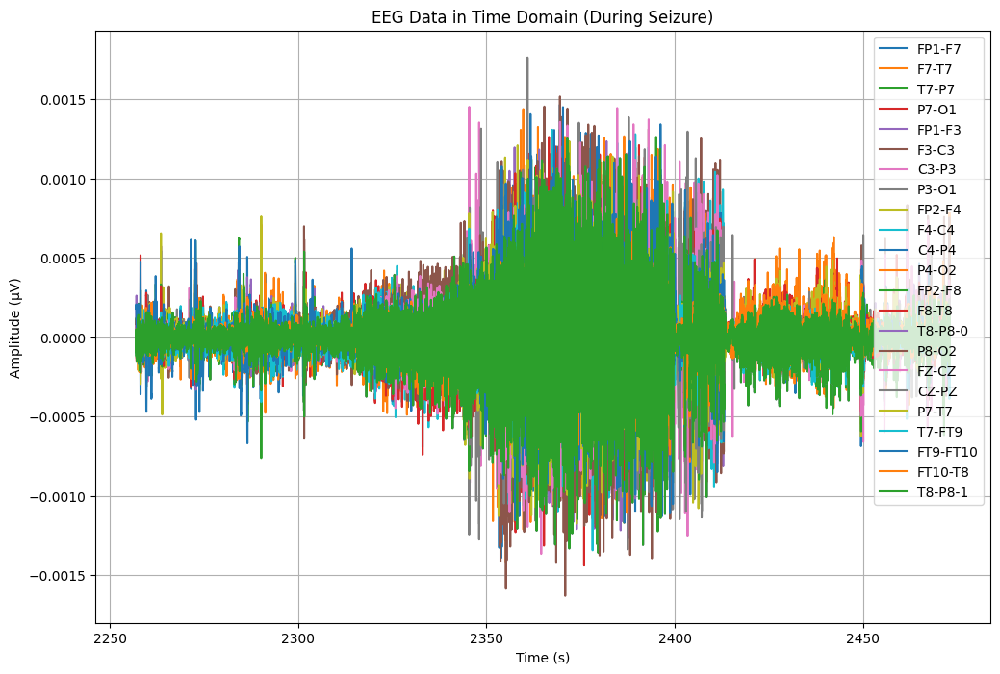

Data berhasil disimpan dalam file CSV:           FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
577792 -0.000046  0.000015  0.000067  0.000097  0.000089  1.953602e-07   
577793 -0.000042  0.000026  0.000061  0.000092  0.000097 -1.758242e-06   
577794 -0.000042  0.000023  0.000074  0.000079  0.000099 -9.768010e-07   
577795 -0.000044  0.000035  0.000101  0.000042  0.000097  5.274725e-06   
577796 -0.000042  0.000032  0.000088  0.000052  0.000098  8.791209e-06   
...          ...       ...       ...       ...       ...           ...   
633083 -0.000032  0.000097 -0.000059  0.000013 -0.000036 -2.158730e-04   
633084 -0.000037  0.000051 -0.000058  0.000036 -0.000042 -2.416606e-04   
633085 -0.000046  0.000023 -0.000077  0.000065 -0.000049 -2.654945e-04   
633086 -0.000038 -0.000006 -0.000116  0.000101 -0.000055 -2.858120e-04   
633087 -0.000044 -0.000014 -0.000148  0.000131 -0.000057 -2.990965e-04   

               C3-P3     P3-O1    FP2-F4     F4-C4  ...   T8-P8-0     P8

<ipython-input-4-9bf46a25e729>:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_23['seizure'] = df_23.apply(label_seizure, axis=1)


Data yang sudah diberi label berhasil disimpan dalam file CSV:           FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3         F3-C3  \
577792 -0.000046  0.000015  0.000067  0.000097  0.000089  1.953602e-07   
577793 -0.000042  0.000026  0.000061  0.000092  0.000097 -1.758242e-06   
577794 -0.000042  0.000023  0.000074  0.000079  0.000099 -9.768010e-07   
577795 -0.000044  0.000035  0.000101  0.000042  0.000097  5.274725e-06   
577796 -0.000042  0.000032  0.000088  0.000052  0.000098  8.791209e-06   
...          ...       ...       ...       ...       ...           ...   
633083 -0.000032  0.000097 -0.000059  0.000013 -0.000036 -2.158730e-04   
633084 -0.000037  0.000051 -0.000058  0.000036 -0.000042 -2.416606e-04   
633085 -0.000046  0.000023 -0.000077  0.000065 -0.000049 -2.654945e-04   
633086 -0.000038 -0.000006 -0.000116  0.000101 -0.000055 -2.858120e-04   
633087 -0.000044 -0.000014 -0.000148  0.000131 -0.000057 -2.990965e-04   

               C3-P3     P3-O1    FP2-F4     F4-

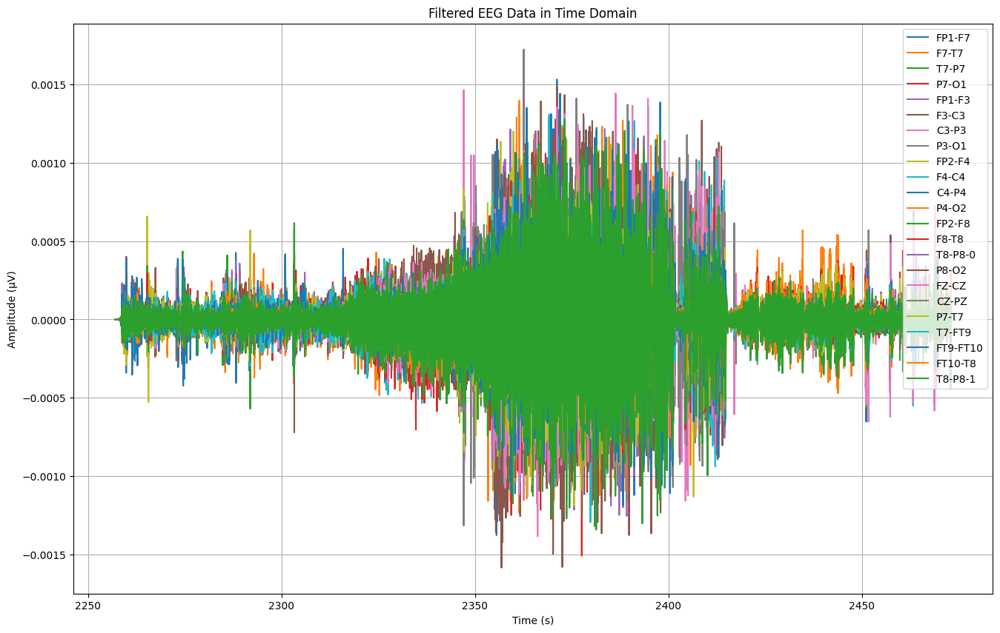

Data setelah filtering berhasil disimpan dalam file CSV:              FP1-F7         F7-T7         T7-P7         P7-O1        FP1-F3  \
0     -2.625744e-09  8.902736e-10  3.865365e-09  5.600835e-09  5.127525e-09   
1     -1.966378e-09  1.336388e-09  2.799526e-09  4.285982e-09  4.665337e-09   
2     -3.200860e-09  1.482638e-09  5.456207e-09  6.184243e-09  7.082134e-09   
3     -7.829215e-09  4.059631e-09  1.347518e-08  1.389702e-08  1.621035e-08   
4     -1.090230e-08  5.937772e-09  1.737096e-08  2.150490e-08  2.400592e-08   
...             ...           ...           ...           ...           ...   
55291 -2.067502e-05  2.476555e-06 -8.437331e-05  1.525555e-05 -8.937440e-05   
55292 -2.361051e-05 -7.236737e-07 -9.530637e-05  3.124223e-05 -8.491912e-05   
55293 -2.545204e-05 -2.200048e-09 -8.874960e-05  2.790859e-05 -7.851375e-05   
55294 -2.692858e-05  4.053133e-06 -7.194262e-05  1.103660e-05 -7.296531e-05   
55295 -2.917675e-05  9.101559e-06 -6.213255e-05 -6.052517e-07 -7.024357e-0

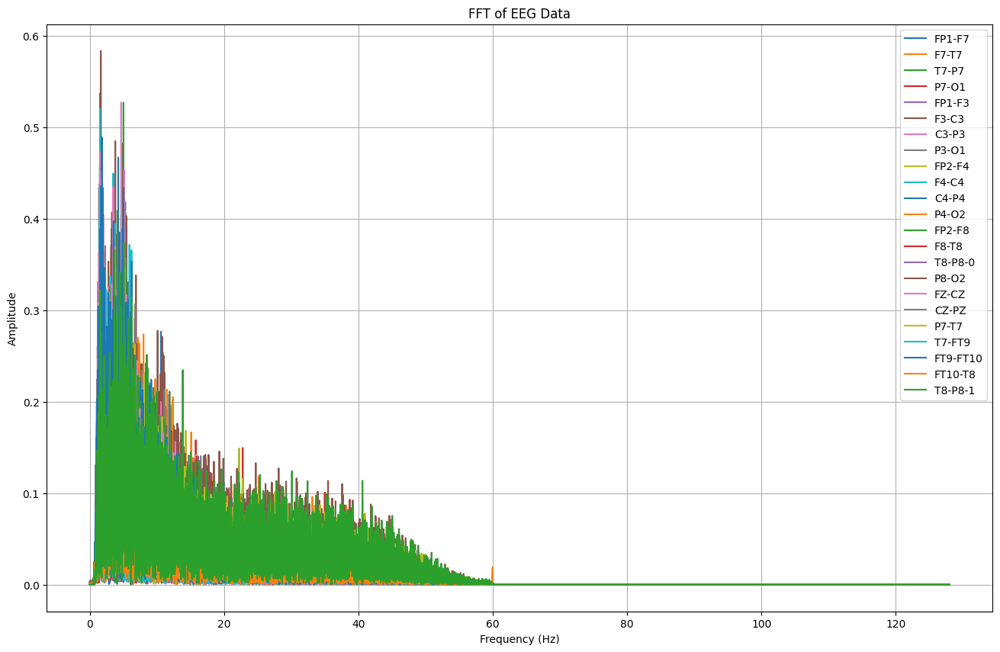

Data setelah FFT berhasil disimpan dalam file CSV:          FP1-F7     F7-T7     T7-P7     P7-O1    FP1-F3     F3-C3     C3-P3  \
0      0.000608  0.000534  0.000150  0.001460  0.000963  0.002729  0.000993   
1      0.000620  0.000520  0.000143  0.001449  0.000952  0.002740  0.001001   
2      0.000620  0.000517  0.000145  0.001445  0.000947  0.002732  0.001007   
3      0.000612  0.000512  0.000135  0.001450  0.000954  0.002753  0.001003   
4      0.000617  0.000514  0.000145  0.001453  0.000952  0.002738  0.001007   
...         ...       ...       ...       ...       ...       ...       ...   
27643  0.000015  0.000006  0.000031  0.000001  0.000035  0.000006  0.000051   
27644  0.000015  0.000006  0.000031  0.000001  0.000035  0.000006  0.000051   
27645  0.000015  0.000006  0.000031  0.000001  0.000035  0.000006  0.000051   
27646  0.000015  0.000006  0.000031  0.000001  0.000035  0.000006  0.000051   
27647  0.000015  0.000006  0.000031  0.000001  0.000035  0.000006  0.000051   



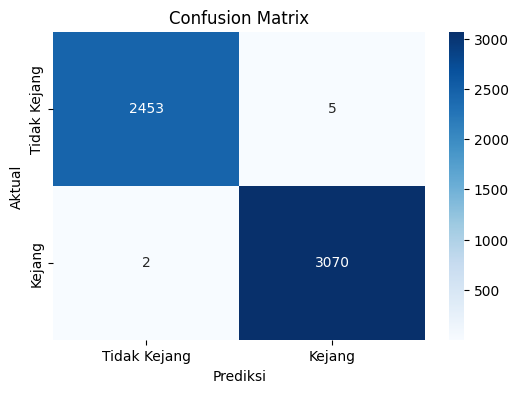

In [ ]:
import mne
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
import numpy as np  # Import numpy
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns # Import seaborn

#3. Load data EEG dari file EDF
data23 = "/content/drive/MyDrive/TA/EDF/chb05_16.edf"
data23 = mne.io.read_raw_edf(data23)
data23

data, times = data23.get_data(return_times=True)
channel_names = data23.ch_names

#4. Ekstrak data dan simpan ke DataFrame pandas
df23 = pd.DataFrame(data.T, columns=channel_names)
df23['Time'] = times

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df23['Time']

# # Step 5: Plot data EEG mentah
plt.figure(figsize=(12, 8))
for channel in channels:
    plt.plot(time, df23[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# potong data
sample_rate = 256

# Step 6: Tentukan rentang waktu analisis
start_time_seconds = 2257
end_time_seconds = 2473

# Step 7: Potong data berdasarkan waktu -> Simpan ke CSV
start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_23 = df23.iloc[start_index:end_index]

# Mengambil data waktu dari kolom 'Time'
time = df_23['Time']

# Membuat plot
plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in df_23.columns:
        plt.plot(time, df_23[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Menyimpan data yang sudah di potong
df_23.to_csv("/content/drive/MyDrive/TA/chb05_16.csv", index=False)

print(f"Data berhasil disimpan dalam file CSV: {df_23}")

# Step 8: Tambahkan label kejang/tidak kejang -> Simpan ke CSV
# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 2317:
        return "tidak kejang"
    elif 2317 <= row['Time'] < 2413:
        return "kejang"
    else:
        return "tidak kejang"

df_23['seizure'] = df_23.apply(label_seizure, axis=1)

# Simpan data yang sudah diberi label ke file CSV
df_23.to_csv("/content/drive/MyDrive/TA/chb05_16.csv", index=False)

print(f"Data yang sudah diberi label berhasil disimpan dalam file CSV: {df_23}")

import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import firwin, lfilter
import numpy as np

# Import data yang sudah dikasih label
df_23 = pd.read_csv("/content/drive/MyDrive/TA/chb05_16.csv")

# Step 9: Terapkan bandpass filter -> Simpan data hasil filter ke CSV
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 60
sampling_rate = 256
num_taps = 846

# Misalnya, df_23 adalah DataFrame yang sudah ada sebelumnya
eeg_columns = df_23.columns[:-2]  # Semua kolom kecuali 'Time' dan 'seizure'
eeg_data = df_23[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

TA23 = pd.DataFrame(filtered_data, columns=eeg_columns)
TA23['Time'] = df_23['Time'].values
TA23['seizure'] = df_23['seizure']

# Visualisasi data setelah filtering
plt.figure(figsize=(16, 10))

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Looping untuk menampilkan data dari kanal yang dipilih
for channel in channels:
    if channel in TA23.columns:
        plt.plot(TA23['Time'], TA23[channel], label=channel)

# Menambahkan judul dan label
plt.title('Filtered EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah filtering ke file CSV
TA23.to_csv("/content/drive/MyDrive/TA/chb05_16.csv", index=False)

print(f"Data setelah filtering berhasil disimpan dalam file CSV: {TA23}")

# Step 10: Hitung FFT data EEG -> Simpan hasil ke CSV
# FFT dan ekstraksi fitur
def compute_fft(signal, sampling_rate):
    N = len(signal)
    T = 1.0 / sampling_rate
    fft_vals = np.fft.fft(signal)
    fft_freqs = np.fft.fftfreq(N, T)
    fft_vals = np.abs(fft_vals[:N // 2])
    fft_freqs = fft_freqs[:N // 2]
    return fft_freqs, fft_vals

# Ekstraksi fitur FFT
fft_features = []
for channel in channels:
    if channel in TA23.columns:
        signal = TA23[channel].values
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)
        fft_features.append(fft_vals)

# Mengubah fitur FFT menjadi DataFrame
TA_23 = pd.DataFrame(fft_features).T
TA_23.columns = channels
TA_23['frekuensi'] = fft_freqs
TA_23['seizure'] = TA23['seizure']

# Visualisasi data setelah FFT
plt.figure(figsize=(16, 10))

# Looping untuk menampilkan spektrum frekuensi dari kanal yang dipilih
for channel in channels:
    if channel in TA_23.columns:  # Memastikan kanal ada dalam data
        fft_freqs, fft_vals = compute_fft(TA23[channel].values, sampling_rate)
        plt.plot(fft_freqs, fft_vals, label=channel)

# Menambahkan judul dan label
plt.title('FFT of EEG Data')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Simpan data setelah FFT ke file CSV
TA_23.to_csv("/content/drive/MyDrive/TA/chb05_16.csv", index=False)

print(f"Data setelah FFT berhasil disimpan dalam file CSV: {TA_23}")

# random forest
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns

# Load the data from the CSV file into a pandas DataFrame
TA_23 = pd.read_csv("/content/drive/MyDrive/TA/chb05_16.csv")

# Step 11: Siapkan data untuk klasifikasi
X = TA_23.drop(['frekuensi', 'seizure'], axis=1)
y = TA_23['seizure']

# Step 12: Bagi data menjadi latih dan uji secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Step 13: Latih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# Step 14: Evaluasi model -> Cetak akurasi dan laporan
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))

# Step 15: Matriks Evaluasi
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()

Akurasi pada data latih: 1.0
Akurasi pada data uji: 0.9987341772151899
Laporan Klasifikasi (Data Uji):
               precision    recall  f1-score   support

      kejang       1.00      1.00      1.00      2458
tidak kejang       1.00      1.00      1.00      3072

    accuracy                           1.00      5530
   macro avg       1.00      1.00      1.00      5530
weighted avg       1.00      1.00      1.00      5530



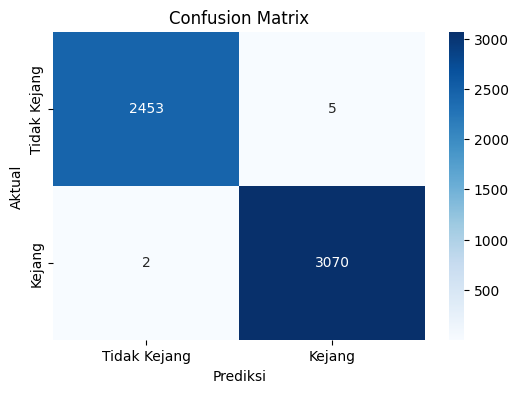

Cross-validation scores: [0.99927667 0.99855335 0.99855335 0.99819168 0.99927667 0.99783002
 0.99891501 0.99927667 0.99927641 0.99855282]
Mean CV Accuracy: 0.9987702650717176
Standard Deviation: 0.000490580617350366


In [ ]:
# ini random forest
# Import library yang diperlukan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the data from the CSV file into a pandas DataFrame
TA_27 = pd.read_csv("/content/drive/MyDrive/TA/chb05_16.csv")

# Step 11: Siapkan data untuk klasifikasi
X = TA_27.drop(['frekuensi', 'seizure'], axis=1)
y = TA_27['seizure']

# Step 12: Bagi data menjadi latih dan uji secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Step 13: Latih model Random Forest dengan max_features='sqrt'
model = RandomForestClassifier(n_estimators=50, max_depth=10, max_features='sqrt', random_state=42)
model.fit(X_train, y_train)

# Prediksi pada data latih
y_train_pred = model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)

# Prediksi pada data uji
y_pred = model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred)

# Step 14: Evaluasi model -> Cetak akurasi dan laporan
print("Akurasi pada data latih:", train_accuracy)  # Akurasi pada data latih
print("Akurasi pada data uji:", test_accuracy)  # Akurasi pada data uji
print("Laporan Klasifikasi (Data Uji):\n", classification_report(y_test, y_pred))

# Step 15: Matriks Evaluasi
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()

# Step 16: K-Fold Cross Validation (Stratified K-Fold)
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(model, X, y, cv=kf, scoring='accuracy')

# Cetak hasil cross-validation
print("Cross-validation scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))
print("Standard Deviation:", np.std(cv_scores))




Akurasi pada data latih: 1.0
Akurasi pada data uji: 0.9998352010547132
Laporan Klasifikasi (Data Uji):
               precision    recall  f1-score   support

      kejang       1.00      1.00      1.00      2996
tidak kejang       1.00      1.00      1.00      3072

    accuracy                           1.00      6068
   macro avg       1.00      1.00      1.00      6068
weighted avg       1.00      1.00      1.00      6068



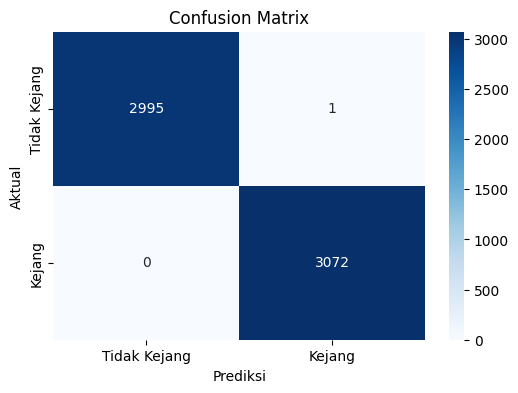

Cross-validation scores: [1.         1.         0.9996704  1.         1.         1.
 1.         0.99967029 1.         1.        ]
Mean CV Accuracy: 0.9999340695548267
Standard Deviation: 0.0001318608925857931


In [ ]:
# ini random forest
# Import library yang diperlukan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the data from the CSV file into a pandas DataFrame
TA_27 = pd.read_csv("/content/drive/MyDrive/TA/FFT/chb05_22.csv")

# Step 11: Siapkan data untuk klasifikasi
X = TA_27.drop(['Time', 'seizure'], axis=1)
y = TA_27['seizure']

# Step 12: Bagi data menjadi latih dan uji secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Step 13: Latih model Random Forest dengan max_features='sqrt'
model = RandomForestClassifier(n_estimators=50, max_depth=10, max_features='sqrt', random_state=42)
model.fit(X_train, y_train)

# Prediksi pada data latih
y_train_pred = model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)

# Prediksi pada data uji
y_pred = model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred)

# Step 14: Evaluasi model -> Cetak akurasi dan laporan
print("Akurasi pada data latih:", train_accuracy)  # Akurasi pada data latih
print("Akurasi pada data uji:", test_accuracy)  # Akurasi pada data uji
print("Laporan Klasifikasi (Data Uji):\n", classification_report(y_test, y_pred))

# Step 15: Matriks Evaluasi
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()

# Step 16: K-Fold Cross Validation (Stratified K-Fold)
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_scores = cross_val_score(model, X, y, cv=kf, scoring='accuracy')

# Cetak hasil cross-validation
print("Cross-validation scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))
print("Standard Deviation:", np.std(cv_scores))




# 1. chb01_03

In [ ]:
file1 = "/content/drive/MyDrive/TA/EDF/chb01_03 (1).edf"
data1 = mne.io.read_raw_edf(file1) # membaca file edf dan menyimpannya di data1
data1

Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_03 (1).edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-4-bd870514c721>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data1 = mne.io.read_raw_edf(file1) # membaca file edf dan menyimpannya di data1


<RawEDF | chb01_03 (1).edf, 23 x 921600 (3600.0 s), ~23 KiB, data not loaded>

In [ ]:
# Mendapatkan data dan informasi dari file EDF
data, times = data1.get_data(return_times=True)  # Mengambil data EEG dan waktu
channel_names = data1.ch_names  # Mendapatkan nama channel

# Membuat DataFrame dengan data EEG dan waktu
df1 = pd.DataFrame(data.T, columns=channel_names)  # Transpose data sehingga sesuai dengan format DataFrame
df1['Time'] = times  # Menambahkan kolom waktu
df1.head()

,FP1-F7,F7-T7,T7-P7,P7-O1,FP1-F3,F3-C3,C3-P3,P3-O1,FP2-F4,F4-C4,...,T8-P8-0,P8-O2,FZ-CZ,CZ-PZ,P7-T7,T7-FT9,FT9-FT10,FT10-T8,T8-P8-1,Time
0,-1.777778e-05,3.926740e-05,-3.711844e-06,8.400488e-06,-5.860806e-07,4.102564e-06,3.770452e-05,-1.504274e-05,-1.738706e-05,-4.512821e-05,...,-5.997558e-05,1.803175e-04,-1.855922e-05,8.537241e-05,4.102564e-06,2.090354e-05,-9.181929e-06,-3.965812e-05,-5.997558e-05,0.000000
1,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,...,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,0.003906
2,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,...,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,0.007812
3,5.860806e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,5.860806e-07,-1.953602e-07,1.953602e-07,5.860806e-07,...,1.953602e-07,2.148962e-06,5.860806e-07,5.860806e-07,1.953602e-07,1.367521e-06,-1.953602e-07,-1.953602e-07,1.953602e-07,0.011719
4,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,...,1.953602e-07,2.148962e-06,1.953602e-07,1.953602e-07,1.953602e-07,-1.953602e-07,1.953602e-07,1.953602e-07,1.953602e-07,0.015625


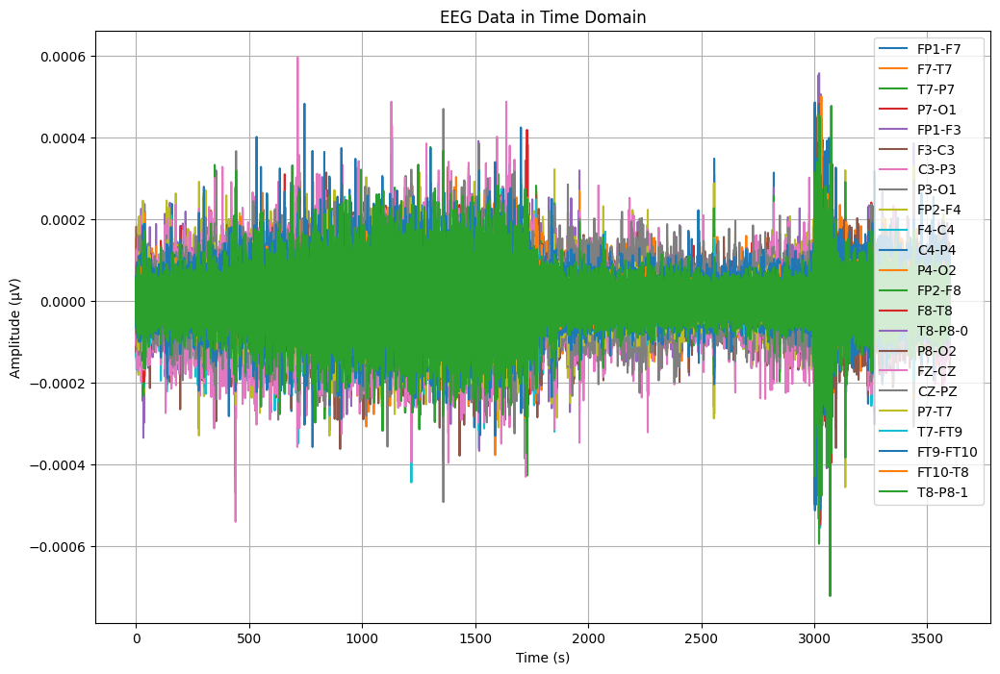

In [ ]:
# Time Domain
# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']  # Anda bisa memilih saluran lainnya
time = df1['Time']  # Kolom waktu

# Membuat plot
plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran
for channel in channels:
    plt.plot(time, df1[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()

In [ ]:
# Menentukan sample rate (misalkan 256 Hz)
sample_rate = 256  # Sesuaikan dengan sample rate data kamu

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 2876   # Waktu mulai (15:05:00) dalam detik dari 14:43:12
end_time_seconds = 3156    # Waktu akhir (15:10:00) dalam detik dari 14:43:12

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

# Potong data berdasarkan rentang waktu
df_cut = df1.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_03.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_03.csv


In [ ]:
# import data yang sudah dipotong
TA1 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_03.csv")
TA1.head()

,FP1-F7,F7-T7,T7-P7,P7-O1,FP1-F3,F3-C3,C3-P3,P3-O1,FP2-F4,F4-C4,...,T8-P8-0,P8-O2,FZ-CZ,CZ-PZ,P7-T7,T7-FT9,FT9-FT10,FT10-T8,T8-P8-1,Time
0,-0.000020,-0.000017,-0.000021,-0.000022,-5.665446e-06,-0.000042,-0.000024,-0.000009,0.000032,-0.000037,...,-0.000046,-0.000028,-0.000044,-0.000074,0.000021,2.207570e-05,0.000028,-0.000012,-0.000046,2876.000000
1,-0.000018,-0.000012,-0.000019,-0.000023,-5.860806e-07,-0.000036,-0.000023,-0.000013,0.000030,-0.000037,...,-0.000039,-0.000021,-0.000038,-0.000069,0.000019,1.543346e-05,0.000024,-0.000009,-0.000039,2876.003906
2,-0.000017,-0.000007,-0.000014,-0.000025,3.711844e-06,-0.000030,-0.000020,-0.000018,0.000026,-0.000038,...,-0.000031,-0.000019,-0.000036,-0.000057,0.000014,1.308913e-05,0.000017,-0.000010,-0.000031,2876.007812
3,-0.000018,-0.000002,-0.000010,-0.000025,6.446886e-06,-0.000027,-0.000018,-0.000016,0.000018,-0.000043,...,-0.000019,-0.000018,-0.000037,-0.000044,0.000010,6.446886e-06,0.000010,-0.000009,-0.000019,2876.011719
4,-0.000017,0.000002,-0.000007,-0.000024,6.056166e-06,-0.000023,-0.000013,-0.000016,0.000010,-0.000045,...,-0.000006,-0.000003,-0.000037,-0.000027,0.000008,5.860806e-07,0.000003,-0.000008,-0.000006,2876.015625


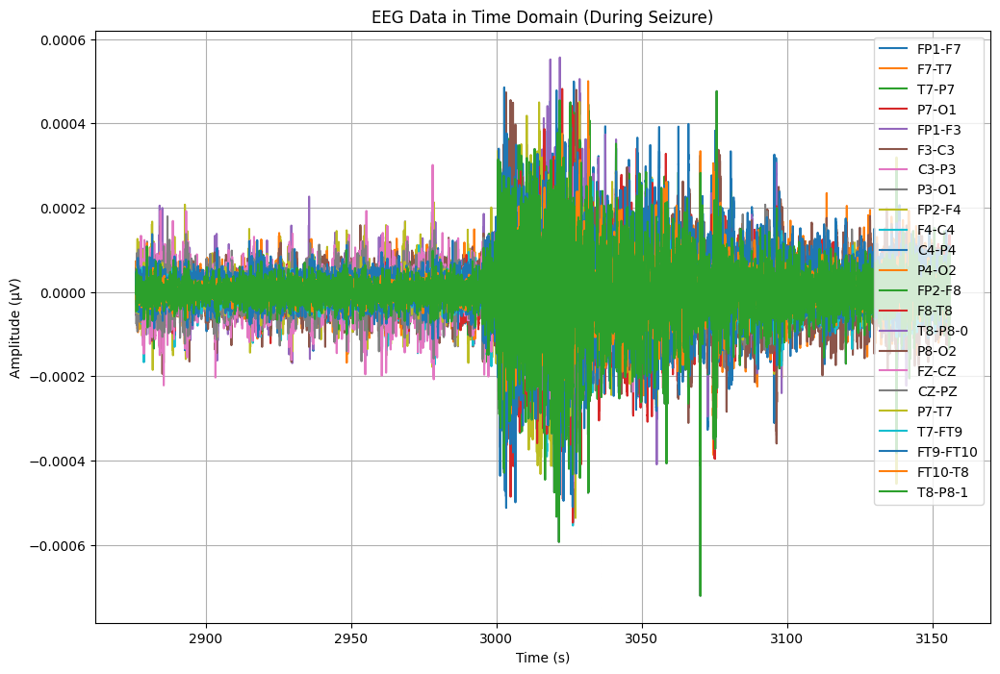

In [ ]:
# menampilkan data yang sudah dipotong dalam domain time
# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Mengambil data waktu dari kolom 'Time'
time = TA1['Time']

# Membuat plot
plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA1.columns:  # Memastikan saluran ada dalam data
        plt.plot(time, TA1[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()


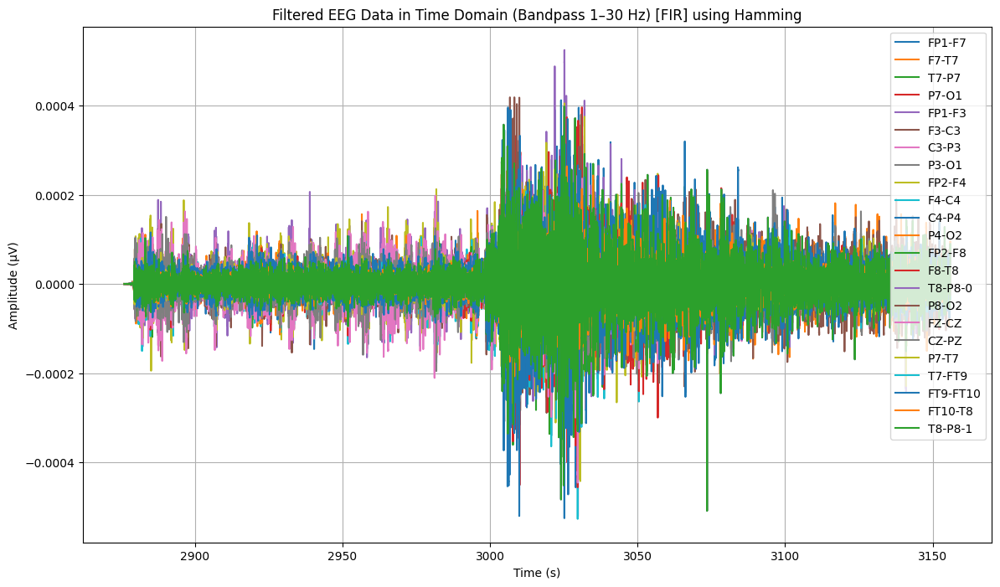

In [ ]:
from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)  # Terapkan filter pada data
    return filtered_data

# Parameter untuk filter
lowcut_freq = 1  # Frekuensi cutoff bawah dalam Hz (diloloskan mulai 1 Hz)
highcut_freq = 30  # Frekuensi cutoff atas dalam Hz (diloloskan sampai 30 Hz)
sampling_rate = 256  # Frekuensi sampling (dalam data EEG Anda)
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

# Mengambil data waktu dan sinyal EEG dari data yang sudah dipotong (TA1)
time = TA1['Time'].values  # Kolom waktu
eeg_columns = TA1.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA1[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Membuat DataFrame dari data yang telah difilter
filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time  # Menambahkan kolom waktu ke data yang telah difilter

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)  # Menampilkan data yang sudah difilter

# Memberikan judul dan label pada plot
plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')  # Menampilkan legenda untuk setiap saluran
plt.grid(True)
plt.show()


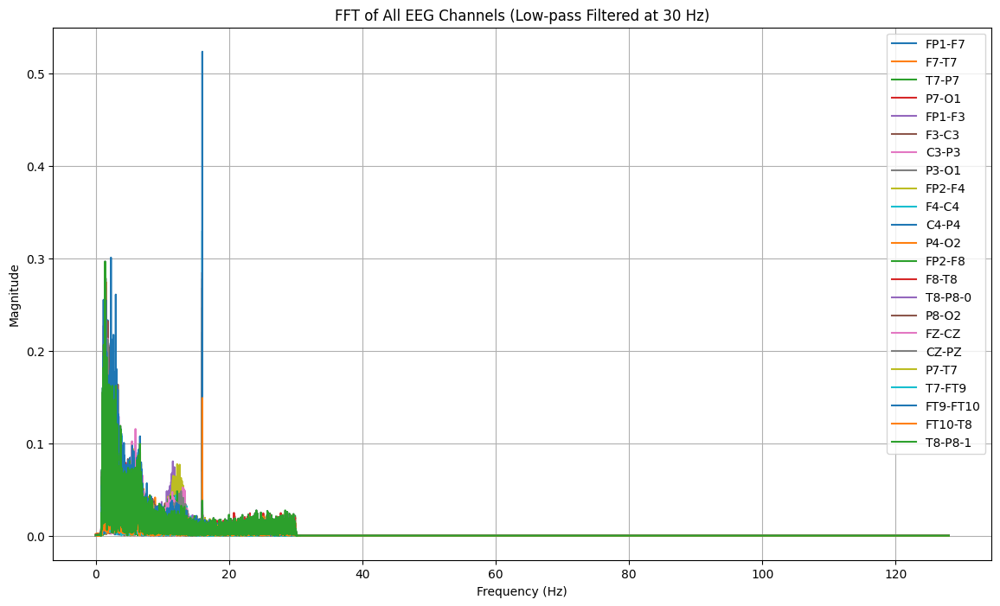

In [ ]:
# Fungsi untuk melakukan FFT dan mengembalikan frekuensi serta magnitude
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

# Sampling rate
sampling_rate = 256  # Misal 256 Hz

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

# Memberikan judul dan label pada plot
plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')  # Menampilkan legenda untuk setiap saluran
plt.grid(True)
plt.show()


In [ ]:
# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 2876:
        return "tidak kejang"
    elif 2876 <= row['Time'] < 3156:
        return "kejang"
    else:
        return "tidak kejang"

# Menyalin data1 ke df1 dan menambahkan kolom 'seizure' berdasarkan fungsi di atas
TA_1 = filtered_df.copy()
TA_1['seizure'] = filtered_df.apply(label_seizure, axis=1)

# Menampilkan hasil
print(TA_1[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

          Time seizure        FP1-F7         F7-T7         T7-P7  \
0  2876.000000  kejang  7.238053e-10  6.234759e-10  7.668036e-10   
1  2876.003906  kejang  9.992766e-10  7.381539e-10  1.033380e-09   
2  2876.007812  kejang  8.857156e-10  4.470170e-10  7.902019e-10   
3  2876.011719  kejang  7.343207e-10  2.100491e-11  3.908199e-10   
4  2876.015625  kejang  7.315565e-10 -1.604552e-10  2.416220e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  7.954692e-10  2.078253e-10  1.526441e-09  8.671331e-10  3.368203e-10  ...   
1  1.204221e-09  1.170563e-10  2.013300e-09  1.251504e-09  6.350165e-10  ...   
2  1.277161e-09 -1.348525e-10  1.636464e-09  1.080135e-09  8.733445e-10  ...   
3  1.113325e-09 -3.489108e-10  1.072467e-09  7.599432e-10  8.021434e-10  ...   
4  1.039370e-09 -3.331321e-10  9.153794e-10  5.442950e-10  7.088998e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0  7.668036e-10  1.669769e-09  1.01

In [ ]:
# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_1.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_03.csv", index=False)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Menentukan fitur (X) dan label (y)
X = TA_1.drop(['Time', 'seizure'], axis=1)  # Menghapus kolom 'Time' dan 'seizure' dari fitur
y = TA_1['seizure']  # Label target

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Membuat dan melatih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Memprediksi label pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Akurasi: 1.0
Laporan Klasifikasi:
               precision    recall  f1-score   support

      kejang       1.00      1.00      1.00     14336

    accuracy                           1.00     14336
   macro avg       1.00      1.00      1.00     14336
weighted avg       1.00      1.00      1.00     14336



Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-28-56e23845a556>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data2 = mne.io.read_raw_edf(file2)  # membaca file edf dan menyimpannya di data2


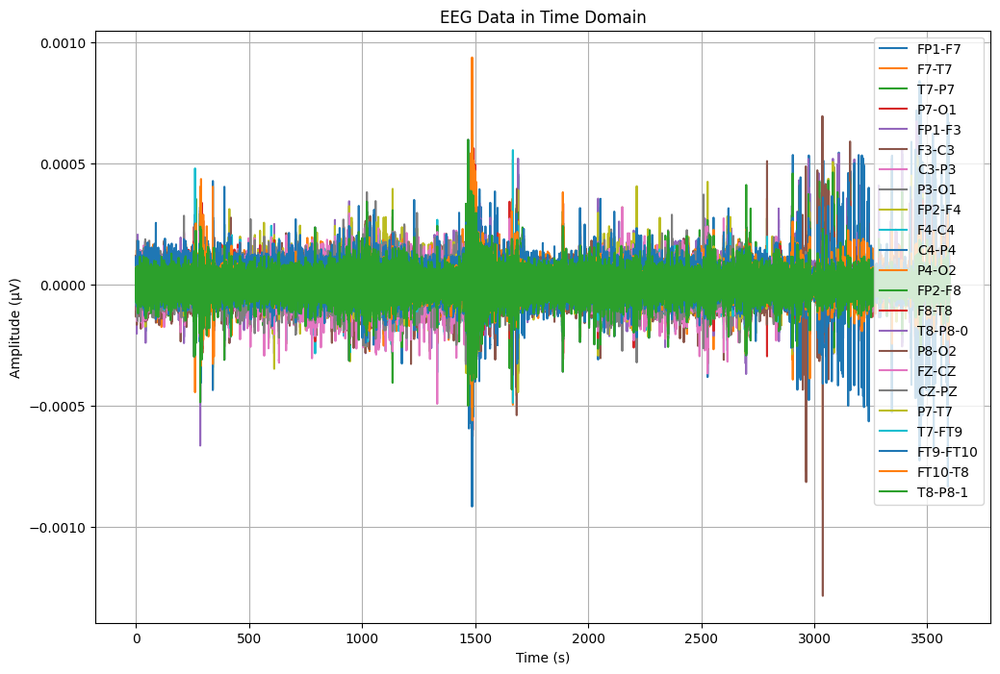

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_04.csv


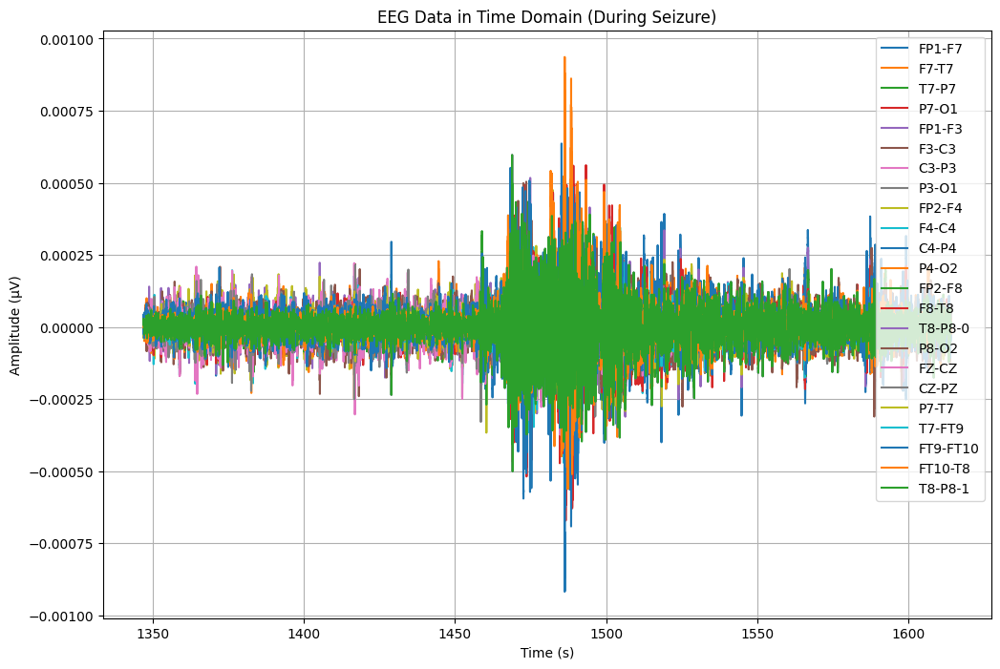

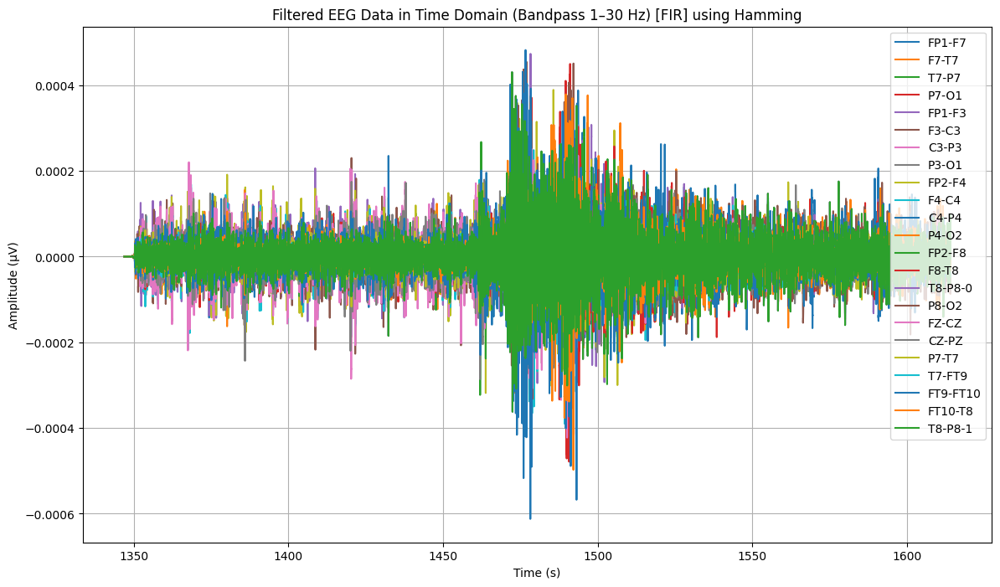

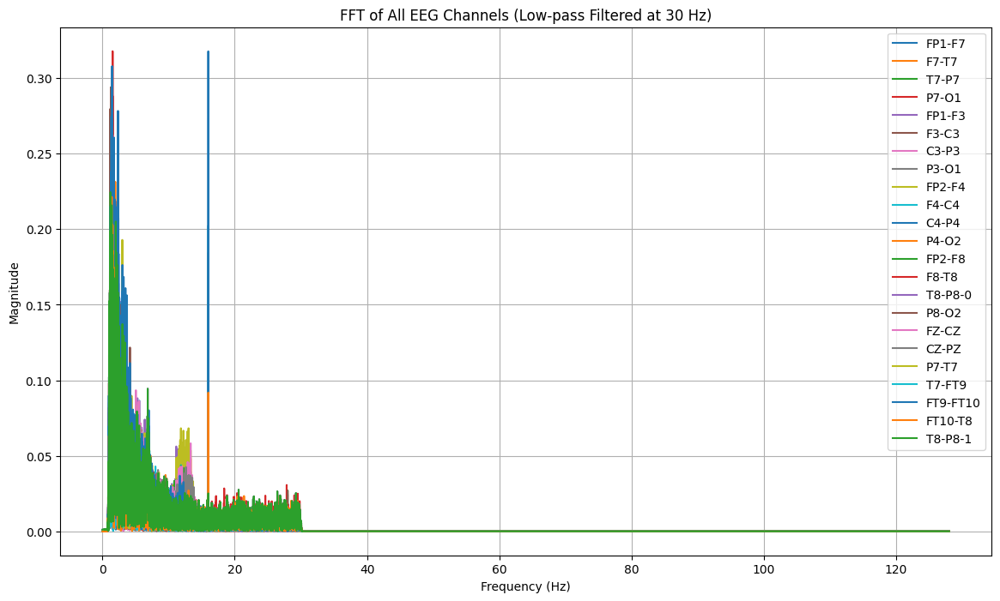

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1347.000000  tidak kejang  2.221581e-10  2.149917e-11  4.371497e-10   
1  1347.003906  tidak kejang  3.386381e-10  1.030483e-10  4.518231e-10   
2  1347.007812  tidak kejang  3.790588e-10 -2.254875e-11  3.194458e-10   
3  1347.011719  tidak kejang  2.742733e-10 -3.610491e-10  3.830339e-10   
4  1347.015625  tidak kejang  1.819526e-11 -3.899963e-10  3.722910e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -1.934925e-10  3.941514e-10 -4.944808e-10  4.944808e-10  1.361614e-10  ...   
1 -3.111250e-10  6.183788e-10 -7.505065e-10  5.355148e-10  1.987678e-10  ...   
2 -3.306533e-10  6.648821e-10 -8.866088e-10  3.147749e-10  2.218144e-10  ...   
3 -3.478395e-10  5.184229e-10 -8.779147e-10  1.533319e-10  1.312756e-10  ...   
4 -4.215897e-10  2.389511e-10 -8.640407e-10  2.328686e-11  1.383095e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file2 = "/content/drive/MyDrive/TA/EDF/chb01_04.edf"
data2 = mne.io.read_raw_edf(file2)  # membaca file edf dan menyimpannya di data2
data2

# Mendapatkan data dan informasi dari file EDF
data, times = data2.get_data(return_times=True)  # Mengambil data EEG dan waktu
channel_names = data2.ch_names  # Mendapatkan nama channel

# Membuat DataFrame dengan data EEG dan waktu
df2 = pd.DataFrame(data.T, columns=channel_names)  # Transpose data sehingga sesuai dengan format DataFrame
df2['Time'] = times  # Menambahkan kolom waktu
df2.head()

# Time Domain
# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']  # Anda bisa memilih saluran lainnya
time = df2['Time']  # Kolom waktu

# Membuat plot
plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran
for channel in channels:
    plt.plot(time, df2[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (\u00b5V)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()

# Menentukan sample rate (misalkan 256 Hz)
sample_rate = 256  # Sesuaikan dengan sample rate data kamu

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1347   # Waktu mulai (15:05:00) dalam detik dari 14:43:12
end_time_seconds = 1614    # Waktu akhir (15:10:00) dalam detik dari 14:43:12

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

# Potong data berdasarkan rentang waktu
df_cut = df2.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_04.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA2 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_04.csv")
TA2.head()

# menampilkan data yang sudah dipotong dalam domain time
# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Mengambil data waktu dari kolom 'Time'
time = TA2['Time']

# Membuat plot
plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA2.columns:  # Memastikan saluran ada dalam data
        plt.plot(time, TA2[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (\u00b5V)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)  # Terapkan filter pada data
    return filtered_data

# Parameter untuk filter
lowcut_freq = 1  # Frekuensi cutoff bawah dalam Hz (diloloskan mulai 1 Hz)
highcut_freq = 30  # Frekuensi cutoff atas dalam Hz (diloloskan sampai 30 Hz)
sampling_rate = 256  # Frekuensi sampling (dalam data EEG Anda)
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

# Mengambil data waktu dan sinyal EEG dari data yang sudah dipotong (TA2)
time = TA2['Time'].values  # Kolom waktu
eeg_columns = TA2.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA2[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Membuat DataFrame dari data yang telah difilter
filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time  # Menambahkan kolom waktu ke data yang telah difilter

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)  # Menampilkan data yang sudah difilter

# Memberikan judul dan label pada plot
plt.title('Filtered EEG Data in Time Domain (Bandpass 1\u201330 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (\u00b5V)')
plt.legend(loc='upper right')  # Menampilkan legenda untuk setiap saluran
plt.grid(True)
plt.show()

# Fungsi untuk melakukan FFT dan mengembalikan frekuensi serta magnitude
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

# Sampling rate
sampling_rate = 256  # Misal 256 Hz

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

# Memberikan judul dan label pada plot
plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')  # Menampilkan legenda untuk setiap saluran
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1467:
        return "tidak kejang"
    elif 1467 <= row['Time'] < 1494:
        return "kejang"
    else:
        return "tidak kejang"

# Menyalin data2 ke df2 dan menambahkan kolom 'seizure' berdasarkan fungsi di atas
TA_2 = filtered_df.copy()
TA_2['seizure'] = filtered_df.apply(label_seizure, axis=1)

# Menampilkan hasil
print(TA_2[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_2.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_04.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Menentukan fitur (X) dan label (y)
X = TA_2.drop(['Time', 'seizure'], axis=1)  # Menghapus kolom 'Time' dan 'seizure' dari fitur
y = TA_2['seizure']  # Label target

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Membuat dan melatih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Memprediksi label pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_15.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-29-4fa396dd8835>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data3 = mne.io.read_raw_edf(file1) # membaca file edf dan menyimpannya di data3


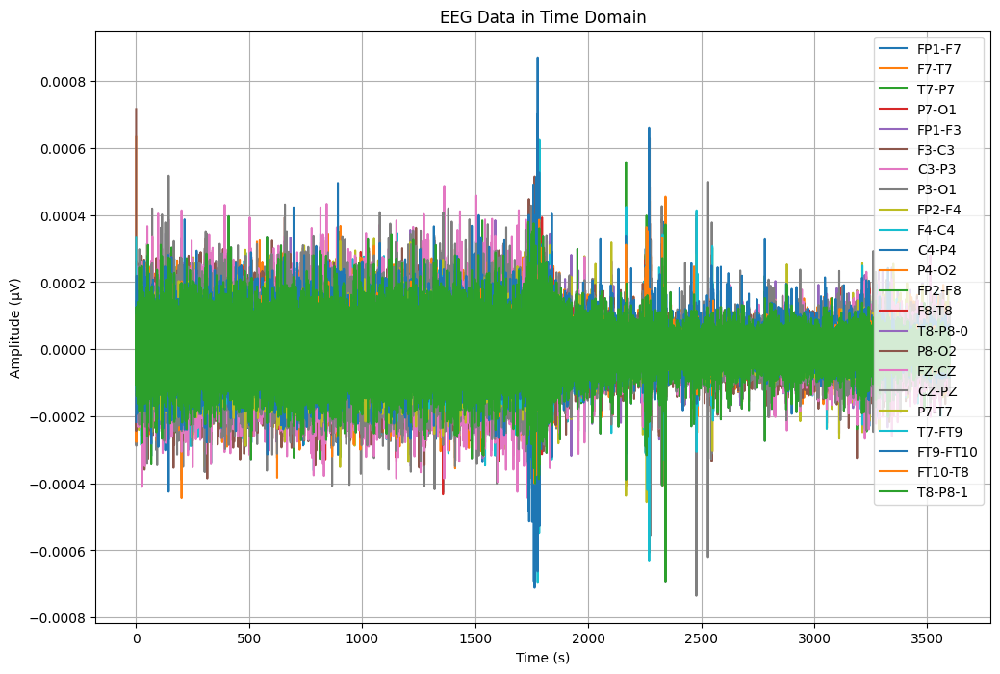

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_15.csv


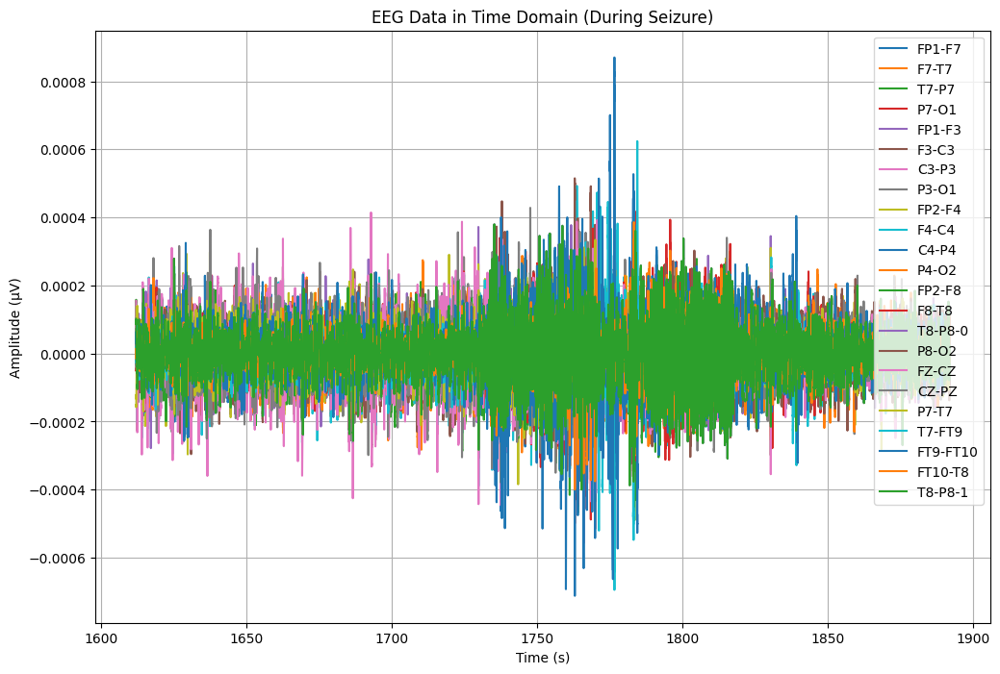

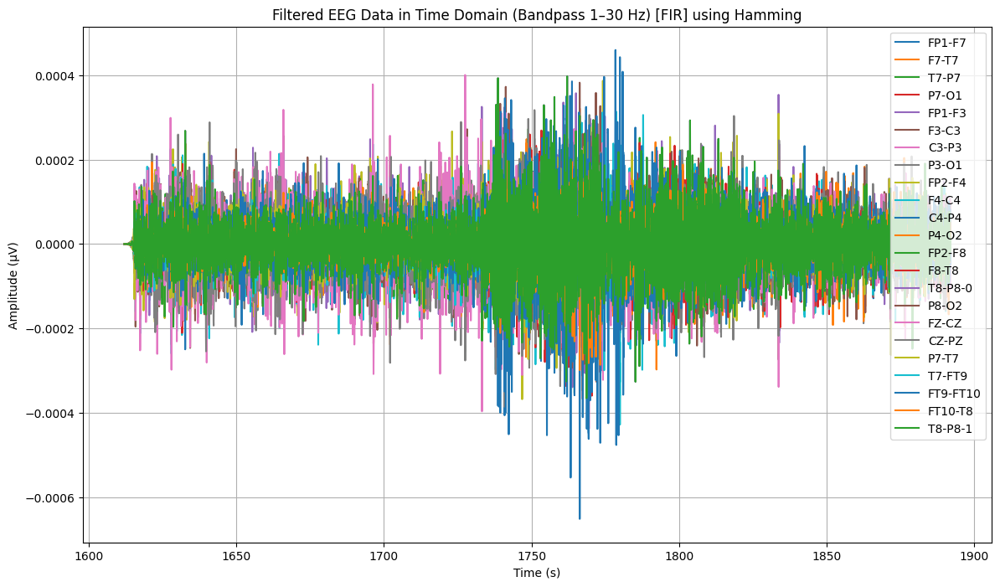

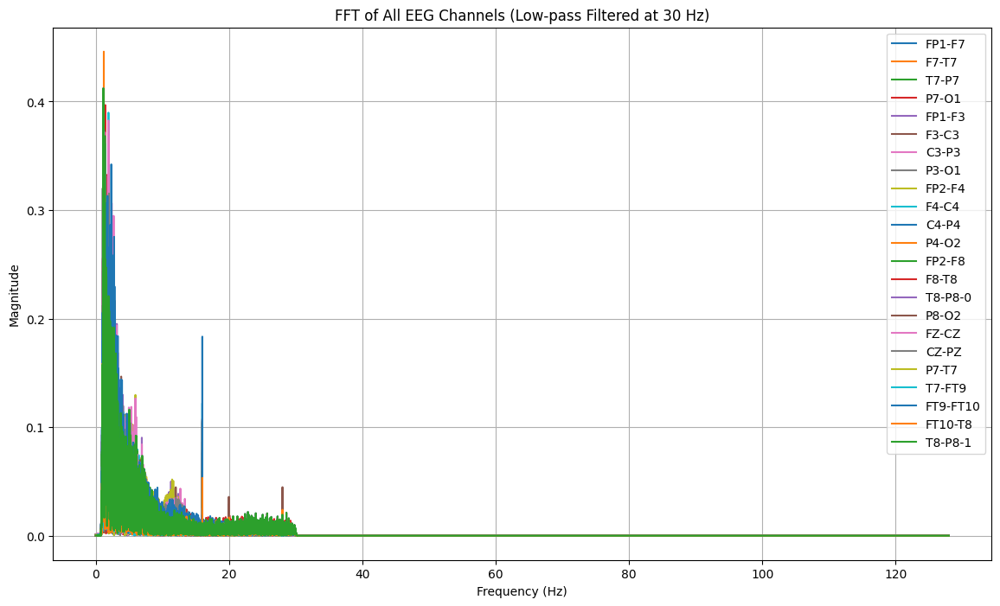

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1612.000000  tidak kejang -3.748021e-09 -2.630065e-09 -5.568284e-09   
1  1612.003906  tidak kejang -5.399681e-09 -3.997017e-09 -7.899232e-09   
2  1612.007812  tidak kejang -5.169062e-09 -3.975307e-09 -7.449341e-09   
3  1612.011719  tidak kejang -4.183892e-09 -3.098230e-09 -6.224190e-09   
4  1612.015625  tidak kejang -3.811614e-09 -2.548217e-09 -6.568341e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -1.368780e-09 -7.668036e-10 -5.596950e-09 -4.307000e-09 -2.687396e-09  ...   
1 -1.811813e-09 -1.320035e-09 -7.812083e-09 -6.101013e-09 -3.937381e-09  ...   
2 -1.669656e-09 -1.581313e-09 -7.029375e-09 -5.722942e-09 -3.976398e-09  ...   
3 -1.398104e-09 -1.699764e-09 -5.190271e-09 -4.477628e-09 -3.566701e-09  ...   
4 -1.357339e-09 -1.876115e-09 -4.649272e-09 -4.081655e-09 -3.694100e-09  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file1 = "/content/drive/MyDrive/TA/EDF/chb01_15.edf"
data3 = mne.io.read_raw_edf(file1) # membaca file edf dan menyimpannya di data3
data3

# Mendapatkan data dan informasi dari file EDF
data, times = data3.get_data(return_times=True)
channel_names = data3.ch_names

# Membuat DataFrame dengan data EEG dan waktu
df3 = pd.DataFrame(data.T, columns=channel_names)
df3['Time'] = times
df3.head()


# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df3['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran
for channel in channels:
    plt.plot(time, df3[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Menentukan sample rate (misalkan 256 Hz)
sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1612
end_time_seconds = 1892

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

# Potong data berdasarkan rentang waktu
df_cut = df3.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_15.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA3 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_15.csv")
TA3.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Mengambil data waktu dari kolom 'Time'
time = TA3['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA3.columns:
        plt.plot(time, TA3[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Parameter untuk filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

# Mengambil data waktu dan sinyal EEG dari data yang sudah dipotong (TA3)
time = TA3['Time'].values
eeg_columns = TA3.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA3[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Membuat DataFrame dari data yang telah difilter
filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Fungsi untuk melakukan FFT dan mengembalikan frekuensi serta magnitude
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

# Sampling rate
sampling_rate = 256  # Misal 256 Hz

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

# Memberikan judul dan label pada plot
plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1732:
        return "tidak kejang"
    elif 1732 <= row['Time'] < 1772:
        return "kejang"
    else:
        return "tidak kejang"

# Menyalin filtered_df ke TA3 dan menambahkan kolom 'seizure' berdasarkan fungsi di atas
TA_3 = filtered_df.copy()
TA_3['seizure'] = filtered_df.apply(label_seizure, axis=1)

# Menampilkan hasil
print(TA_3[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_3.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_15.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Menentukan fitur (X) dan label (y)
X = TA_3.drop(['Time', 'seizure'], axis=1)
y = TA_3['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Membuat dan melatih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Memprediksi label pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-30-9bd8a223bd9c>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data4 = mne.io.read_raw_edf(file1)  # membaca file edf dan menyimpannya di data4


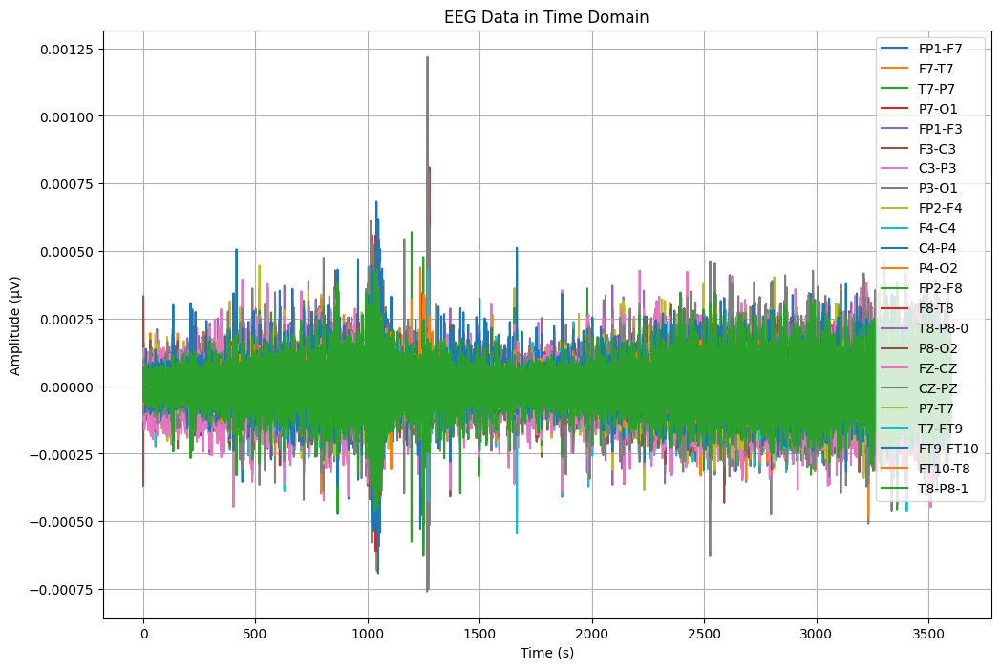

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_16.csv


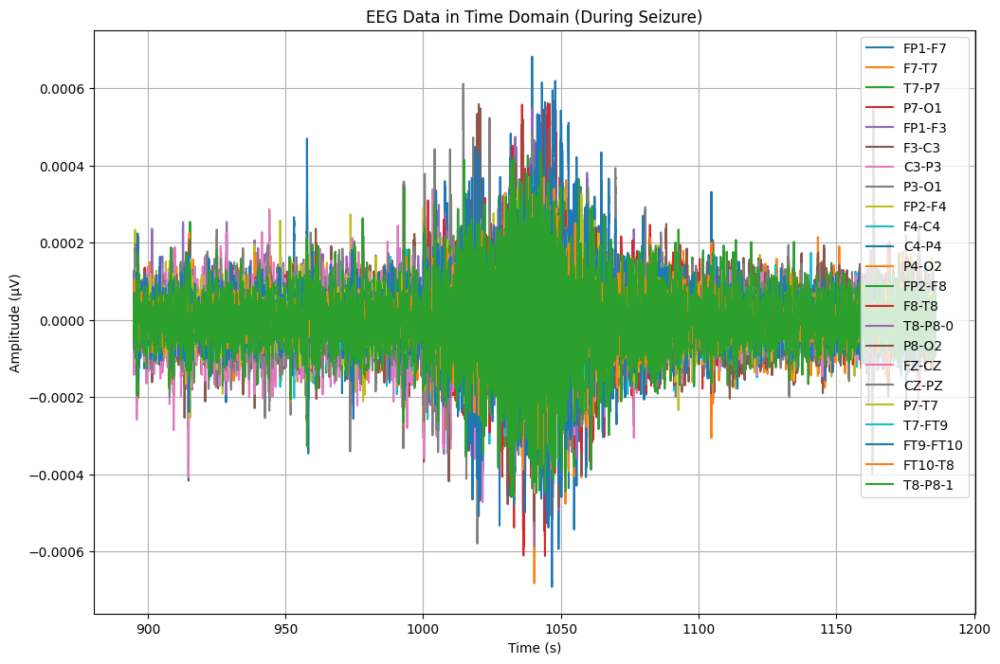

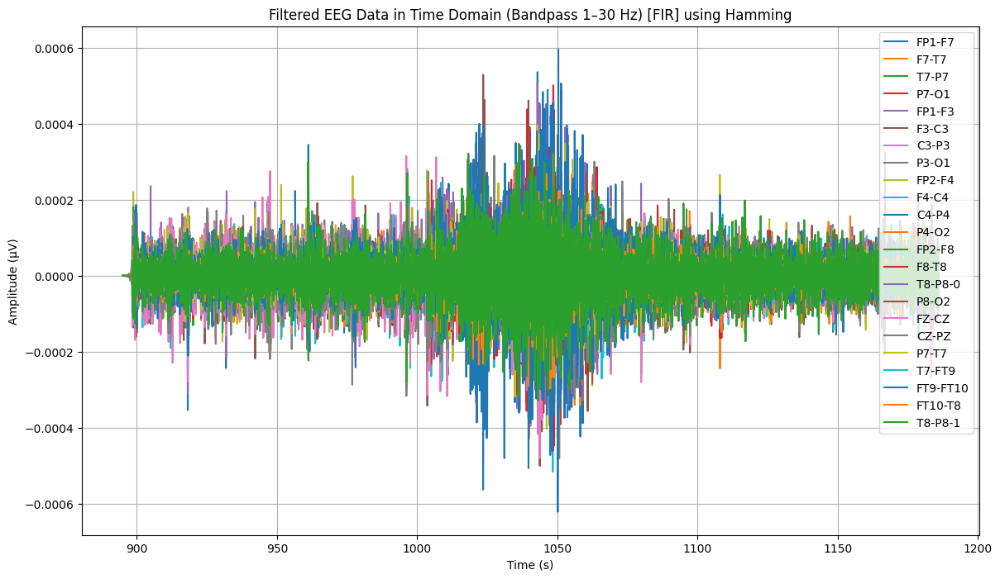

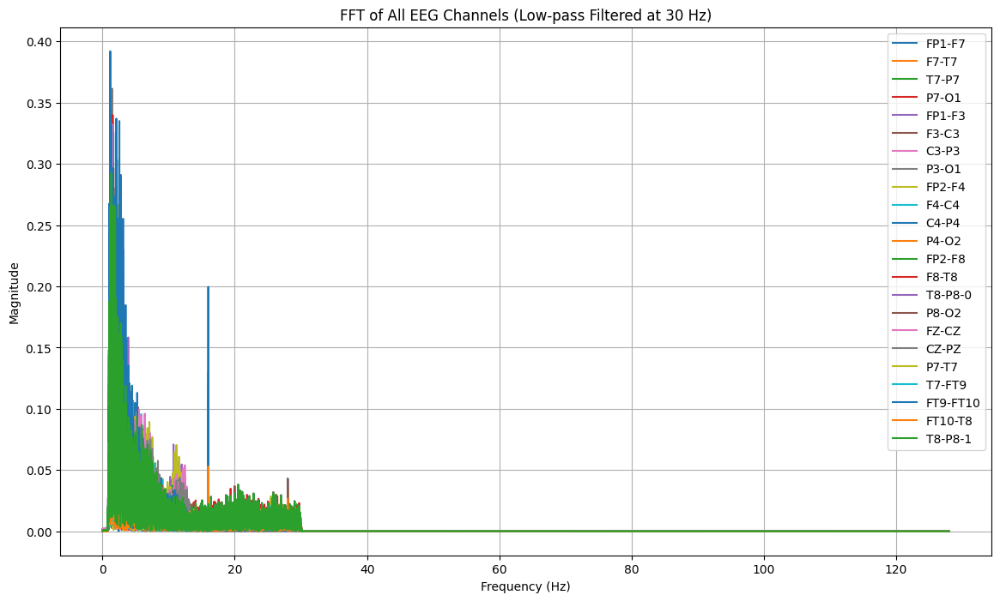

         Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  895.000000  tidak kejang -2.221581e-10 -6.091431e-10  4.944808e-10   
1  895.003906  tidak kejang  1.630091e-10 -1.634529e-09  1.280819e-09   
2  895.007812  tidak kejang  1.227543e-09 -2.095407e-09  1.130444e-09   
3  895.011719  tidak kejang  1.842621e-09 -1.198844e-09 -1.826916e-11   
4  895.015625  tidak kejang  1.846172e-09 -1.595068e-10 -9.384220e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -1.684101e-09 -1.813096e-09  2.142750e-09 -2.078253e-10 -2.185749e-09  ...   
1 -2.186121e-09 -2.044773e-09  3.242639e-09 -6.043708e-10 -3.004420e-09  ...   
2 -1.819417e-09 -1.076857e-09  3.206936e-09 -9.205136e-10 -2.785550e-09  ...   
3 -1.283437e-09  2.248274e-10  2.568762e-09 -1.131164e-09 -2.373561e-09  ...   
4 -1.299051e-09  1.067737e-09  2.267320e-09 -1.321820e-09 -2.657525e-09  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0  1.

In [ ]:
file1 = "/content/drive/MyDrive/TA/EDF/chb01_16.edf"
data4 = mne.io.read_raw_edf(file1)  # membaca file edf dan menyimpannya di data4
data4

# Mendapatkan data dan informasi dari file EDF
data, times = data4.get_data(return_times=True)
channel_names = data4.ch_names

# Membuat DataFrame dengan data EEG dan waktu
df4 = pd.DataFrame(data.T, columns=channel_names)
df4['Time'] = times
df4.head()


# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df4['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran
for channel in channels:
    plt.plot(time, df4[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Menentukan sample rate (misalkan 256 Hz)
sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 895
end_time_seconds = 1186

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

# Potong data berdasarkan rentang waktu
df_cut = df4.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_16.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA4 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_16.csv")
TA4.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Mengambil data waktu dari kolom 'Time'
time = TA4['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA4.columns:
        plt.plot(time, TA4[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Parameter untuk filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

# Mengambil data waktu dan sinyal EEG dari data yang sudah dipotong (TA4)
time = TA4['Time'].values
eeg_columns = TA4.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA4[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Membuat DataFrame dari data yang telah difilter
filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Fungsi untuk melakukan FFT dan mengembalikan frekuensi serta magnitude
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

# Sampling rate
sampling_rate = 256  # Misal 256 Hz

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

# Memberikan judul dan label pada plot
plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1015:
        return "tidak kejang"
    elif 1015 <= row['Time'] < 1066:
        return "kejang"
    else:
        return "tidak kejang"

# Menyalin filtered_df ke TA4 dan menambahkan kolom 'seizure' berdasarkan fungsi di atas
TA_4 = filtered_df.copy()
TA_4['seizure'] = filtered_df.apply(label_seizure, axis=1)

# Menampilkan hasil
print(TA_4[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_4.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_16.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Menentukan fitur (X) dan label (y)
X = TA_4.drop(['Time', 'seizure'], axis=1)
y = TA_4['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Membuat dan melatih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Memprediksi label pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_18.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-31-fe3109d6b652>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data5 = mne.io.read_raw_edf(file1)  # membaca file edf dan menyimpannya di data5


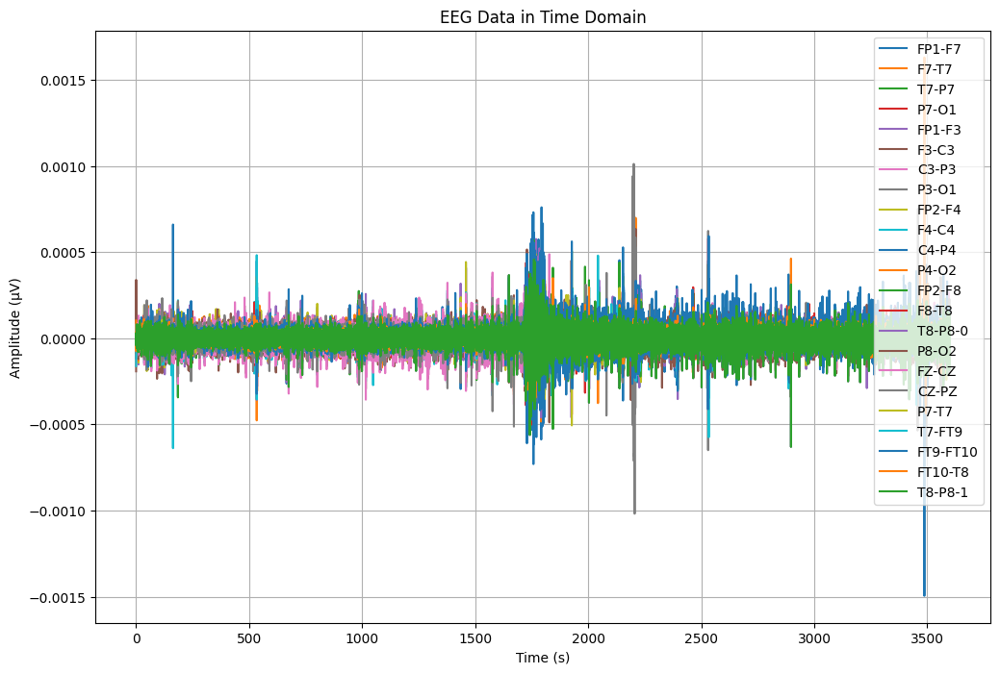

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_18.csv


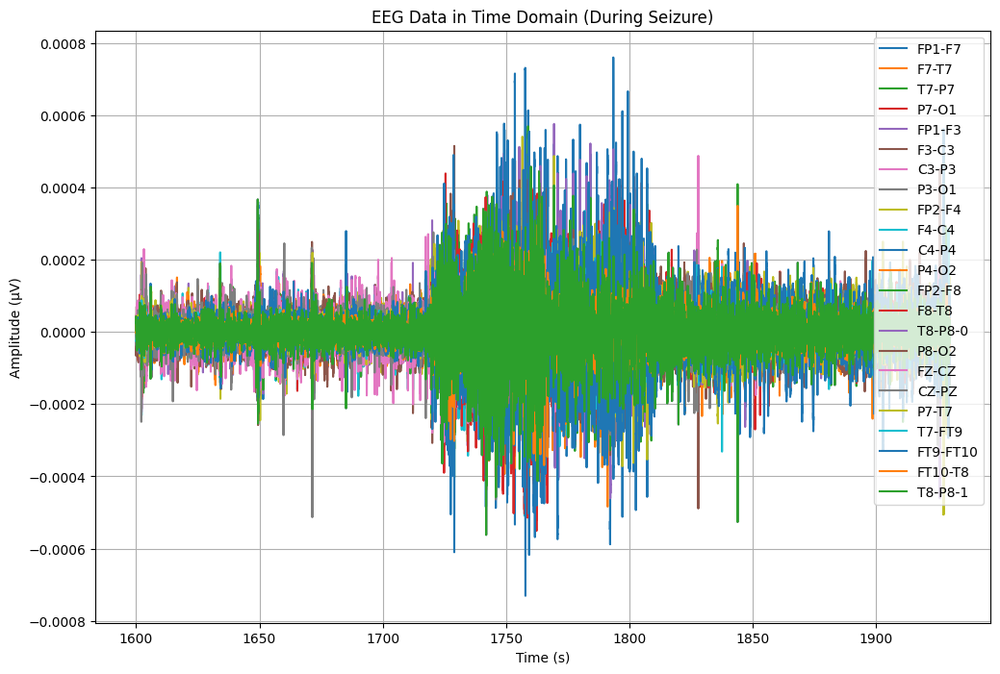

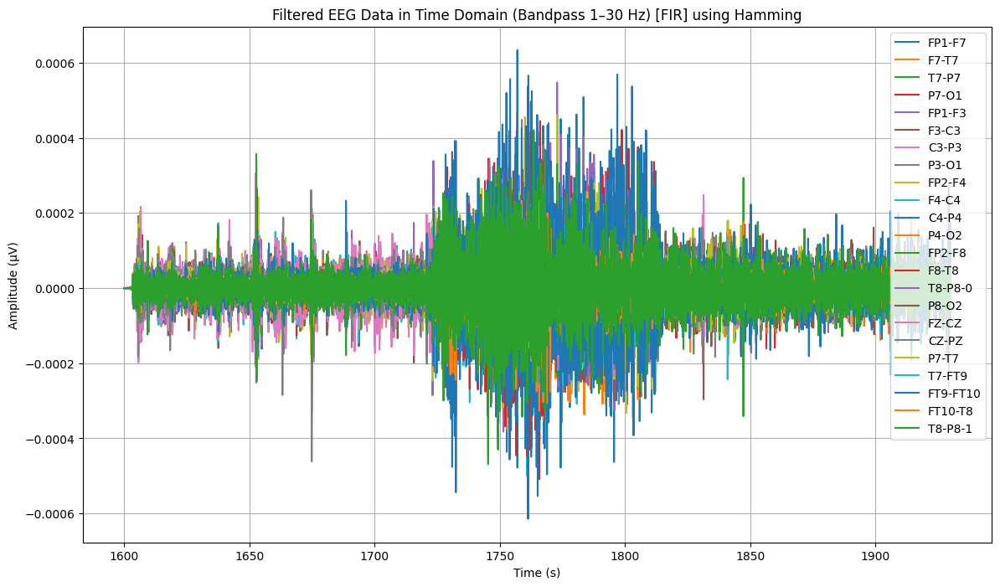

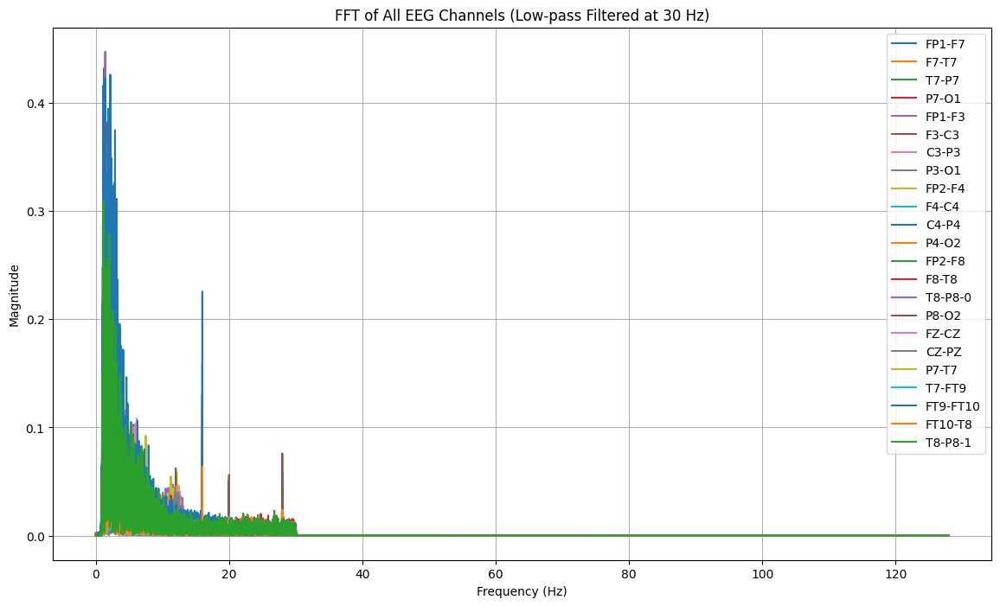

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1600.000000  tidak kejang -3.798186e-10  4.371497e-10 -4.228170e-10   
1  1600.003906  tidak kejang -6.547870e-10  6.381492e-10 -6.602246e-10   
2  1600.007812  tidak kejang -5.419162e-10  4.051177e-10 -5.478844e-10   
3  1600.011719  tidak kejang -3.967902e-10  2.176843e-10 -3.221852e-10   
4  1600.015625  tidak kejang -4.235669e-10  2.989327e-10 -2.351603e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  6.951397e-10  6.378086e-10 -2.508236e-10 -1.361614e-10  6.449750e-11  ...   
1  8.427685e-10  7.734096e-10 -3.374856e-10 -2.417661e-10 -6.176285e-12  ...   
2  6.490037e-10  5.169370e-10 -2.709563e-10 -1.985865e-10 -8.363449e-11  ...   
3  3.525809e-10  1.718033e-10 -1.503214e-10 -8.106518e-11 -9.352574e-11  ...   
4  2.408136e-10  4.720966e-11 -9.270308e-11 -5.944982e-11 -2.000191e-11  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file1 = "/content/drive/MyDrive/TA/EDF/chb01_18.edf"
data5 = mne.io.read_raw_edf(file1)  # membaca file edf dan menyimpannya di data5
data5

# Mendapatkan data dan informasi dari file EDF
data, times = data5.get_data(return_times=True)
channel_names = data5.ch_names

# Membuat DataFrame dengan data EEG dan waktu
df5 = pd.DataFrame(data.T, columns=channel_names)
df5['Time'] = times
df5.head()

# Menentukan saluran EEG yang akan ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df5['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran
for channel in channels:
    plt.plot(time, df5[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Menentukan sample rate (misalkan 256 Hz)
sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1600
end_time_seconds = 1930

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

# Potong data berdasarkan rentang waktu
df_cut = df5.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_18.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA5 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_18.csv")
TA5.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Mengambil data waktu dari kolom 'Time'
time = TA5['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA5.columns:
        plt.plot(time, TA5[channel], label=channel)

# Menambahkan judul dan label
plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')

# Menampilkan grid dan plot
plt.grid(True)
plt.show()

from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

# Parameter untuk filter
lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

# Mengambil data waktu dan sinyal EEG dari data yang sudah dipotong (TA5)
time = TA5['Time'].values
eeg_columns = TA5.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA5[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

# Membuat DataFrame dari data yang telah difilter
filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Fungsi untuk melakukan FFT dan mengembalikan frekuensi serta magnitude
def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

# Sampling rate
sampling_rate = 256  # Misal 256 Hz

# Pilih beberapa atau semua saluran EEG untuk ditampilkan
channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

# Membuat plot untuk semua saluran EEG dalam satu gambar
plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

# Memberikan judul dan label pada plot
plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1720:
        return "tidak kejang"
    elif 1720 <= row['Time'] < 1810:
        return "kejang"
    else:
        return "tidak kejang"

# Menyalin data5 ke df5 dan menambahkan kolom 'seizure' berdasarkan fungsi di atas
TA_5 = filtered_df.copy()
TA_5['seizure'] = filtered_df.apply(label_seizure, axis=1)

# Menampilkan hasil
print(TA_5[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_5.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_18.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

# Menentukan fitur (X) dan label (y)
X = TA_5.drop(['Time', 'seizure'], axis=1)
y = TA_5['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Membuat dan melatih model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Memprediksi label pada data pengujian
y_pred = model.predict(X_test)

# Evaluasi model
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_21.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-32-fce29d3edc15>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data6 = mne.io.read_raw_edf(file1)  # membaca file edf dan menyimpannya di data6


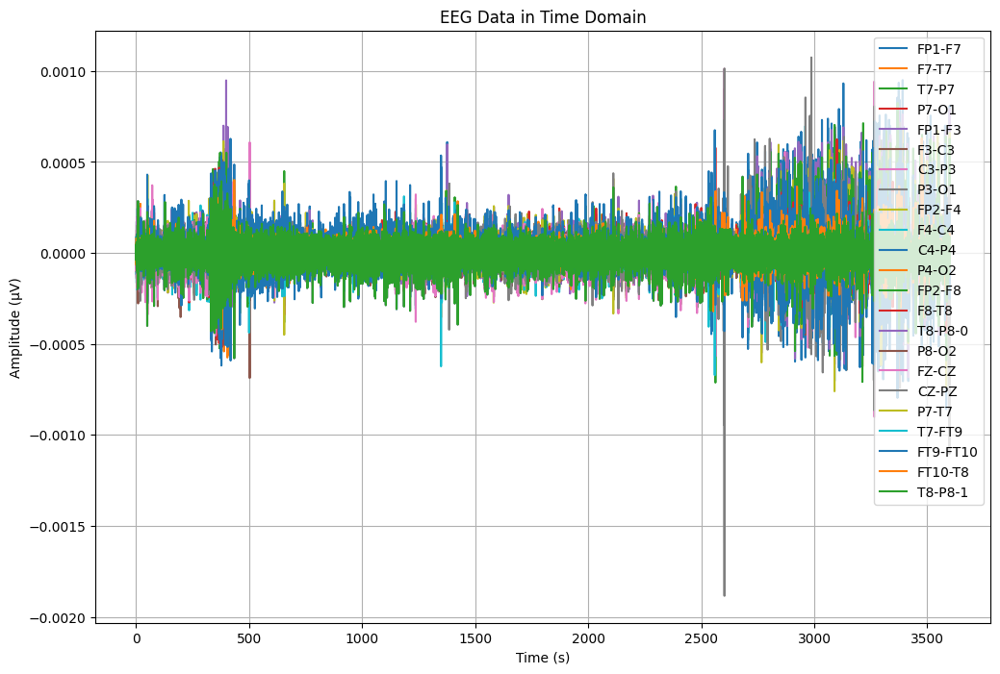

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_21.csv


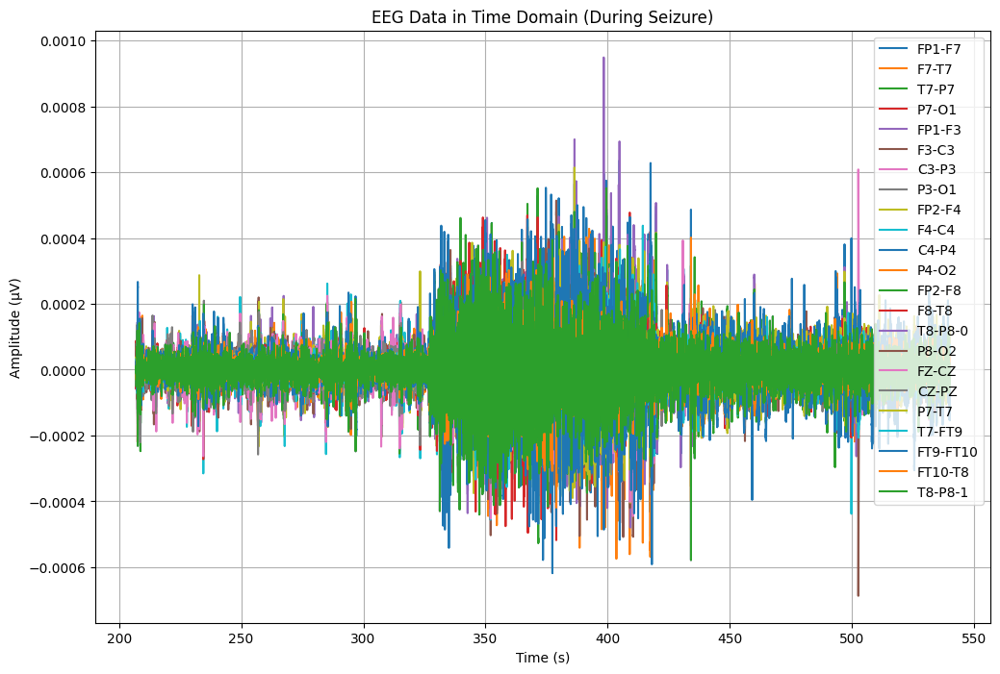

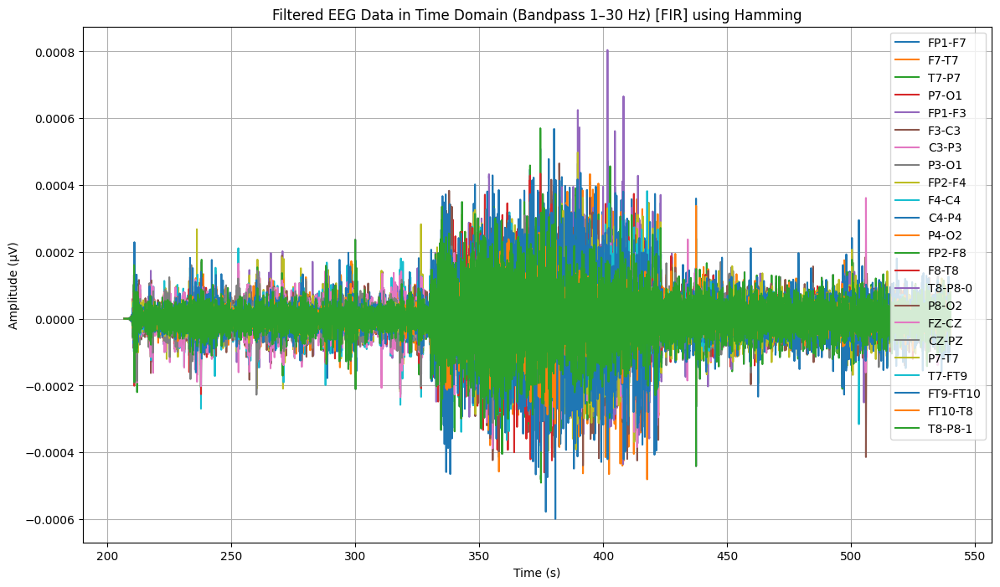

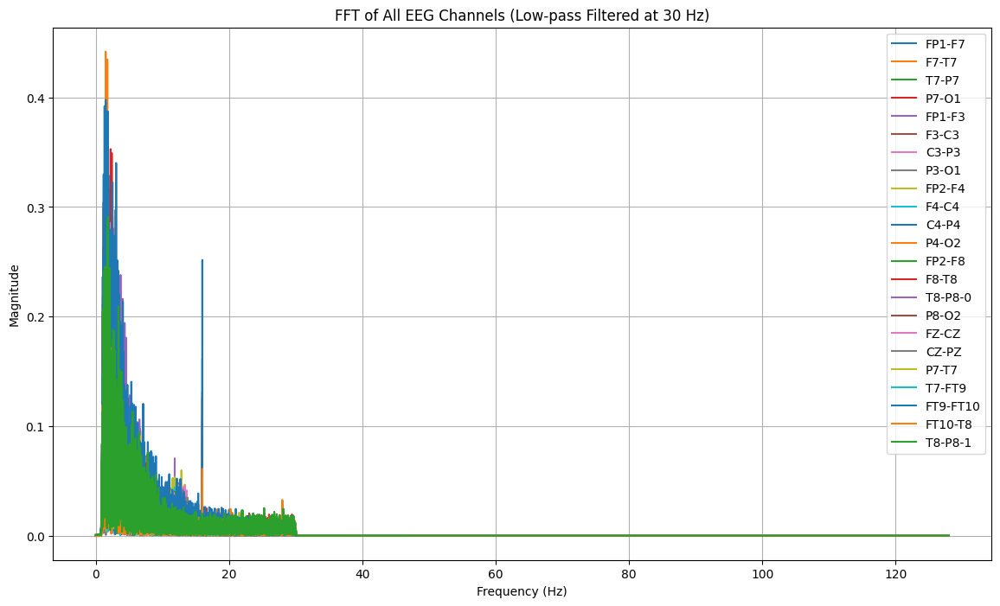

         Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  207.000000  tidak kejang  4.084842e-10  5.948103e-10  1.225453e-09   
1  207.003906  tidak kejang  5.963034e-10  9.112997e-10  1.889240e-09   
2  207.007812  tidak kejang  6.511103e-10  1.064185e-09  1.913465e-09   
3  207.011719  tidak kejang  6.165611e-10  1.109534e-09  1.619676e-09   
4  207.015625  tidak kejang  6.069590e-10  1.137628e-09  1.629138e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -6.091431e-10  2.508236e-10  4.514825e-10  5.088136e-10  3.511531e-10  ...   
1 -9.895538e-10  4.091495e-10  6.877377e-10  7.284311e-10  4.552805e-10  ...   
2 -1.182541e-09  5.762298e-10  7.682833e-10  7.151765e-10  2.567684e-10  ...   
3 -1.314736e-09  6.738946e-10  8.150153e-10  5.882402e-10 -8.235210e-11  ...   
4 -1.640414e-09  6.504359e-10  9.230327e-10  5.632588e-10 -4.107323e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0  7.

In [ ]:
file1 = "/content/drive/MyDrive/TA/EDF/chb01_21.edf"
data6 = mne.io.read_raw_edf(file1)  # membaca file edf dan menyimpannya di data6
data6

data, times = data6.get_data(return_times=True)
channel_names = data6.ch_names

df6 = pd.DataFrame(data.T, columns=channel_names)
df6['Time'] = times
df6.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df6['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df6[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 207
end_time_seconds = 540

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df6.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_21.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA6 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_21.csv")
TA6.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

time = TA6['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA6.columns:
        plt.plot(time, TA6[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA6['Time'].values
eeg_columns = TA6.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA6[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3', 'C3-P3', 'P3-O1',
            'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8', 'T8-P8-0', 'P8-O2',
            'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 327:
        return "tidak kejang"
    elif 327 <= row['Time'] < 420:
        return "kejang"
    else:
        return "tidak kejang"

TA_6 = filtered_df.copy()
TA_6['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_6[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_6.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_21.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_6.drop(['Time', 'seizure'], axis=1)
y = TA_6['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb01_26.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-33-84d1998c30db>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data7 = mne.io.read_raw_edf(file7)  # membaca file edf dan menyimpannya di data7


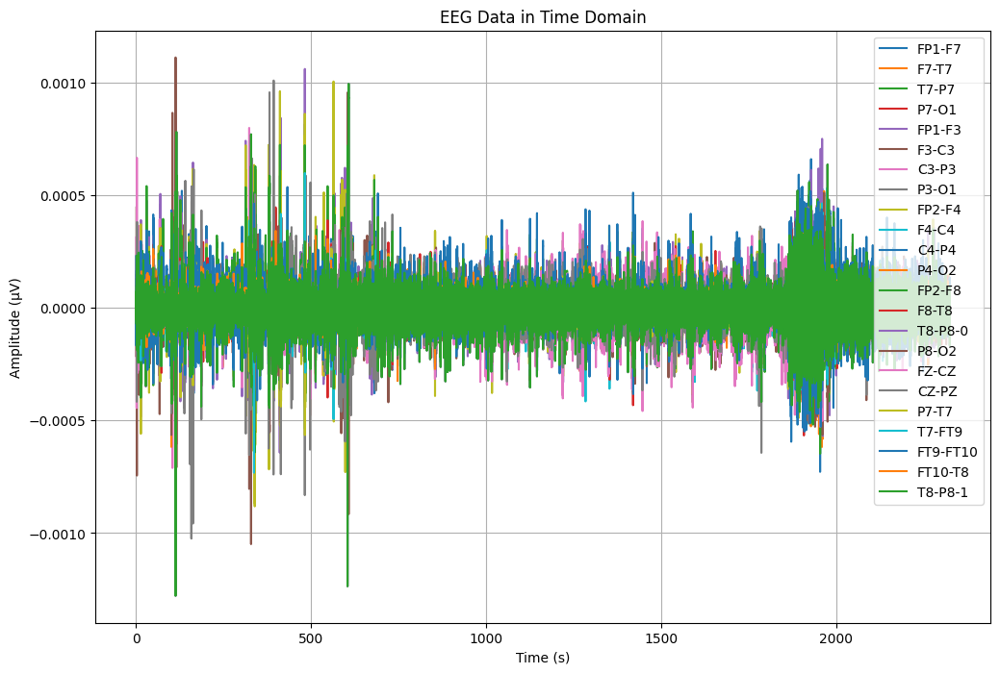

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb01_26.csv


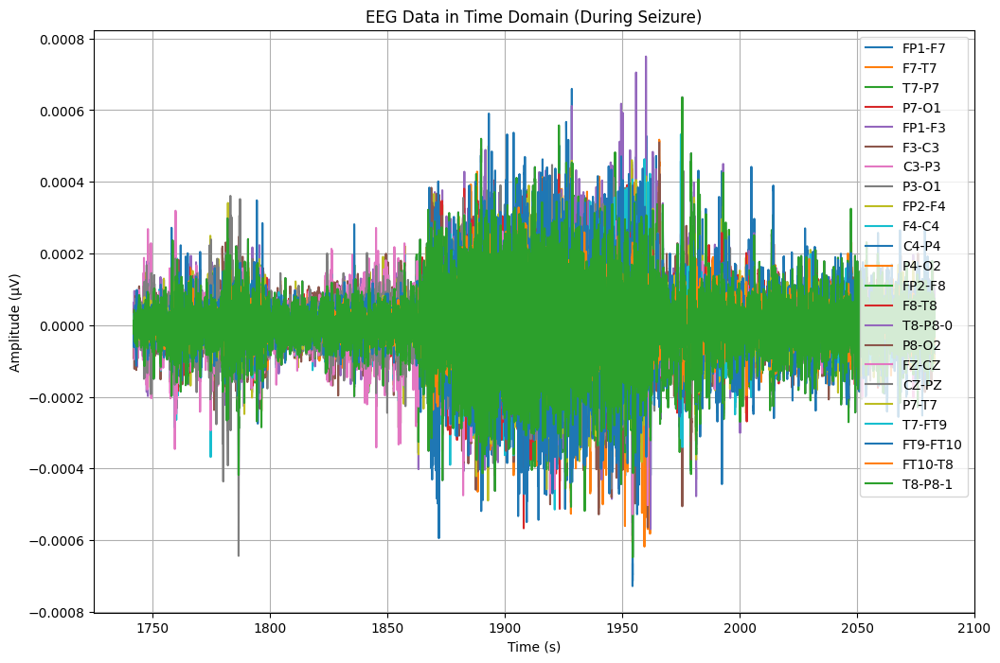

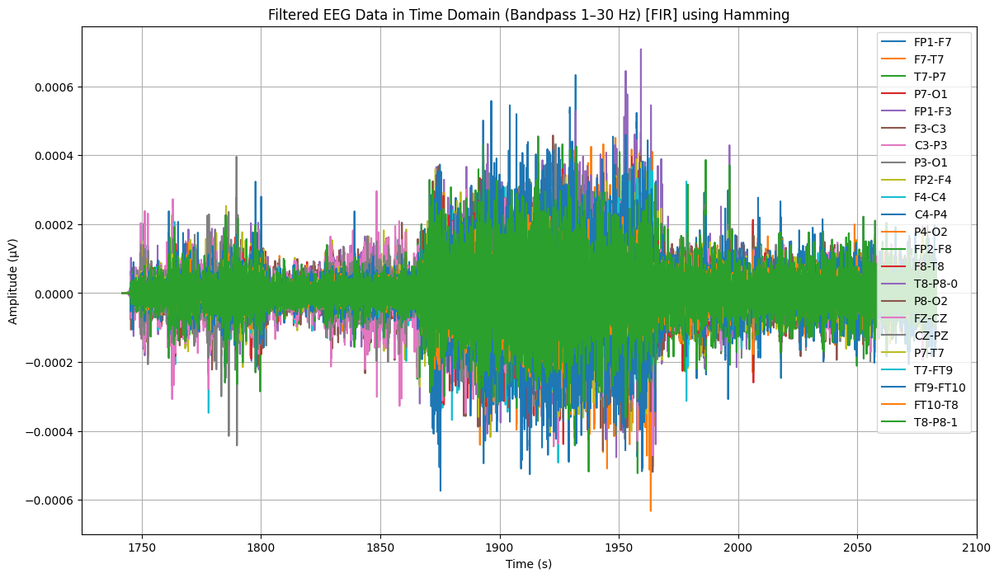

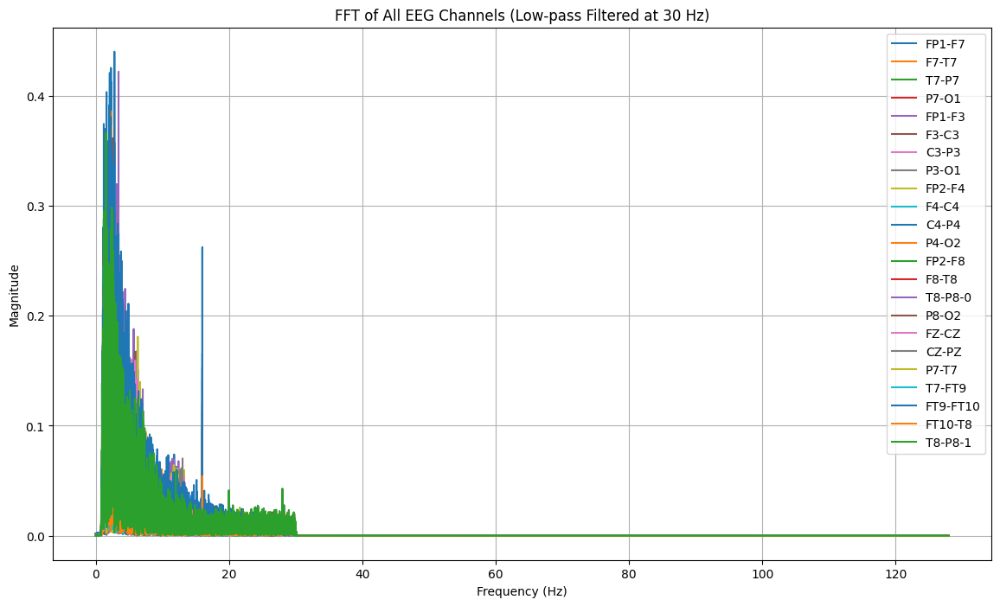

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1742.000000  tidak kejang -1.583772e-09 -2.364908e-10  3.511531e-10   
1  1742.003906  tidak kejang -2.340649e-09 -1.159038e-10  7.276033e-10   
2  1742.007812  tidak kejang -2.245473e-09  1.856239e-10  1.055622e-09   
3  1742.011719  tidak kejang -1.665341e-09  4.751676e-10  1.176443e-09   
4  1742.015625  tidak kejang -1.223747e-09  5.608261e-10  1.185850e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  1.039126e-09 -2.185749e-09  1.504942e-10  1.182454e-09  3.941514e-10  ...   
1  1.574243e-09 -3.147748e-09  3.630185e-10  1.840804e-09  7.617066e-10  ...   
2  1.686717e-09 -2.837119e-09  4.657078e-10  1.902059e-09  1.146434e-09  ...   
3  1.599360e-09 -1.744747e-09  2.864736e-10  1.659647e-09  1.405929e-09  ...   
4  1.756028e-09 -9.507186e-10  1.047779e-10  1.520650e-09  1.628930e-09  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file7 = "/content/drive/MyDrive/TA/EDF/chb01_26.edf"
data7 = mne.io.read_raw_edf(file7)  # membaca file edf dan menyimpannya di data7
data7

data, times = data7.get_data(return_times=True)
channel_names = data7.ch_names

df7 = pd.DataFrame(data.T, columns=channel_names)
df7['Time'] = times
df7.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df7['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df7[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1742
end_time_seconds = 2083

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df7.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb01_26.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA7 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb01_26.csv")
TA7.head()

time = TA7['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA7.columns:
        plt.plot(time, TA7[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA7['Time'].values
eeg_columns = TA7.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA7[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1862:
        return "tidak kejang"
    elif 1862 <= row['Time'] < 1963:
        return "kejang"
    else:
        return "tidak kejang"

TA_7 = filtered_df.copy()
TA_7['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_7[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_7.to_csv("/content/drive/MyDrive/TA/FILTERING/chb01_26.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_7.drop(['Time', 'seizure'], axis=1)
y = TA_7['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb02_16.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-36-19cb2d673199>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data8 = mne.io.read_raw_edf(file8)


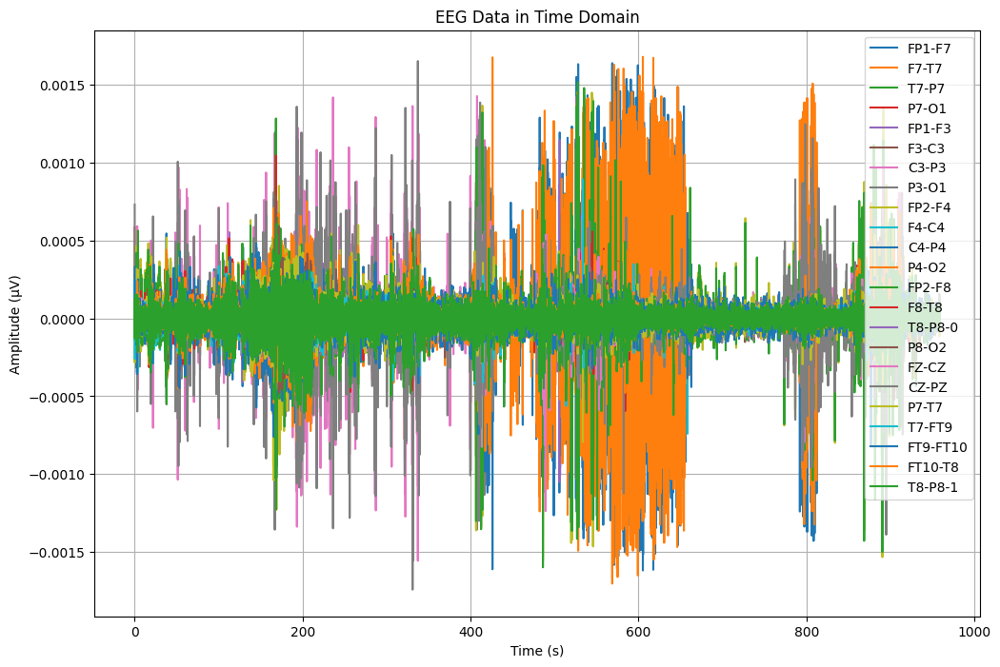

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb02_16.csv


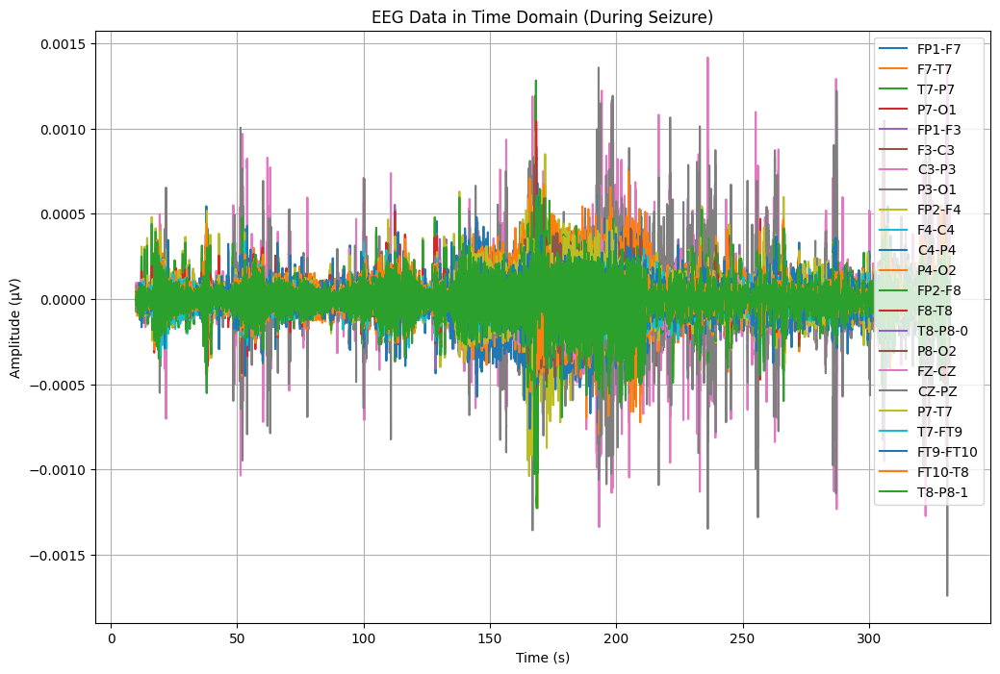

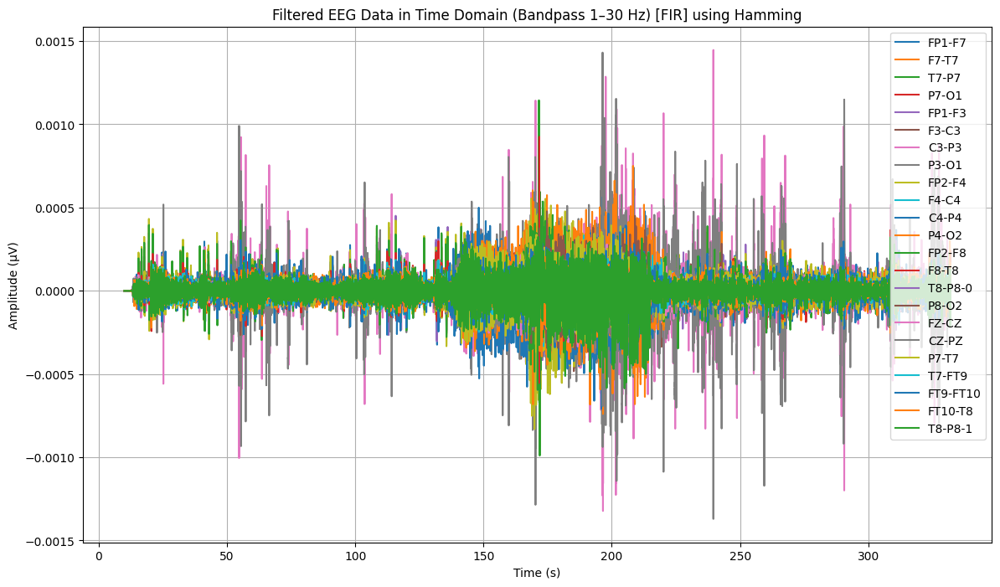

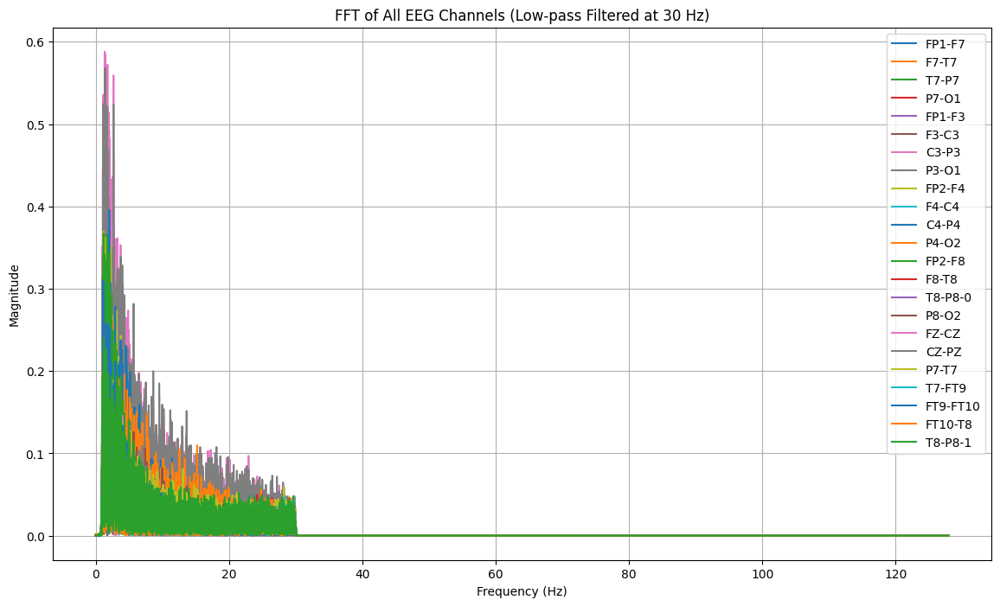

        Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  10.000000  tidak kejang  2.078253e-10 -1.110790e-09 -5.016472e-11   
1  10.003906  tidak kejang  1.457219e-10 -1.535530e-09  2.709921e-11   
2  10.007812  tidak kejang -7.867387e-11 -1.493148e-09  1.756298e-10   
3  10.011719  tidak kejang  1.426584e-10 -1.183301e-09  3.010943e-10   
4  10.015625  tidak kejang  3.488015e-10 -1.196885e-09  5.506168e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -1.361614e-10  6.091431e-10 -6.091431e-10  1.074958e-10 -1.239785e-09  ...   
1 -1.987678e-10  6.455671e-10 -7.458965e-10 -2.157303e-10 -1.265187e-09  ...   
2 -3.221438e-10  3.077382e-10 -6.118592e-10 -5.061724e-10 -9.492668e-10  ...   
3 -4.783950e-10  2.684525e-10 -1.679432e-10 -4.828253e-10 -8.596079e-10  ...   
4 -5.305523e-10  3.399128e-10  9.419380e-11 -9.427806e-11 -1.215083e-09  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0 -4.371497

In [ ]:
file8 = "/content/drive/MyDrive/TA/EDF/chb02_16.edf"
data8 = mne.io.read_raw_edf(file8)
data8

data, times = data8.get_data(return_times=True)
channel_names = data8.ch_names

df8 = pd.DataFrame(data.T, columns=channel_names)
df8['Time'] = times
df8.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df8['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df8[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 10
end_time_seconds = 332

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df8.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb02_16.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA8 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb02_16.csv")
TA8.head()

time = TA8['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA8.columns:
        plt.plot(time, TA8[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA8['Time'].values
eeg_columns = TA8.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA8[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 130:
        return "tidak kejang"
    elif 130 <= row['Time'] < 212:
        return "kejang"
    else:
        return "tidak kejang"

TA_8 = filtered_df.copy()
TA_8['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_8[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_8.to_csv("/content/drive/MyDrive/TA/FILTERING/chb02_16.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_8.drop(['Time', 'seizure'], axis=1)
y = TA_8['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb02_16+.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-37-c9e2c8eedead>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data9 = mne.io.read_raw_edf(file9)


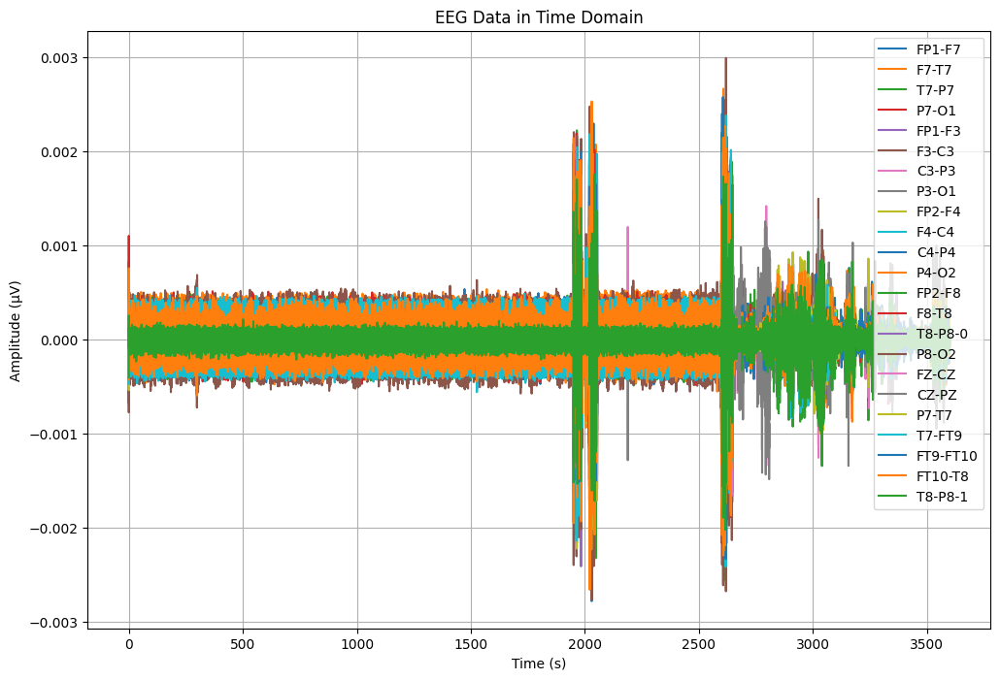

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb02_16+.csv


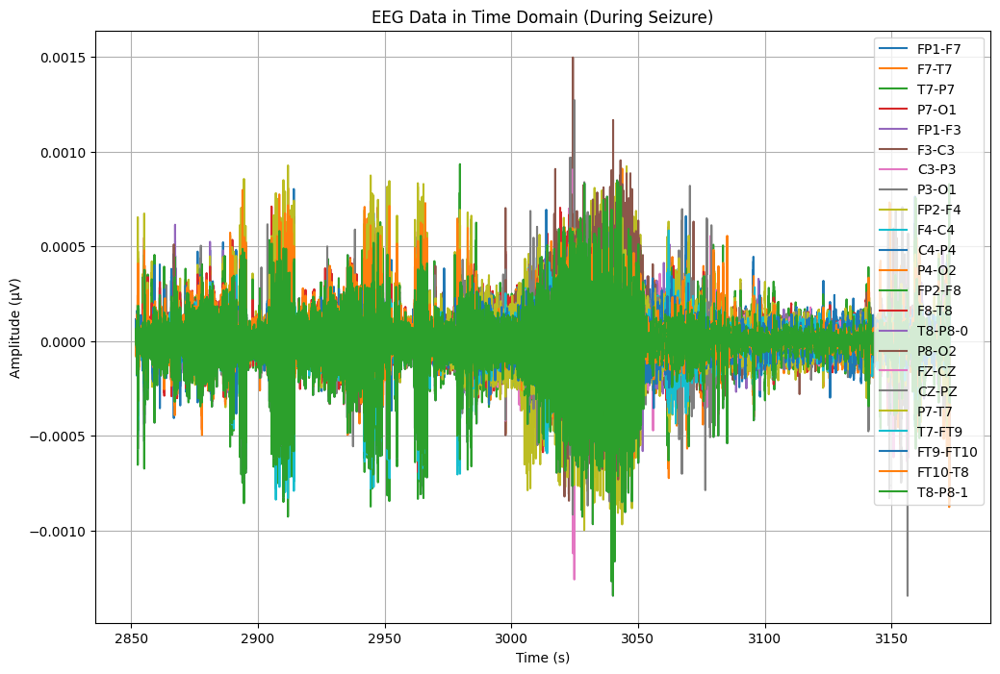

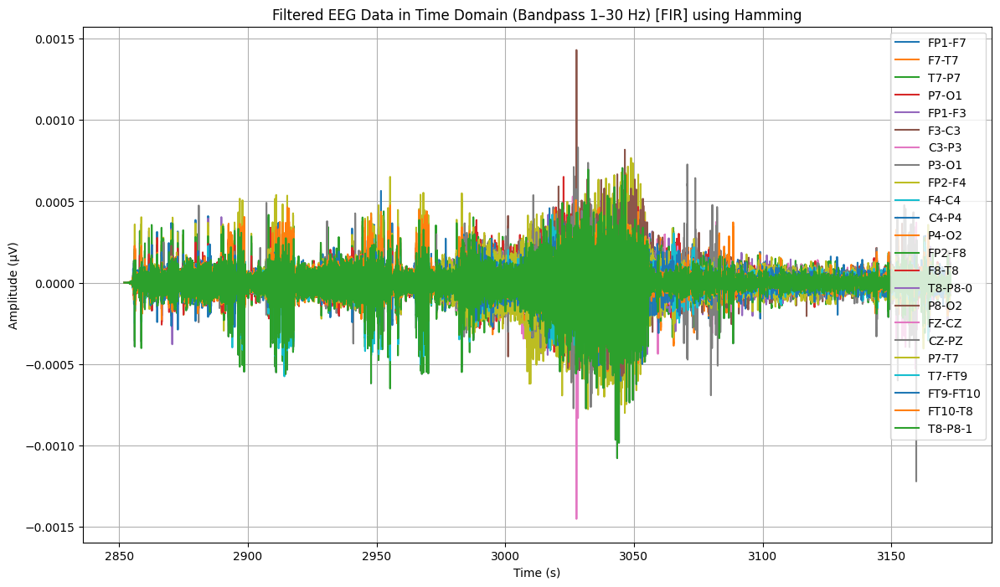

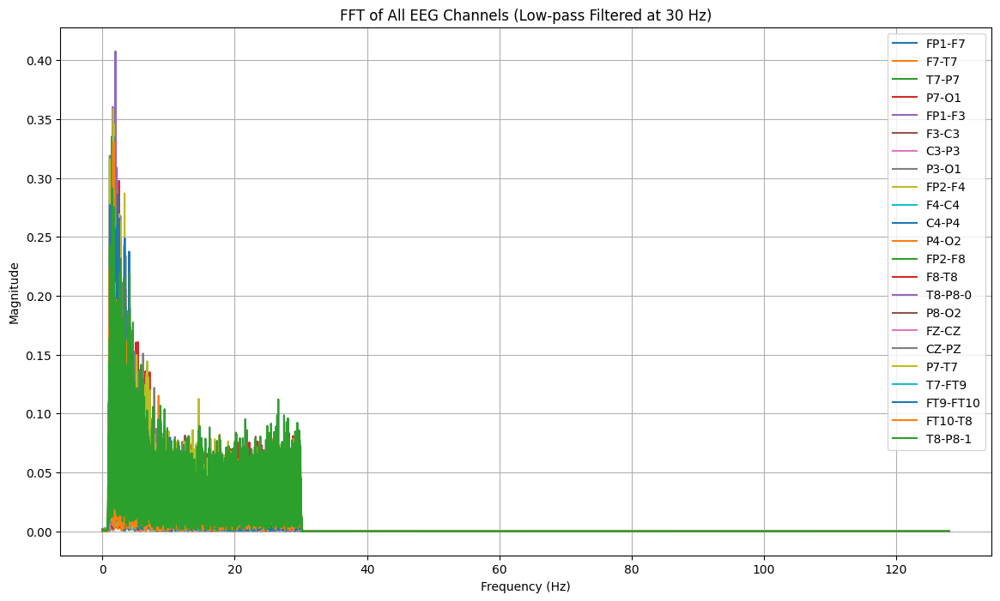

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  2852.000000  tidak kejang  3.081547e-10 -6.664742e-10 -5.231464e-10   
1  2852.003906  tidak kejang  1.066152e-09  1.593735e-10 -1.781314e-09   
2  2852.007812  tidak kejang  1.637800e-09  5.641707e-10 -2.342288e-09   
3  2852.011719  tidak kejang  1.291229e-09 -4.235154e-10 -9.685708e-10   
4  2852.015625  tidak kejang  9.946376e-10 -4.760537e-10 -6.102836e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -1.669769e-09 -5.661447e-10  6.808070e-10 -2.343409e-09 -3.081547e-10  ...   
1 -2.222529e-09  2.915012e-10  6.928506e-10 -3.406565e-09 -3.781790e-10  ...   
2 -2.069103e-09  1.387874e-09  3.543693e-10 -3.346268e-09 -6.335000e-10  ...   
3 -1.619804e-09  1.588709e-09  4.427537e-10 -2.958271e-09 -7.883012e-10  ...   
4 -1.485429e-09  1.659813e-09  6.278741e-10 -2.979932e-09 -8.998129e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file9 = "/content/drive/MyDrive/TA/EDF/chb02_16+.edf"
data9 = mne.io.read_raw_edf(file9)
data9

data, times = data9.get_data(return_times=True)
channel_names = data9.ch_names

df9 = pd.DataFrame(data.T, columns=channel_names)
df9['Time'] = times
df9.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df9['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df9[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 2852
end_time_seconds = 3173

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df9.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb02_16+.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA9 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb02_16+.csv")
TA9.head()

time = TA9['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA9.columns:
        plt.plot(time, TA9[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA9['Time'].values
eeg_columns = TA9.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA9[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 2972:
        return "tidak kejang"
    elif 2972 <= row['Time'] < 3053:
        return "kejang"
    else:
        return "tidak kejang"

TA_9 = filtered_df.copy()
TA_9['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_9[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_9.to_csv("/content/drive/MyDrive/TA/FILTERING/chb02_16+.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_9.drop(['Time', 'seizure'], axis=1)
y = TA_9['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb02_19.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-38-8131a504e09a>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data10 = mne.io.read_raw_edf(file10)


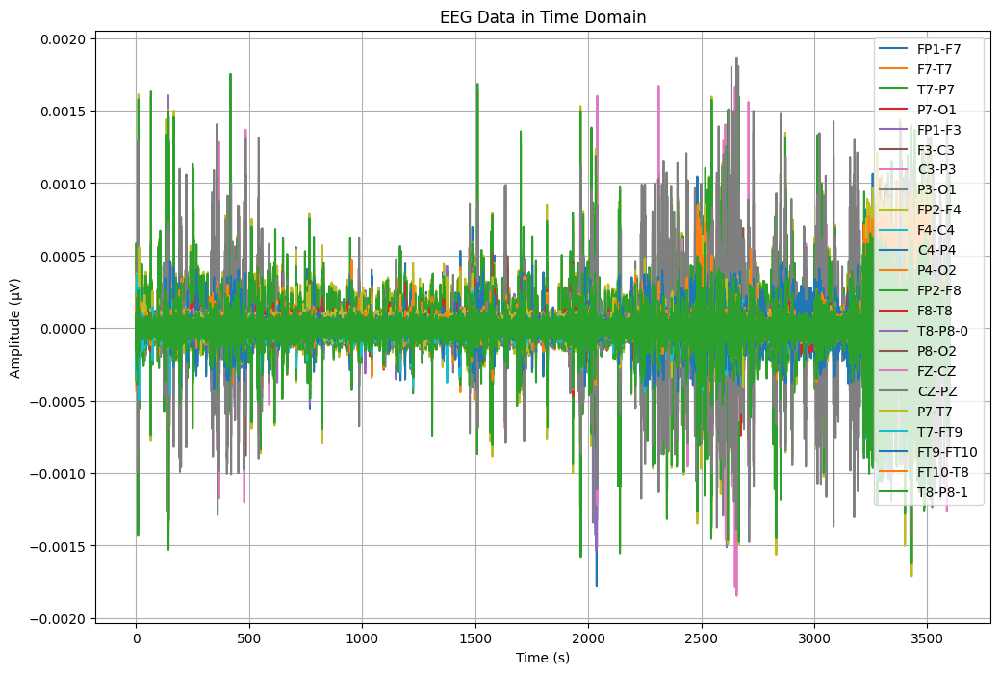

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb02_19.csv


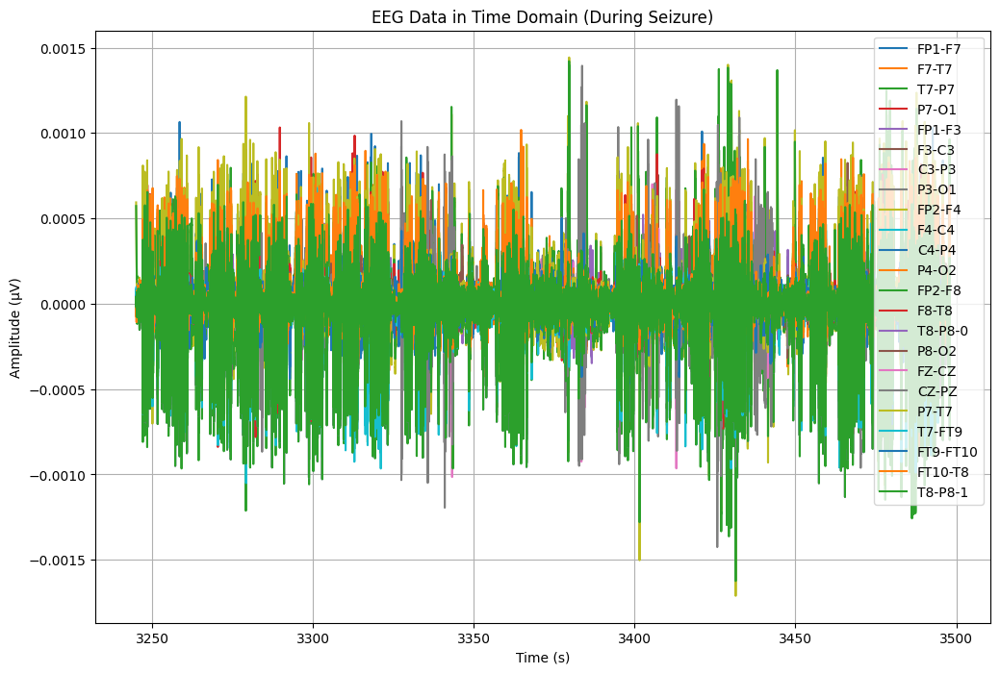

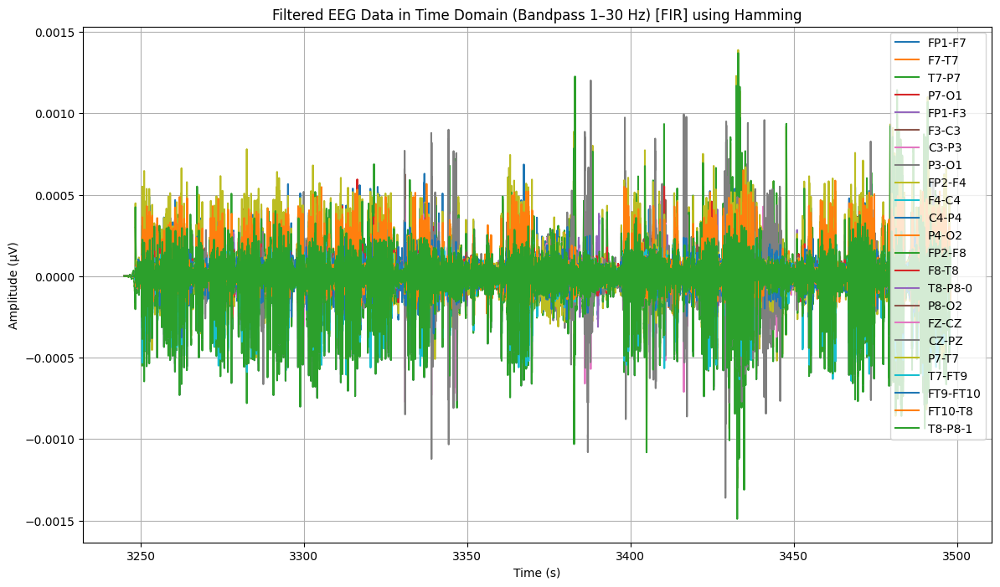

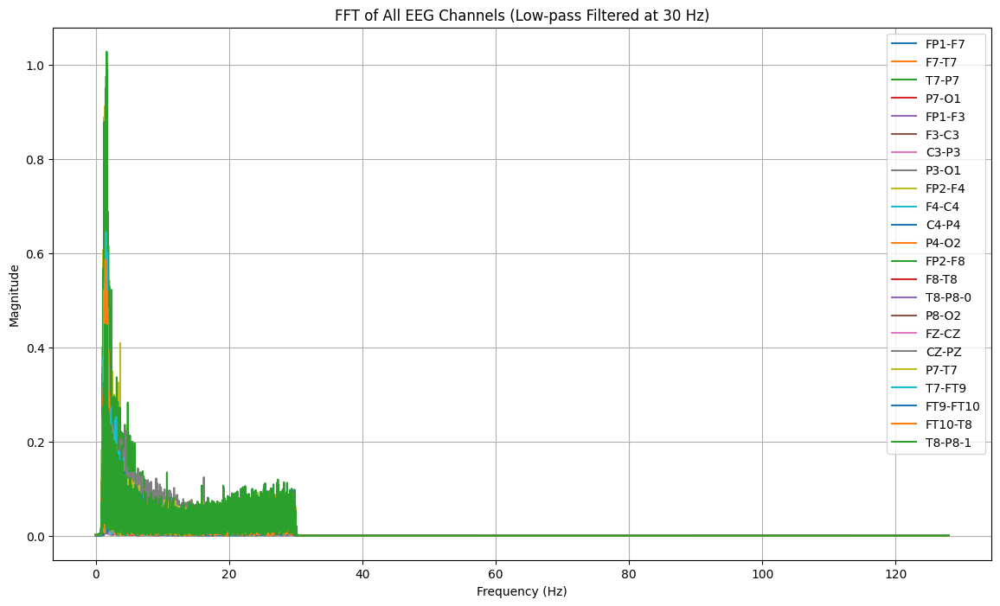

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  3245.000000  tidak kejang -1.139456e-09  2.372075e-09 -3.798186e-10   
1  3245.003906  tidak kejang -1.663373e-09  3.262085e-09  4.520839e-12   
2  3245.007812  tidak kejang -1.229366e-09  2.856943e-09  9.088443e-11   
3  3245.011719  tidak kejang -9.838393e-10  1.935614e-09 -2.580917e-10   
4  3245.015625  tidak kejang -1.807722e-09  1.175311e-09 -4.138018e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -8.384675e-10 -9.244642e-10  3.798186e-10  1.218286e-10  3.511531e-10  ...   
1 -1.438983e-09 -1.263532e-09  6.261214e-10  3.641710e-10  3.549511e-10  ...   
2 -1.374239e-09 -1.214507e-09  5.430687e-10  4.018170e-10  5.259585e-10  ...   
3 -1.022666e-09 -1.386250e-09  4.624379e-11  1.880160e-10  7.117464e-10  ...   
4 -1.327880e-09 -2.266533e-09 -6.523276e-10  4.313020e-11  3.980788e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file10 = "/content/drive/MyDrive/TA/EDF/chb02_19.edf"
data10 = mne.io.read_raw_edf(file10)
data10

data, times = data10.get_data(return_times=True)
channel_names = data10.ch_names

df10 = pd.DataFrame(data.T, columns=channel_names)
df10['Time'] = times
df10.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df10['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df10[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 3245
end_time_seconds = 3498

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df10.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb02_19.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA10 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb02_19.csv")
TA10.head()

time = TA10['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA10.columns:
        plt.plot(time, TA10[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA10['Time'].values
eeg_columns = TA10.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA10[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 3365:
        return "tidak kejang"
    elif 3365 <= row['Time'] < 3378:
        return "kejang"
    else:
        return "tidak kejang"

TA_10 = filtered_df.copy()
TA_10['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_10[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_10.to_csv("/content/drive/MyDrive/TA/FILTERING/chb02_19.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_10.drop(['Time', 'seizure'], axis=1)
y = TA_10['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-39-8f01a0aa3bdf>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data11 = mne.io.read_raw_edf(file11)


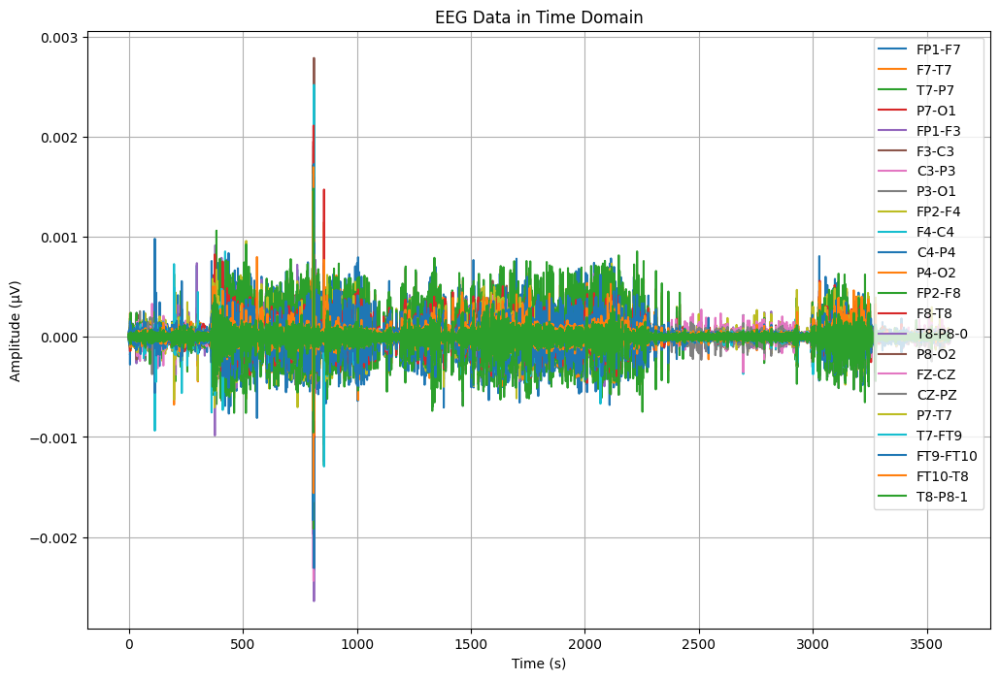

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_01.csv


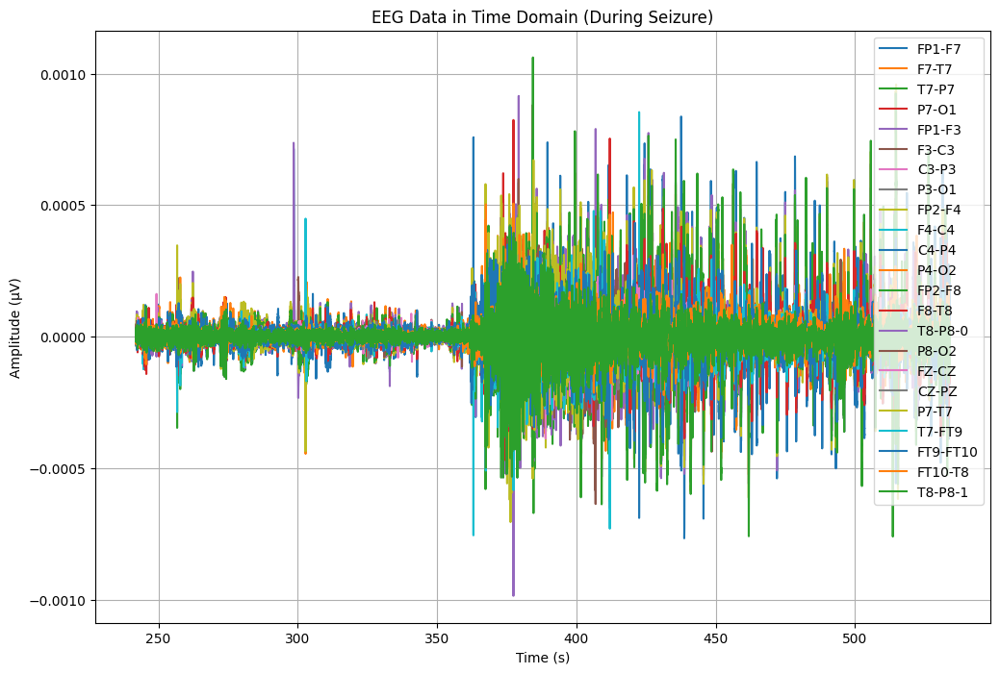

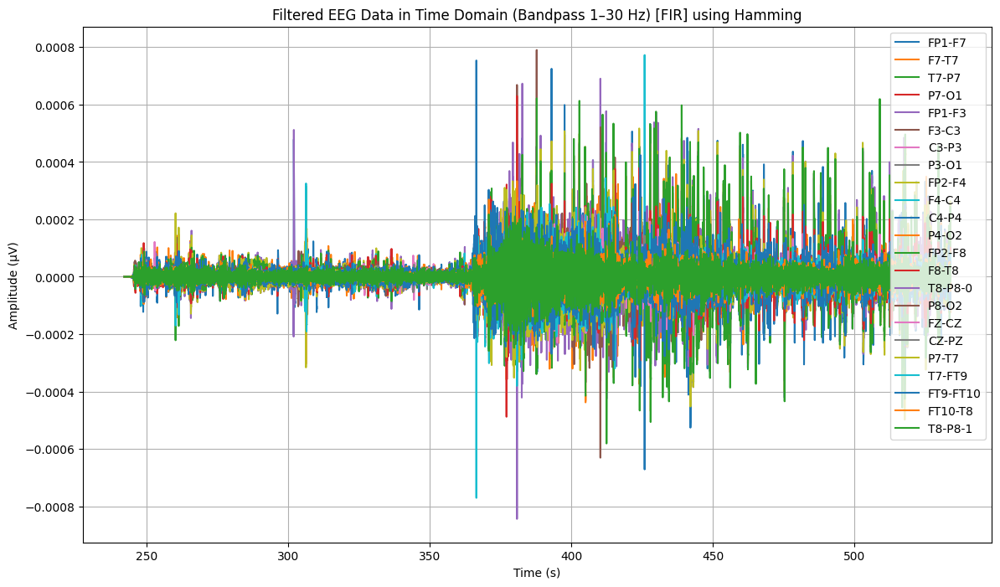

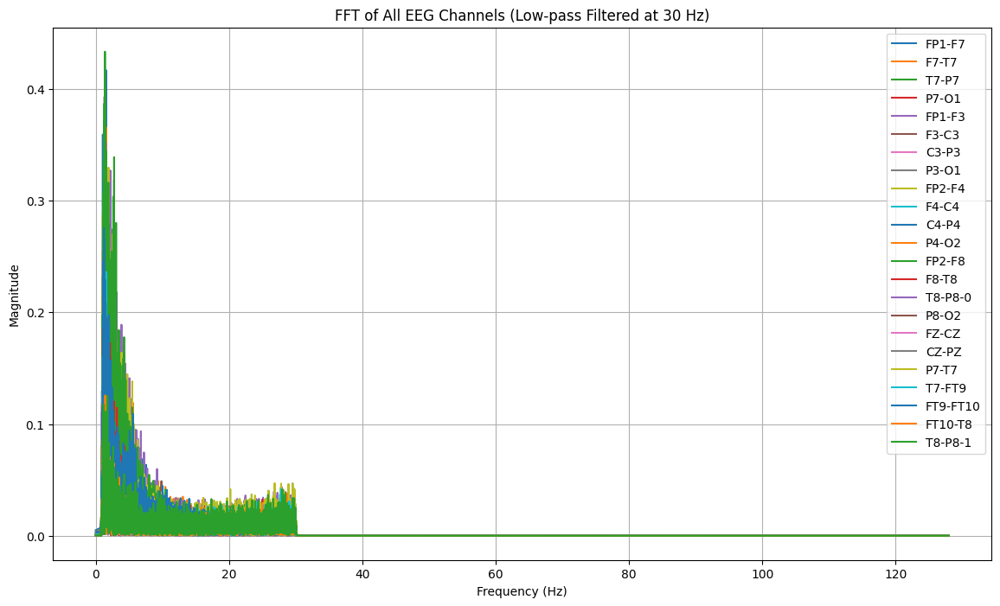

         Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  242.000000  tidak kejang  5.374792e-10 -7.166389e-12 -2.221581e-10   
1  242.003906  tidak kejang  5.696180e-10  6.488463e-10 -1.384931e-09   
2  242.007812  tidak kejang  3.769218e-10  5.796366e-10 -1.476449e-09   
3  242.011719  tidak kejang  2.406423e-10  2.251117e-10 -6.721328e-10   
4  242.015625  tidak kejang  1.932471e-10  1.562079e-10 -2.919166e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  5.016472e-11  2.149917e-11  4.801481e-10  9.316306e-11 -2.794892e-10  ...   
1  1.735597e-10 -1.161395e-11  5.145919e-10 -5.032710e-11 -3.936643e-10  ...   
2  7.429278e-11 -4.660437e-11  4.234385e-10 -3.118369e-10 -4.328715e-10  ...   
3 -3.945438e-10  4.384800e-11  3.676794e-10 -4.624932e-10 -4.800228e-10  ...   
4 -5.048605e-10  1.147369e-10  4.386003e-10 -5.251404e-10 -4.451503e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0 -2.

In [ ]:
file11 = "/content/drive/MyDrive/TA/EDF/chb03_01.edf"
data11 = mne.io.read_raw_edf(file11)
data11

data, times = data11.get_data(return_times=True)
channel_names = data11.ch_names

df11 = pd.DataFrame(data.T, columns=channel_names)
df11['Time'] = times
df11.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df11['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df11[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 242
end_time_seconds = 534

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df11.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_01.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA11 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_01.csv")
TA11.head()

time = TA11['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA11.columns:
        plt.plot(time, TA11[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA11['Time'].values
eeg_columns = TA11.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA11[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 362:
        return "tidak kejang"
    elif 362 <= row['Time'] < 414:
        return "kejang"
    else:
        return "tidak kejang"

TA_11 = filtered_df.copy()
TA_11['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_11[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_11.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_01.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_11.drop(['Time', 'seizure'], axis=1)
y = TA_11['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_02.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-40-f2401f0bb8e8>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data12 = mne.io.read_raw_edf(file12)


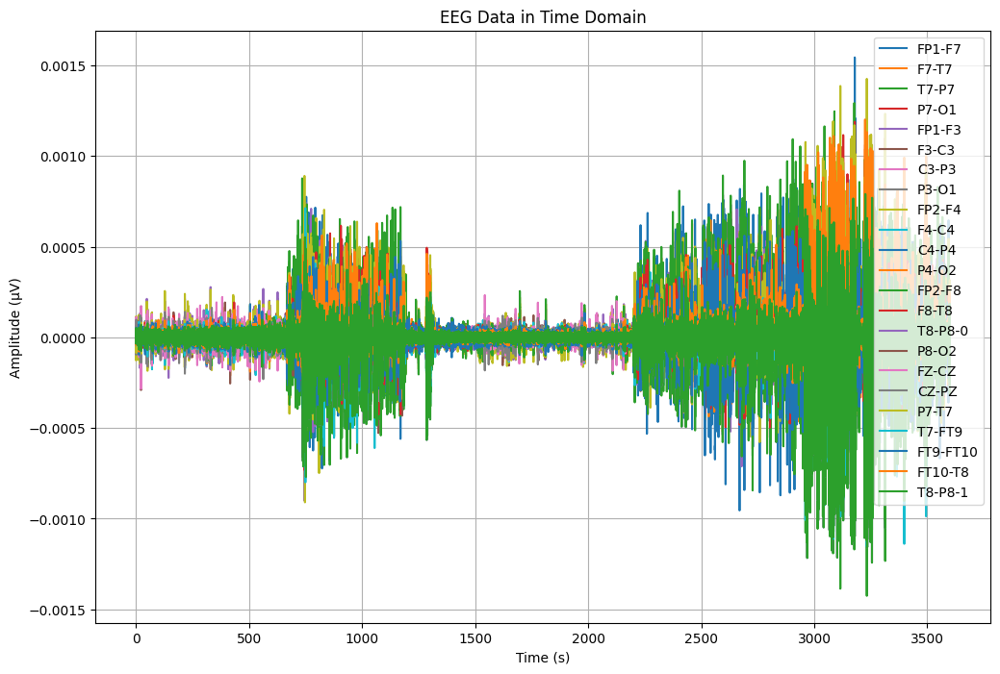

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_02.csv


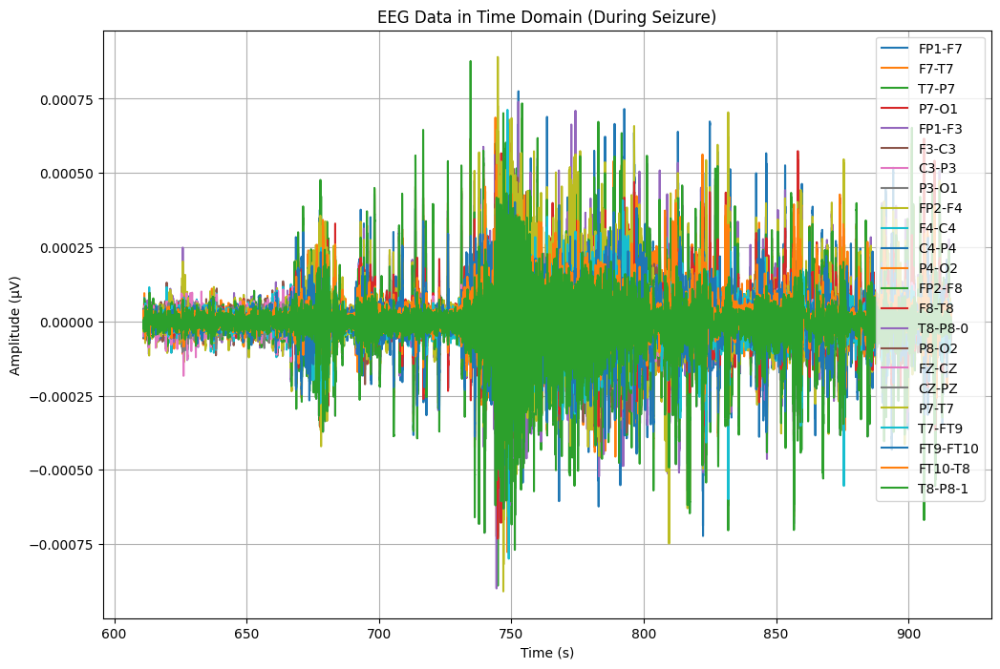

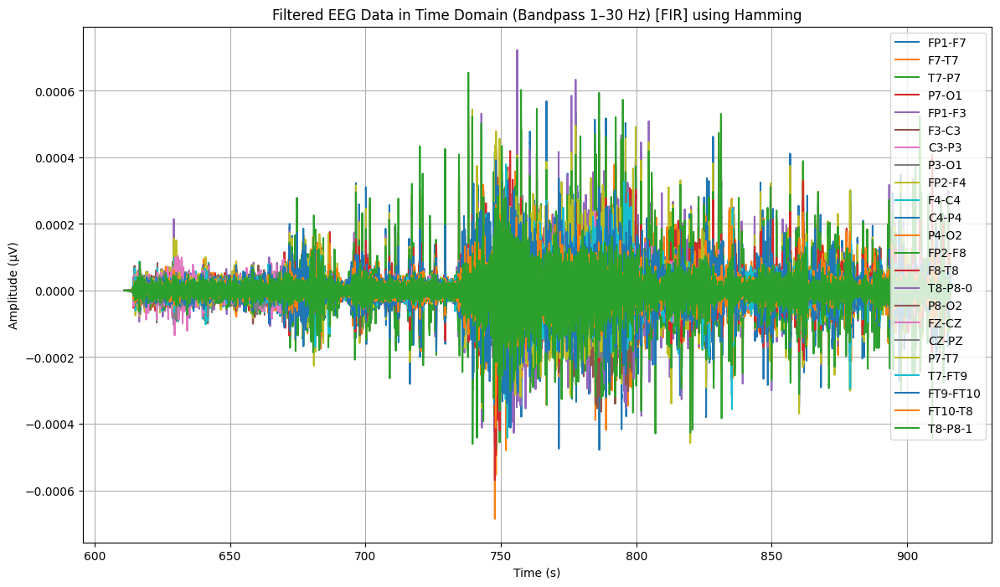

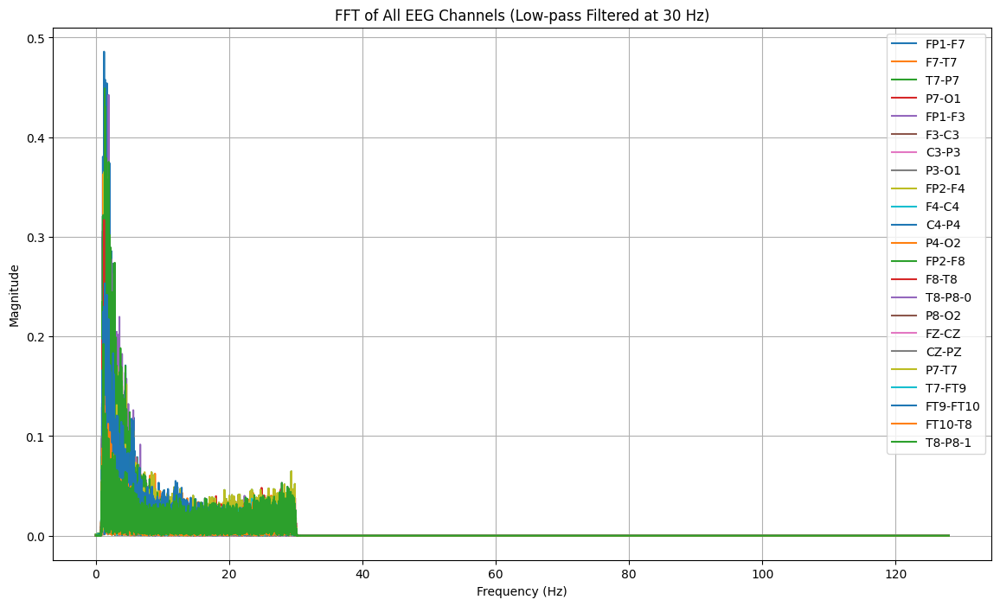

         Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  611.000000  tidak kejang -1.074958e-10  1.669769e-09 -8.098020e-10   
1  611.003906  tidak kejang  1.507140e-11  2.294193e-09 -1.239476e-09   
2  611.007812  tidak kejang  1.559203e-10  2.159385e-09 -1.418745e-09   
3  611.011719  tidak kejang  2.434883e-10  1.829533e-09 -1.440402e-09   
4  611.015625  tidak kejang  3.651752e-10  1.738190e-09 -1.467639e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -2.221581e-10 -1.368780e-09  1.641103e-09  2.938220e-10 -9.316306e-11  ...   
1 -3.959692e-10 -1.983807e-09  2.438673e-09  1.279316e-10 -2.133679e-11  ...   
2 -5.344144e-10 -1.935064e-09  2.376387e-09 -1.515816e-10  2.089617e-11  ...   
3 -5.892088e-10 -1.591341e-09  2.010339e-09 -2.676438e-10 -9.748826e-11  ...   
4 -6.053122e-10 -1.591205e-09  2.077920e-09 -2.814089e-10 -1.389510e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0  1.

In [ ]:
file12 = "/content/drive/MyDrive/TA/EDF/chb03_02.edf"
data12 = mne.io.read_raw_edf(file12)
data12

data, times = data12.get_data(return_times=True)
channel_names = data12.ch_names

df12 = pd.DataFrame(data.T, columns=channel_names)
df12['Time'] = times
df12.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df12['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df12[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 611
end_time_seconds = 916

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df12.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_02.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA12 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_02.csv")
TA12.head()

time = TA12['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA12.columns:
        plt.plot(time, TA12[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA12['Time'].values
eeg_columns = TA12.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA12[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 731:
        return "tidak kejang"
    elif 731 <= row['Time'] < 796:
        return "kejang"
    else:
        return "tidak kejang"

TA_12 = filtered_df.copy()
TA_12['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_12[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_12.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_02.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_12.drop(['Time', 'seizure'], axis=1)
y = TA_12['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-41-31578fe7d42a>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data13 = mne.io.read_raw_edf(file13)


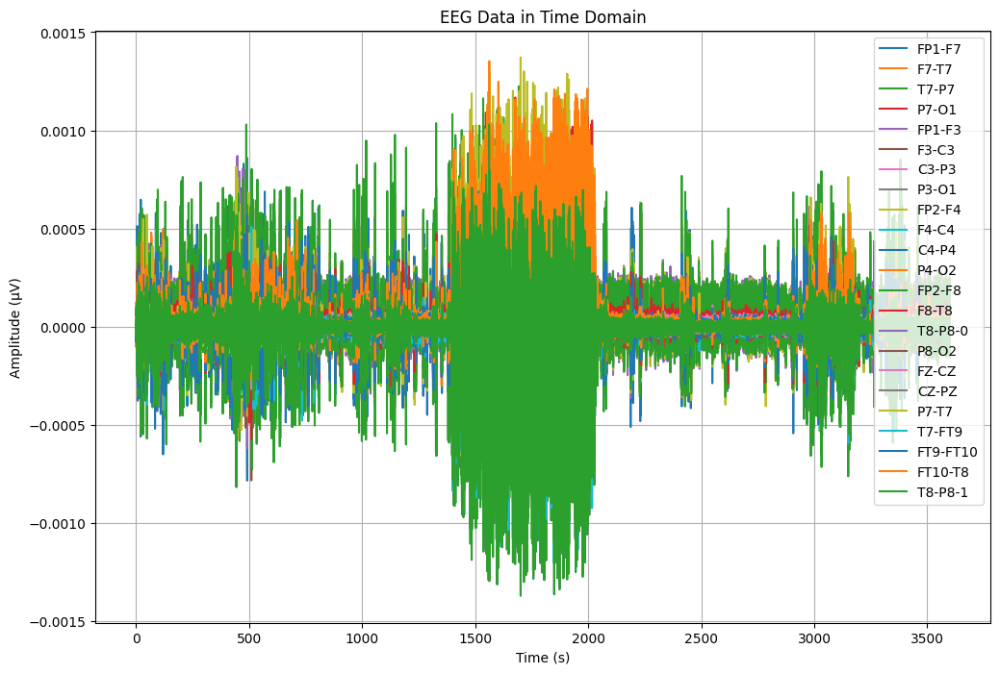

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_03.csv


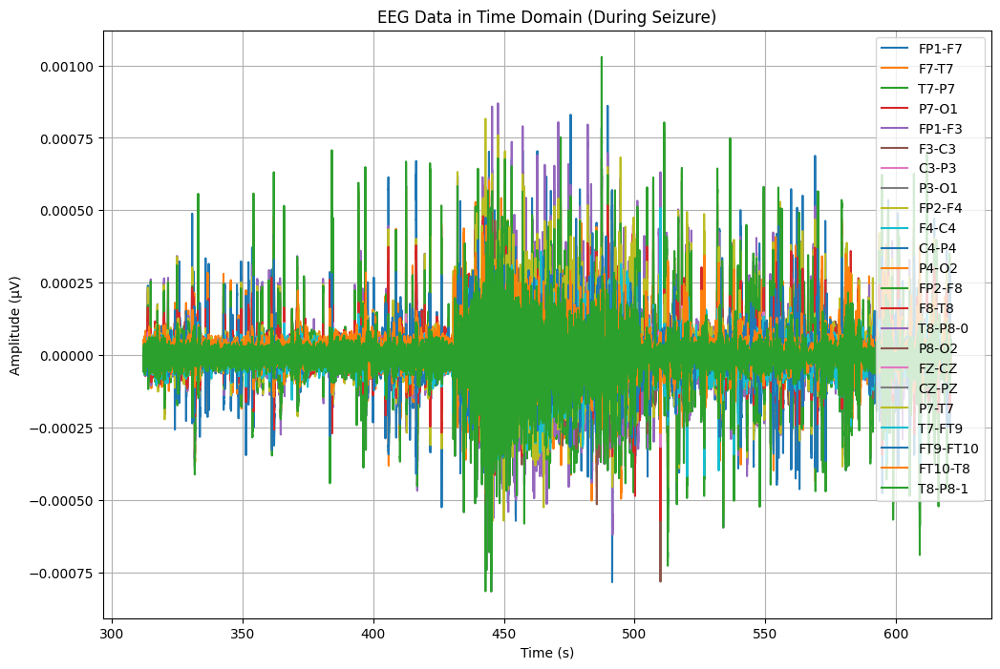

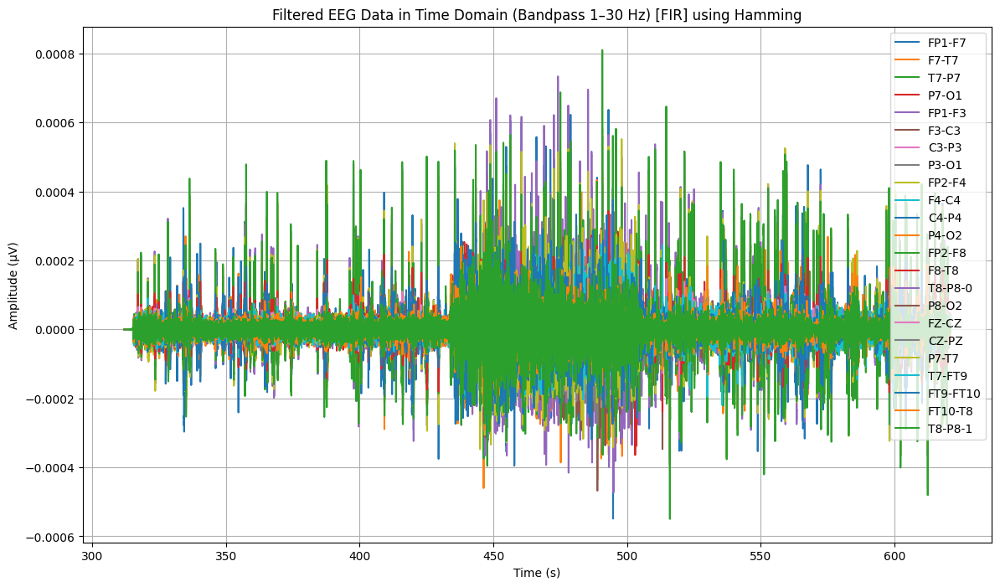

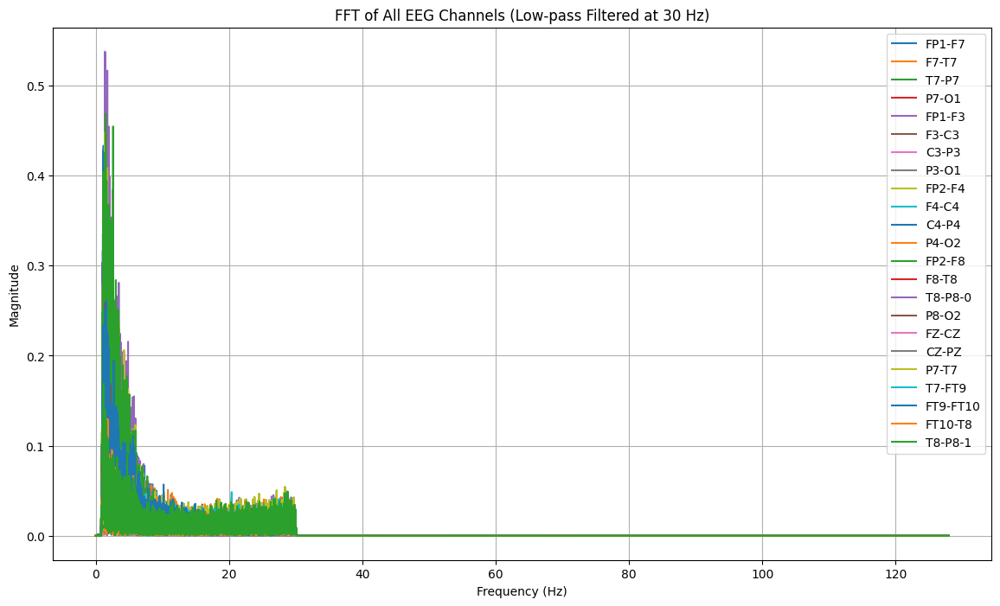

         Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  312.000000  tidak kejang  2.149917e-11  1.082125e-09 -4.944808e-10   
1  312.003906  tidak kejang  5.616972e-10  3.757275e-10  3.387847e-10   
2  312.007812  tidak kejang  1.492619e-09 -9.964709e-10  1.577833e-09   
3  312.011719  tidak kejang  2.011324e-09 -1.027097e-09  1.585255e-09   
4  312.015625  tidak kejang  8.452840e-10  5.638565e-10  2.102233e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -7.166389e-12 -5.088136e-10  1.039126e-09  5.016472e-11 -2.149917e-11  ...   
1  6.120243e-11 -4.561083e-10  1.674573e-09  3.023190e-11  4.027950e-11  ...   
2  1.087817e-10  9.723091e-10  1.159537e-09  2.272409e-11 -2.621200e-11  ...   
3  5.677047e-11  2.053773e-09  6.293081e-10  4.794441e-11 -1.419029e-10  ...   
4 -8.728583e-11  1.057797e-09  5.731829e-10  1.265032e-11 -1.156316e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \
0  7.

In [ ]:
file13 = "/content/drive/MyDrive/TA/EDF/chb03_03.edf"
data13 = mne.io.read_raw_edf(file13)
data13

data, times = data13.get_data(return_times=True)
channel_names = data13.ch_names

df13 = pd.DataFrame(data.T, columns=channel_names)
df13['Time'] = times
df13.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df13['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df13[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 312
end_time_seconds = 621

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df13.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_03.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA13 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_03.csv")
TA13.head()

time = TA13['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA13.columns:
        plt.plot(time, TA13[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA13['Time'].values
eeg_columns = TA13.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA13[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 432:
        return "tidak kejang"
    elif 432 <= row['Time'] < 501:
        return "kejang"
    else:
        return "tidak kejang"

TA_13 = filtered_df.copy()
TA_13['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_13[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_13.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_03.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_13.drop(['Time', 'seizure'], axis=1)
y = TA_13['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_04.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-42-fcf820950a76>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data14 = mne.io.read_raw_edf(file14)


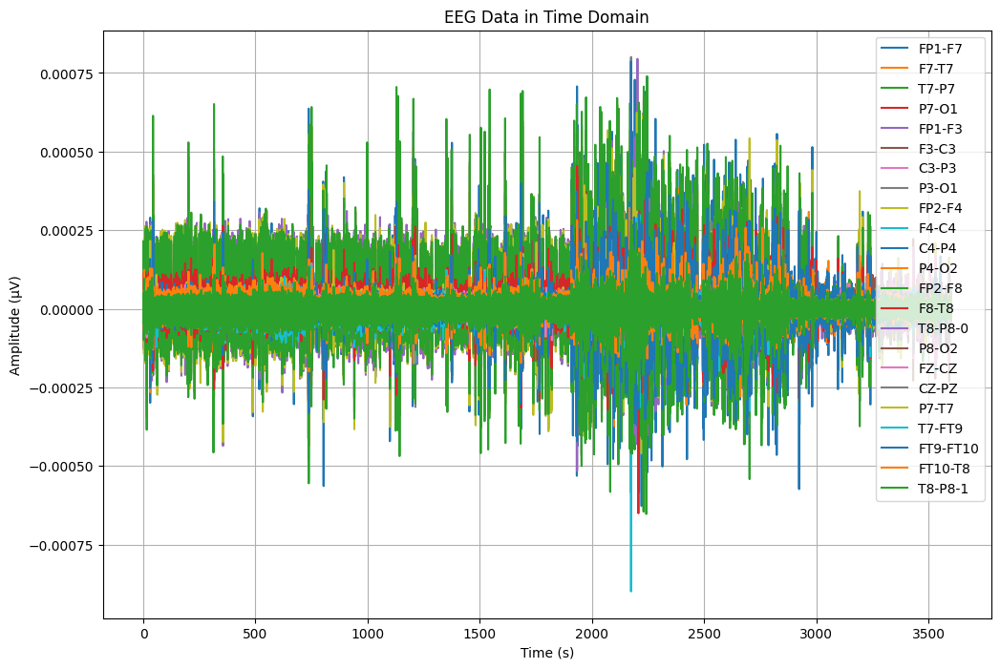

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_04.csv


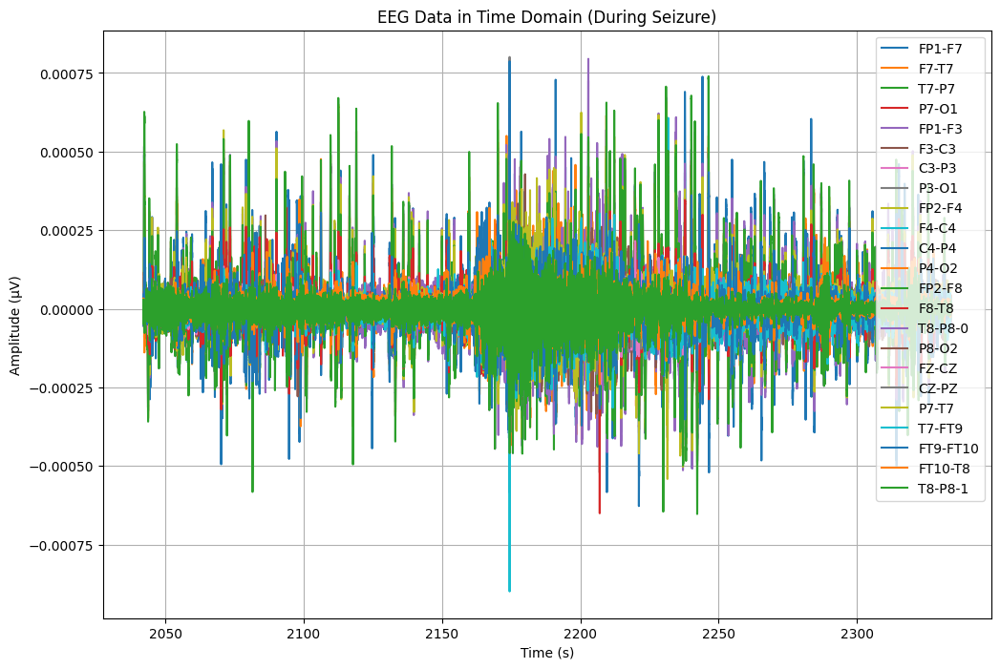

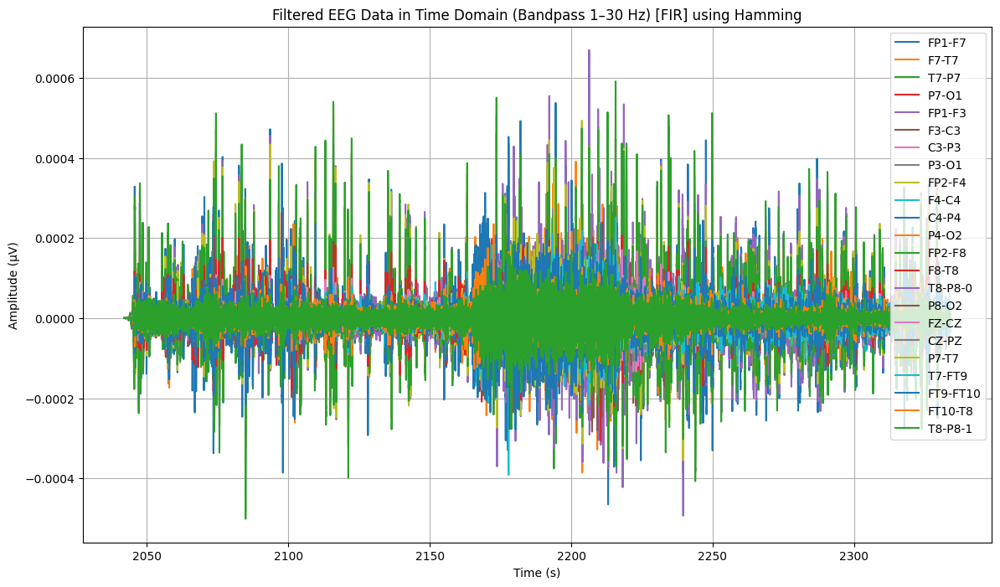

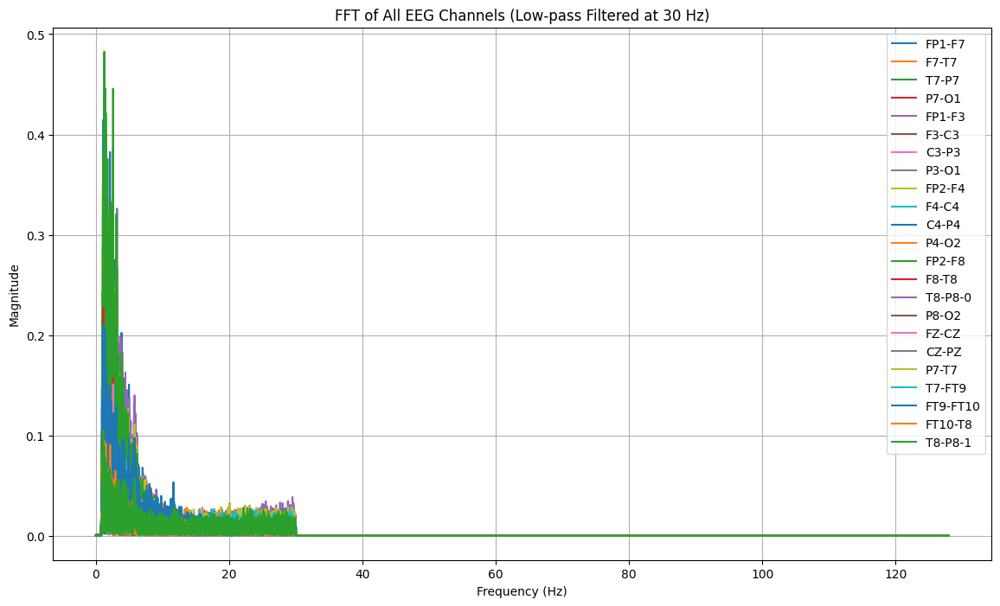

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  2042.000000  tidak kejang -2.794892e-10  9.531297e-10  3.798186e-10   
1  2042.003906  tidak kejang -5.513248e-10  1.377042e-09  1.027439e-09   
2  2042.007812  tidak kejang -5.340287e-10  1.617774e-09  8.422550e-10   
3  2042.011719  tidak kejang -3.720347e-10  1.282125e-09  2.687299e-10   
4  2042.015625  tidak kejang -1.248052e-10  1.048493e-09  2.210751e-11   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  2.794892e-10  7.238053e-10  3.941514e-10  1.218286e-10  2.149917e-11  ...   
1  1.643398e-10  9.849438e-10  5.467149e-10  2.208432e-10  1.603794e-10  ...   
2 -2.224707e-12  8.934582e-10  5.889330e-10  1.925878e-10  1.328068e-10  ...   
3 -1.494015e-10  7.128367e-10  3.726148e-10  1.336699e-11 -1.607759e-10  ...   
4 -5.530988e-11  7.498245e-10  2.412837e-10 -5.593064e-11 -1.279233e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file14 = "/content/drive/MyDrive/TA/EDF/chb03_04.edf"
data14 = mne.io.read_raw_edf(file14)
data14

data, times = data14.get_data(return_times=True)
channel_names = data14.ch_names

df14 = pd.DataFrame(data.T, columns=channel_names)
df14['Time'] = times
df14.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df14['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df14[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 2042
end_time_seconds = 2334

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df14.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_04.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA14 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_04.csv")
TA14.head()

time = TA14['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA14.columns:
        plt.plot(time, TA14[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA14['Time'].values
eeg_columns = TA14.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA14[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 2162:
        return "tidak kejang"
    elif 2162 <= row['Time'] < 2214:
        return "kejang"
    else:
        return "tidak kejang"

TA_14 = filtered_df.copy()
TA_14['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_14[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_14.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_04.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_14.drop(['Time', 'seizure'], axis=1)
y = TA_14['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_34.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-43-bb9e06b205c0>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data15 = mne.io.read_raw_edf(file15)


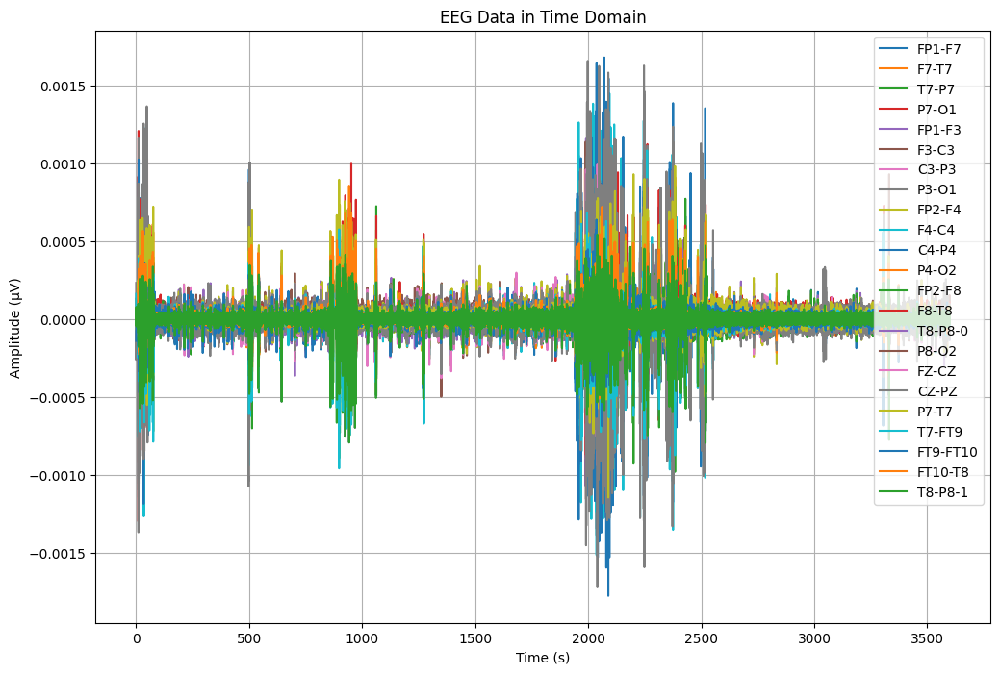

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_34.csv


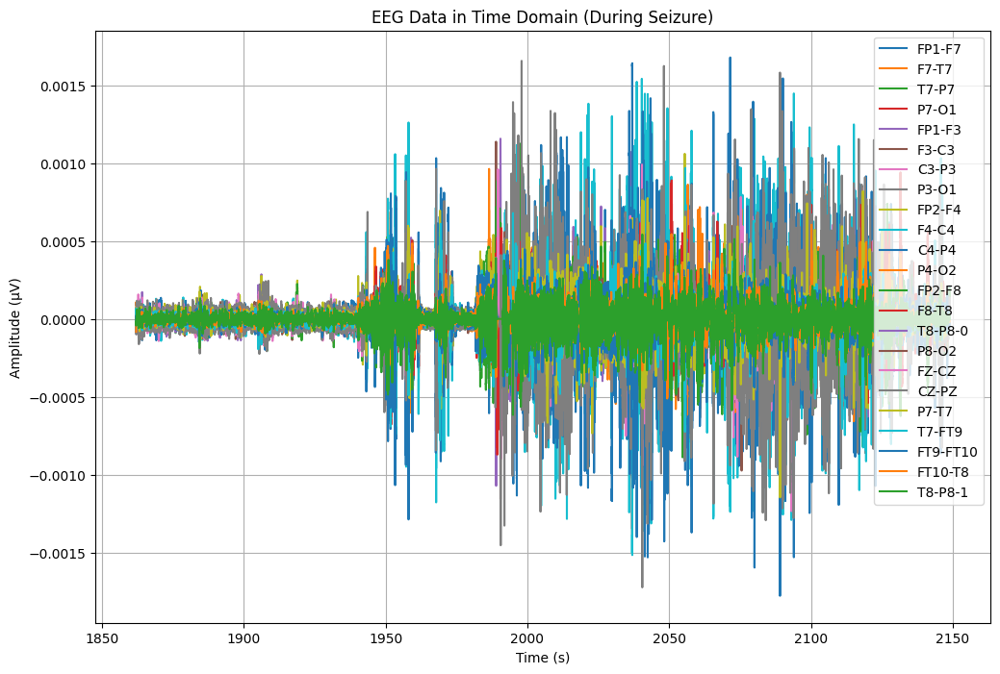

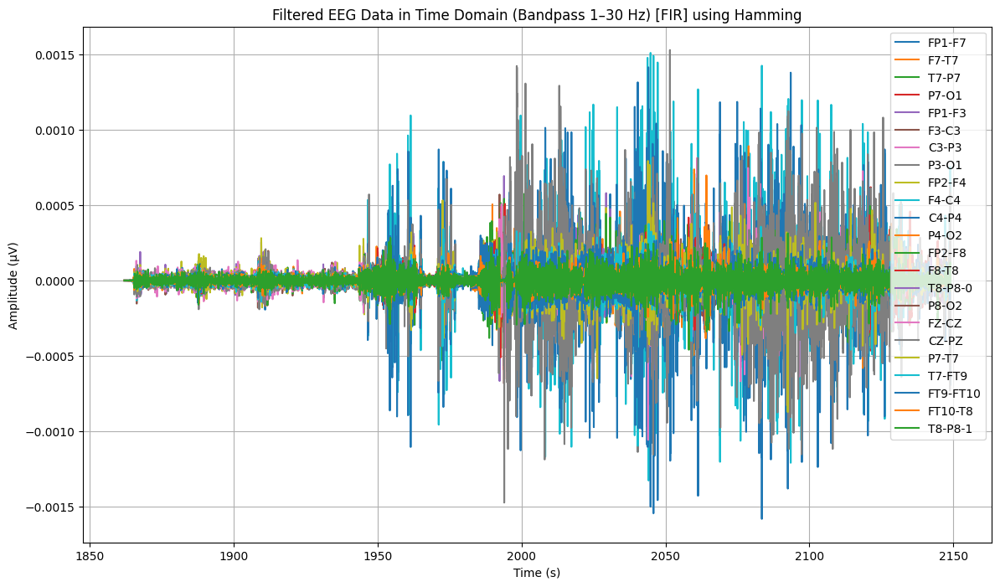

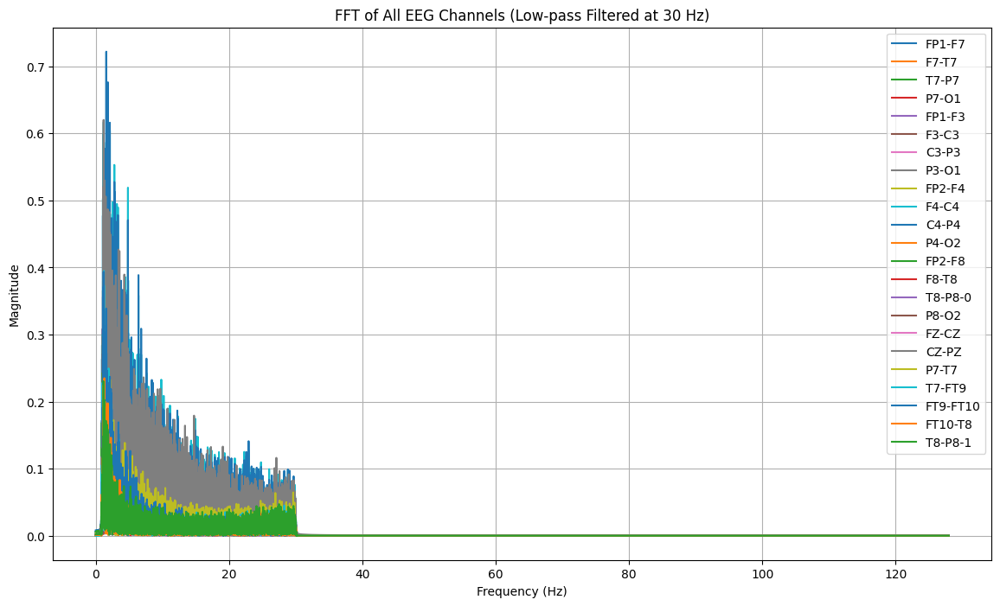

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1862.000000  tidak kejang -9.961281e-10  5.374792e-10  1.641103e-09   
1  1862.003906  tidak kejang -1.210486e-09  9.422702e-10  2.324011e-09   
2  1862.007812  tidak kejang -6.273630e-10  1.092911e-09  2.123007e-09   
3  1862.011719  tidak kejang -1.765391e-10  1.020335e-09  1.865478e-09   
4  1862.015625  tidak kejang -1.534076e-10  6.917863e-10  1.886175e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  6.091431e-10  1.741433e-09  1.884760e-09  2.364908e-10 -2.085419e-09  ...   
1  9.608882e-10  2.886122e-09  2.980689e-09  2.162333e-10 -3.087284e-09  ...   
2  1.011700e-09  3.545733e-09  3.094350e-09  4.683322e-11 -3.106992e-09  ...   
3  7.991114e-10  3.628832e-09  2.680716e-09 -4.964935e-11 -2.768470e-09  ...   
4  1.005058e-09  3.756138e-09  2.411512e-09 -4.698627e-11 -2.664818e-09  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file15 = "/content/drive/MyDrive/TA/EDF/chb03_34.edf"
data15 = mne.io.read_raw_edf(file15)
data15

data, times = data15.get_data(return_times=True)
channel_names = data15.ch_names

df15 = pd.DataFrame(data.T, columns=channel_names)
df15['Time'] = times
df15.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df15['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df15[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1862
end_time_seconds = 2149

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df15.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_34.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA15 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_34.csv")
TA15.head()

time = TA15['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA15.columns:
        plt.plot(time, TA15[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA15['Time'].values
eeg_columns = TA15.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA15[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1982:
        return "tidak kejang"
    elif 1982 <= row['Time'] < 2029:
        return "kejang"
    else:
        return "tidak kejang"

TA_15 = filtered_df.copy()
TA_15['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_15[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_15.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_34.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_15.drop(['Time', 'seizure'], axis=1)
y = TA_15['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_35.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-44-5a62df7af6f3>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data16 = mne.io.read_raw_edf(file16)


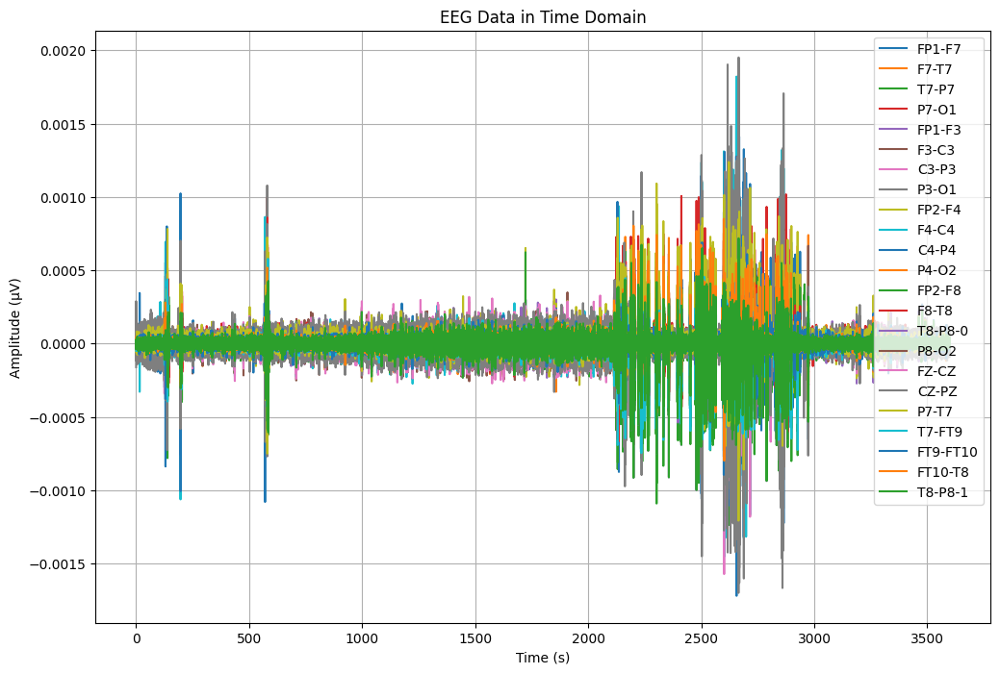

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_35.csv


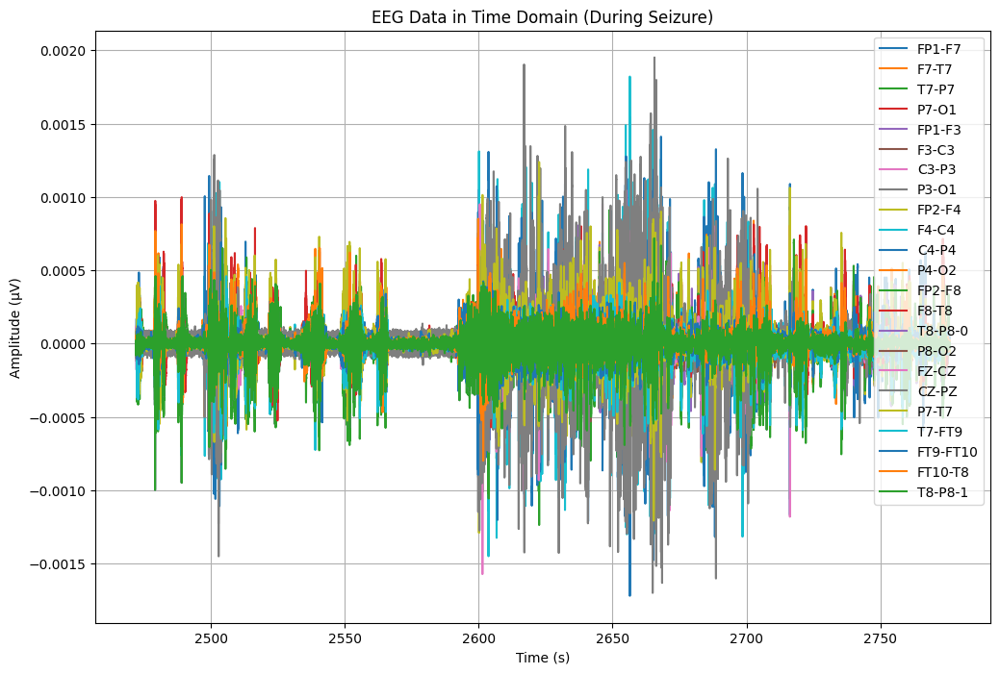

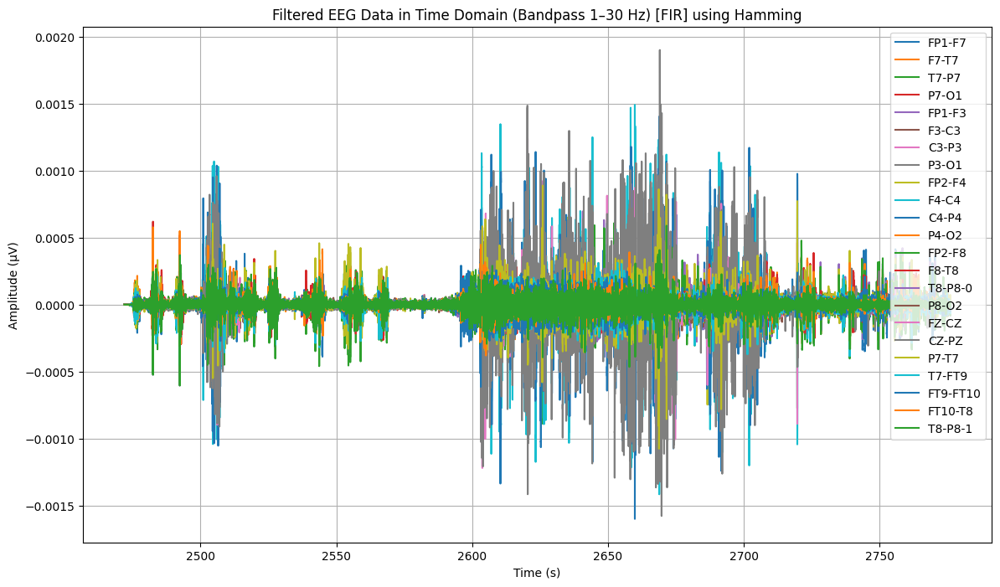

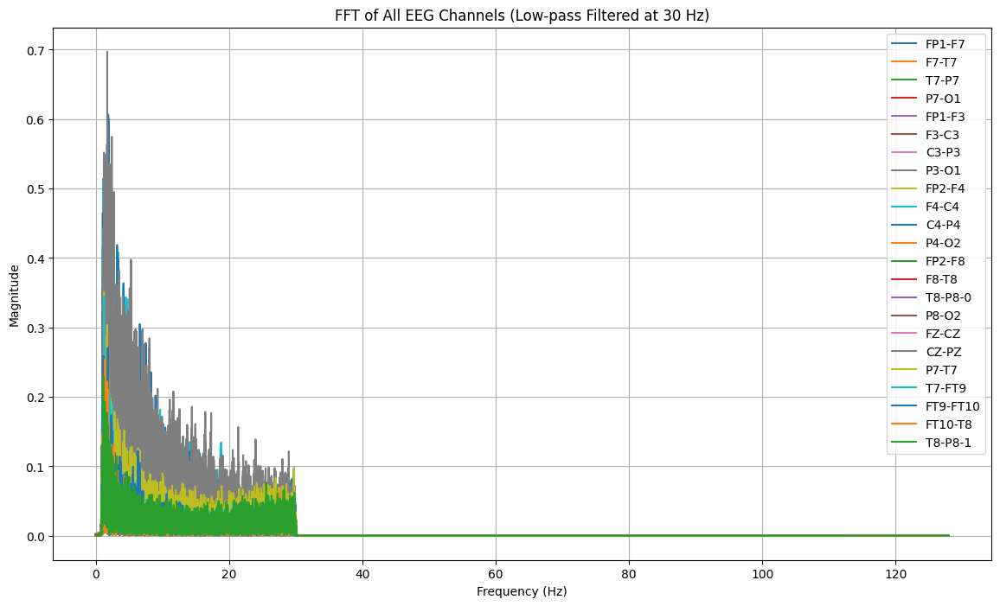

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  2472.000000  tidak kejang -7.094725e-10  8.241347e-10  1.504942e-10   
1  2472.003906  tidak kejang -4.623737e-10  7.444193e-10  4.699039e-12   
2  2472.007812  tidak kejang -1.121589e-10  3.848628e-10  1.429862e-11   
3  2472.011719  tidak kejang  3.155572e-10 -1.869362e-10  8.346078e-11   
4  2472.015625  tidak kejang  3.207168e-10 -6.447912e-10 -5.356946e-11   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  6.449750e-11 -1.361614e-10  3.511531e-10  1.934925e-10 -7.883028e-11  ...   
1  3.091448e-10 -6.977278e-11  3.406183e-10  1.964628e-10  4.258447e-11  ...   
2  2.476749e-10  1.098197e-10  1.897144e-10  1.489371e-10  1.799973e-11  ...   
3  1.797927e-10  2.179384e-10  4.478452e-11  7.826825e-11 -1.746439e-12  ...   
4  4.203213e-10  2.585628e-11 -1.231768e-10 -6.059603e-11  2.165846e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file16 = "/content/drive/MyDrive/TA/EDF/chb03_35.edf"
data16 = mne.io.read_raw_edf(file16)
data16

data, times = data16.get_data(return_times=True)
channel_names = data16.ch_names

df16 = pd.DataFrame(data.T, columns=channel_names)
df16['Time'] = times
df16.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df16['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df16[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 2472
end_time_seconds = 2776

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df16.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_35.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA16 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_35.csv")
TA16.head()

time = TA16['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA16.columns:
        plt.plot(time, TA16[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA16['Time'].values
eeg_columns = TA16.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA16[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 2592:
        return "tidak kejang"
    elif 2592 <= row['Time'] < 2656:
        return "kejang"
    else:
        return "tidak kejang"

TA_16 = filtered_df.copy()
TA_16['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_16[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_16.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_35.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_16.drop(['Time', 'seizure'], axis=1)
y = TA_16['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb03_36.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-45-cedccb1e38b4>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data17 = mne.io.read_raw_edf(file17)


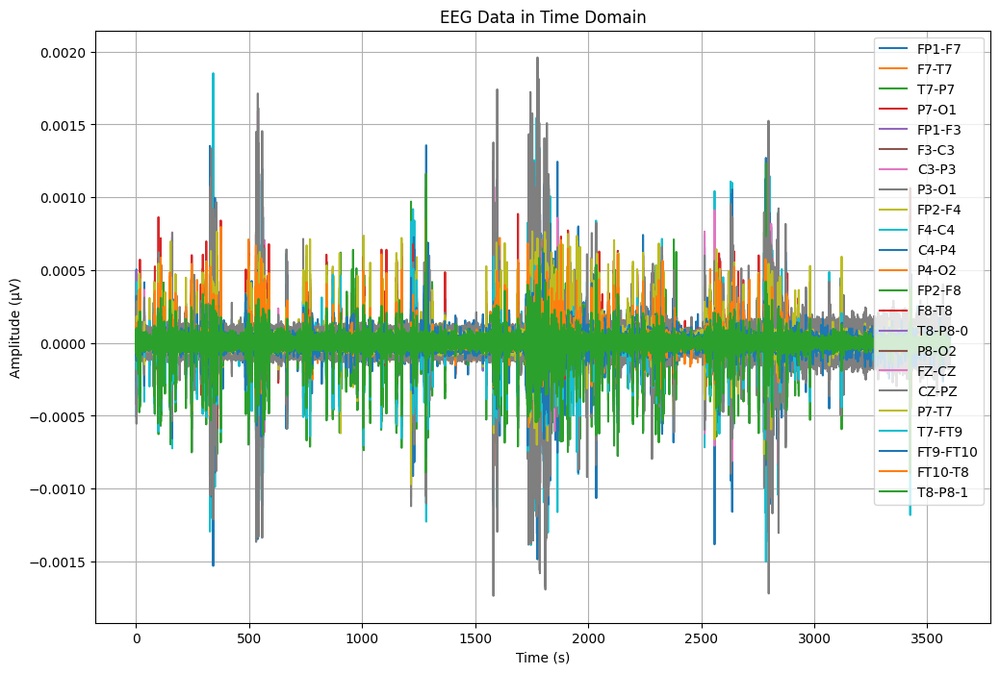

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb03_36.csv


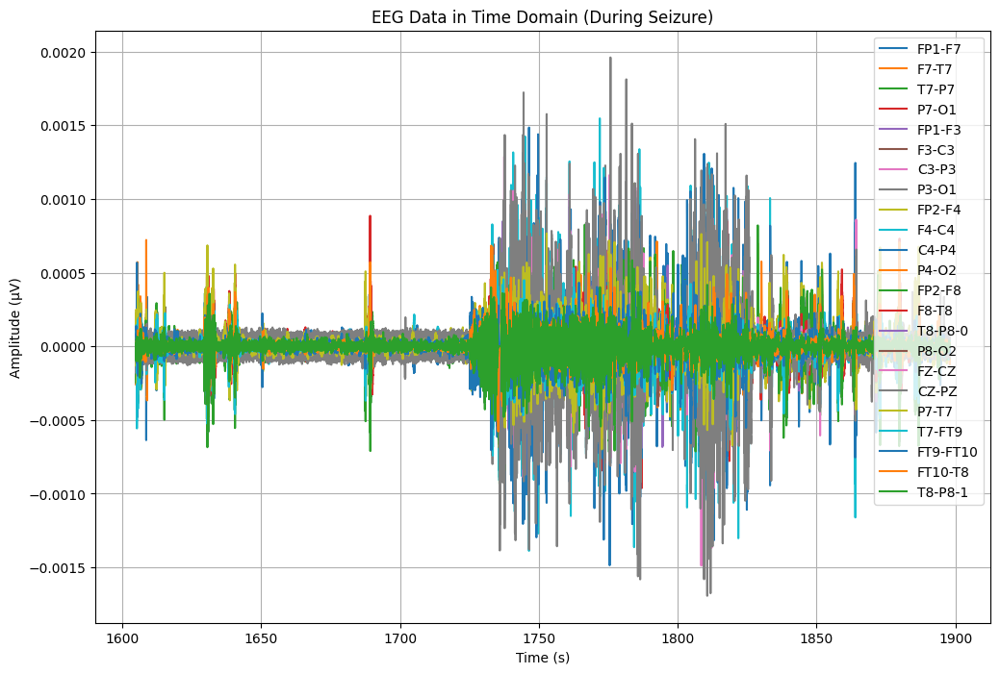

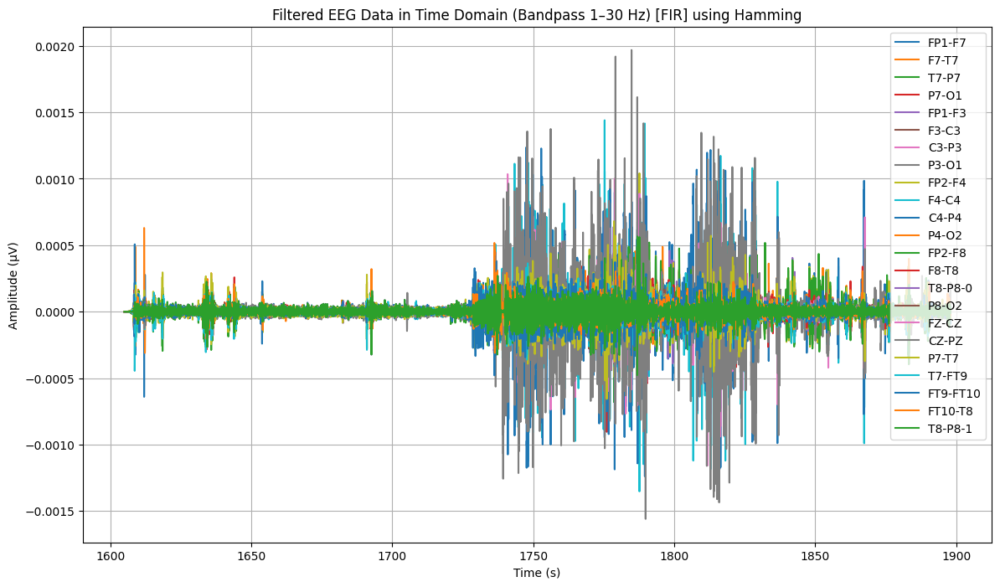

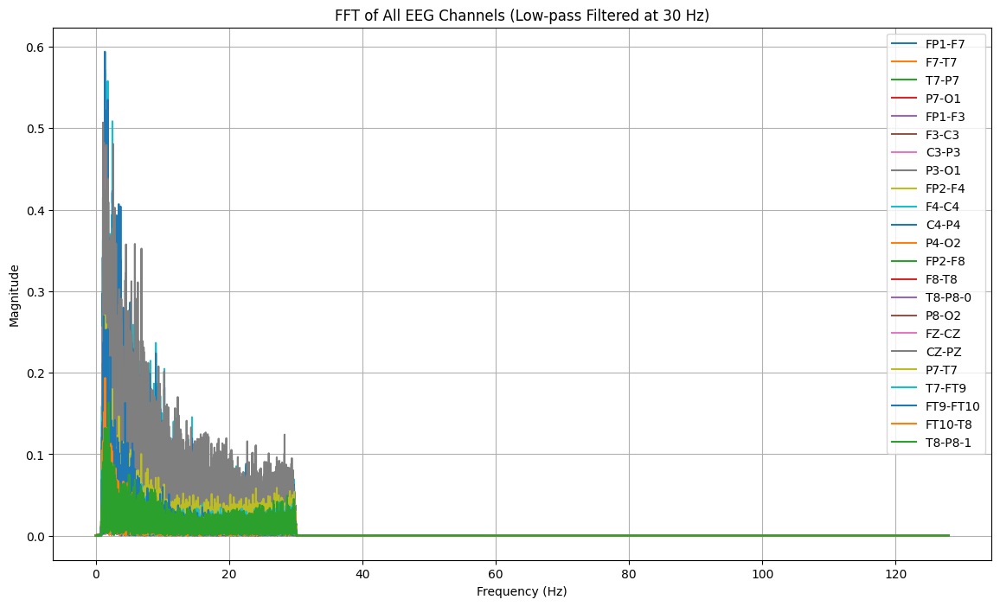

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1605.000000  tidak kejang  2.601399e-09  2.271745e-09  3.518697e-09   
1  1605.003906  tidak kejang  1.074283e-09  1.065467e-08 -3.276763e-09   
2  1605.007812  tidak kejang -1.202495e-09  1.111152e-08 -3.922182e-09   
3  1605.011719  tidak kejang  4.555929e-10  6.496038e-09 -2.295699e-09   
4  1605.015625  tidak kejang  3.962735e-09  1.421068e-09 -1.663262e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0 -1.884760e-09  4.020344e-09 -1.010461e-09  1.655436e-09  1.813096e-09  ...   
1 -1.547411e-09  5.668222e-09 -4.011968e-09  2.588591e-09  2.560753e-09  ...   
2 -1.231382e-09  4.578751e-09 -4.420086e-09  2.054712e-09  2.446391e-09  ...   
3 -1.555648e-09  2.298035e-09 -4.091992e-09  2.769080e-09  2.109097e-09  ...   
4  4.258262e-11  7.086971e-10 -2.909267e-09  2.437573e-09  3.534785e-09  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file17 = "/content/drive/MyDrive/TA/EDF/chb03_36.edf"
data17 = mne.io.read_raw_edf(file17)
data17

data, times = data17.get_data(return_times=True)
channel_names = data17.ch_names

df17 = pd.DataFrame(data.T, columns=channel_names)
df17['Time'] = times
df17.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df17['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df17[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1605
end_time_seconds = 1898

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df17.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb03_36.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA17 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb03_36.csv")
TA17.head()

time = TA17['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA17.columns:
        plt.plot(time, TA17[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA17['Time'].values
eeg_columns = TA17.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA17[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1725:
        return "tidak kejang"
    elif 1725 <= row['Time'] < 1778:
        return "kejang"
    else:
        return "tidak kejang"

TA_17 = filtered_df.copy()
TA_17['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_17[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_17.to_csv("/content/drive/MyDrive/TA/FILTERING/chb03_36.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_17.drop(['Time', 'seizure'], axis=1)
y = TA_17['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb04_05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-49-dec6c0208b78>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data18 = mne.io.read_raw_edf(file18)


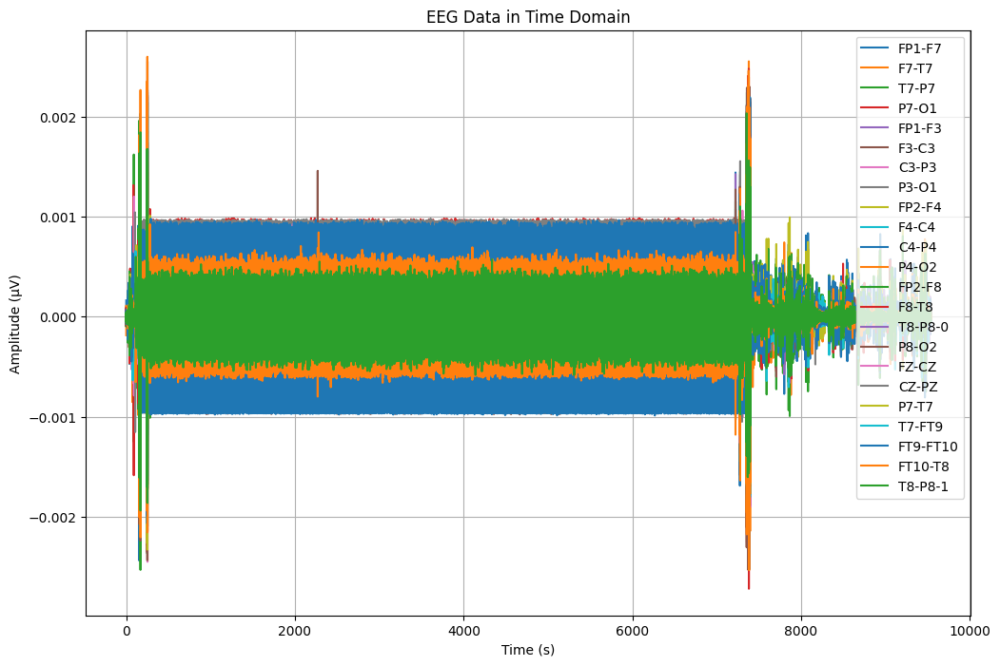

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb04_05.csv


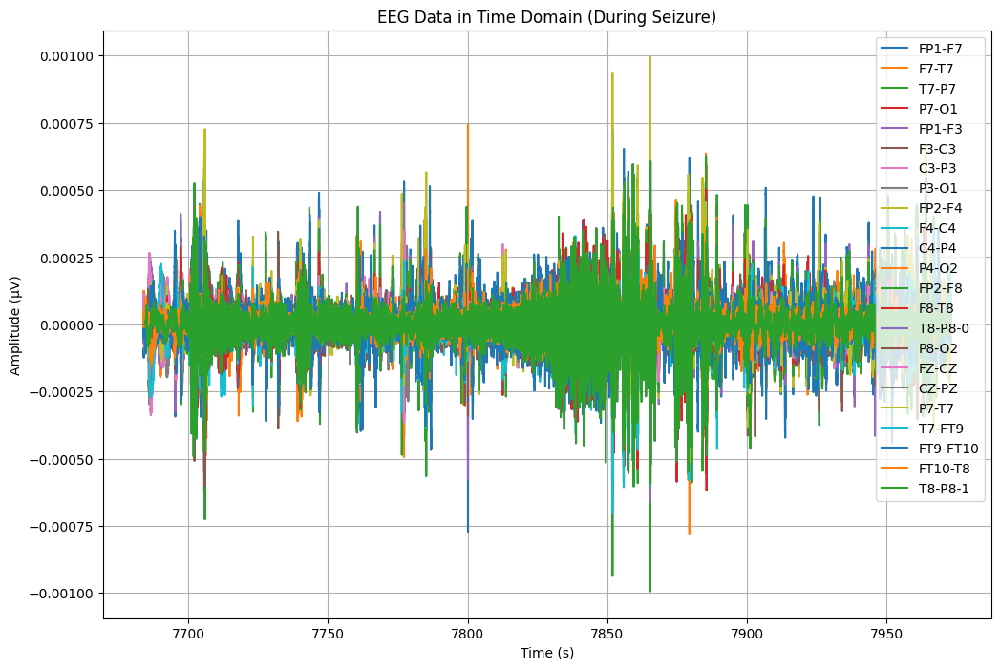

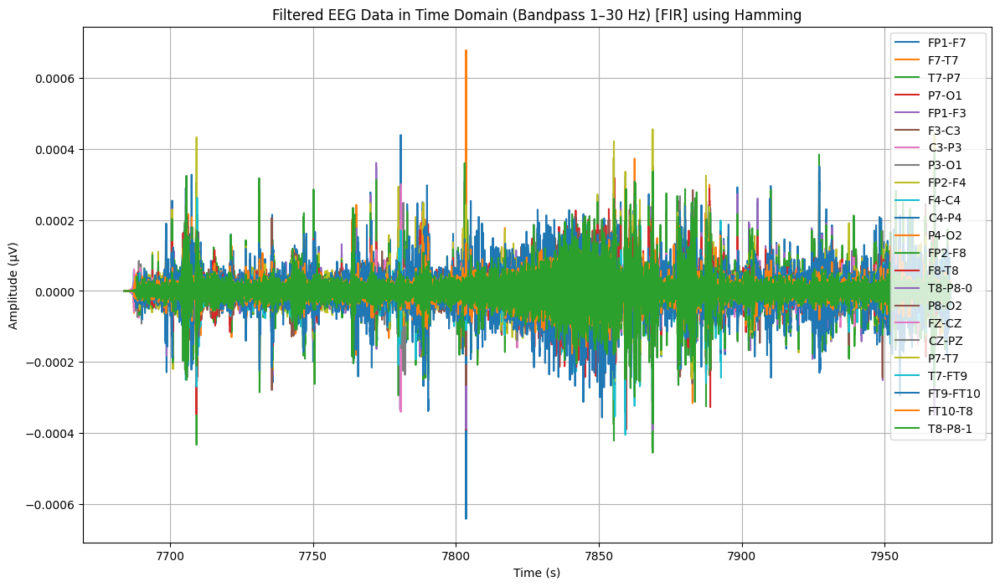

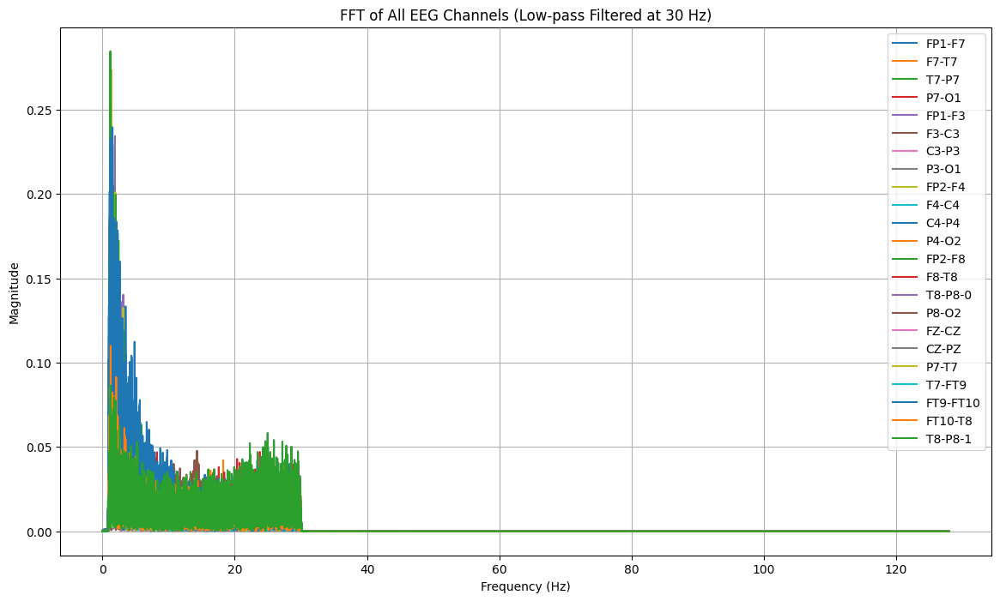

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  7684.000000  tidak kejang  3.819685e-09 -3.805353e-09  1.074958e-10   
1  7684.003906  tidak kejang  5.661956e-09 -5.641033e-09 -6.600464e-10   
2  7684.007812  tidak kejang  5.558203e-09 -5.537871e-09 -6.961341e-10   
3  7684.011719  tidak kejang  4.619014e-09 -4.616389e-09 -3.432374e-10   
4  7684.015625  tidak kejang  4.598713e-09 -4.588539e-09  2.057805e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  1.648269e-10  2.472404e-09 -2.938220e-10 -1.913426e-09  7.883028e-11  ...   
1  8.425903e-10  3.465877e-09 -2.569266e-10 -2.836209e-09 -9.991559e-11  ...   
2  1.198571e-09  3.584602e-09 -3.520458e-10 -2.906013e-09  1.992969e-10  ...   
3  8.018145e-10  3.097267e-09 -2.036503e-10 -2.613420e-09  2.164743e-10  ...   
4  5.403191e-10  2.994503e-09 -2.442465e-11 -2.704375e-09  5.496272e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file18 = "/content/drive/MyDrive/TA/EDF/chb04_05.edf"
data18 = mne.io.read_raw_edf(file18)
data18

data, times = data18.get_data(return_times=True)
channel_names = data18.ch_names

df18 = pd.DataFrame(data.T, columns=channel_names)
df18['Time'] = times
df18.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df18['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df18[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 7684
end_time_seconds = 7973

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df18.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb04_05.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA18 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb04_05.csv")
TA18.head()

time = TA18['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA18.columns:
        plt.plot(time, TA18[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA18['Time'].values
eeg_columns = TA18.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA18[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 7804:
        return "tidak kejang"
    elif 7804 <= row['Time'] < 7853:
        return "kejang"
    else:
        return "tidak kejang"

TA_18 = filtered_df.copy()
TA_18['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_18[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_18.to_csv("/content/drive/MyDrive/TA/FILTERING/chb04_05.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_18.drop(['Time', 'seizure'], axis=1)
y = TA_18['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb04_08.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-3-9340aa51ab80>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data19 = mne.io.read_raw_edf(file19)


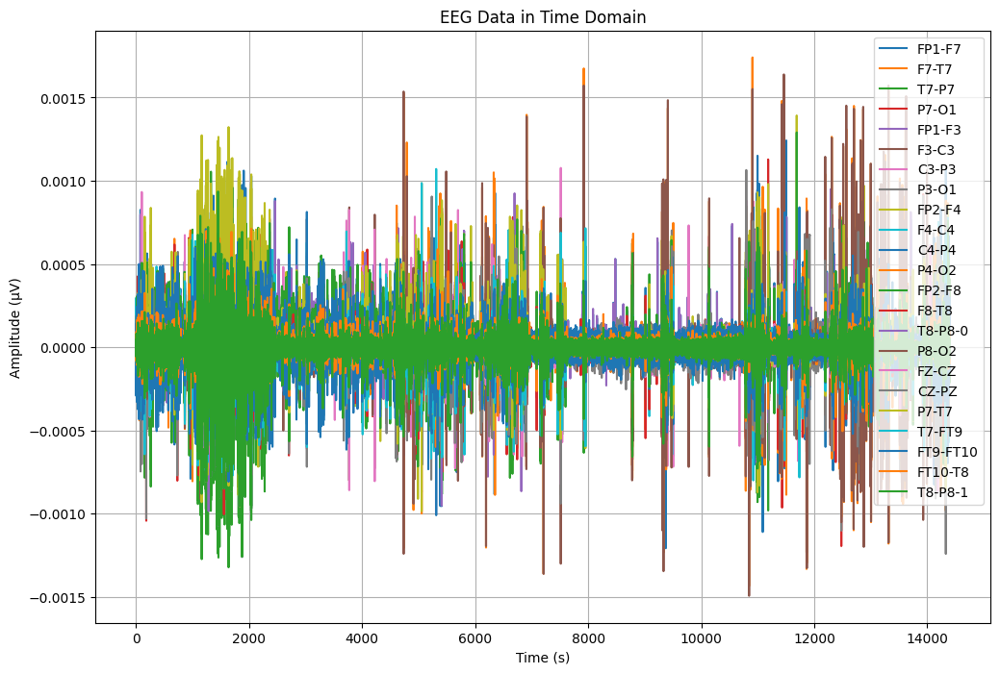

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb04_08.csv


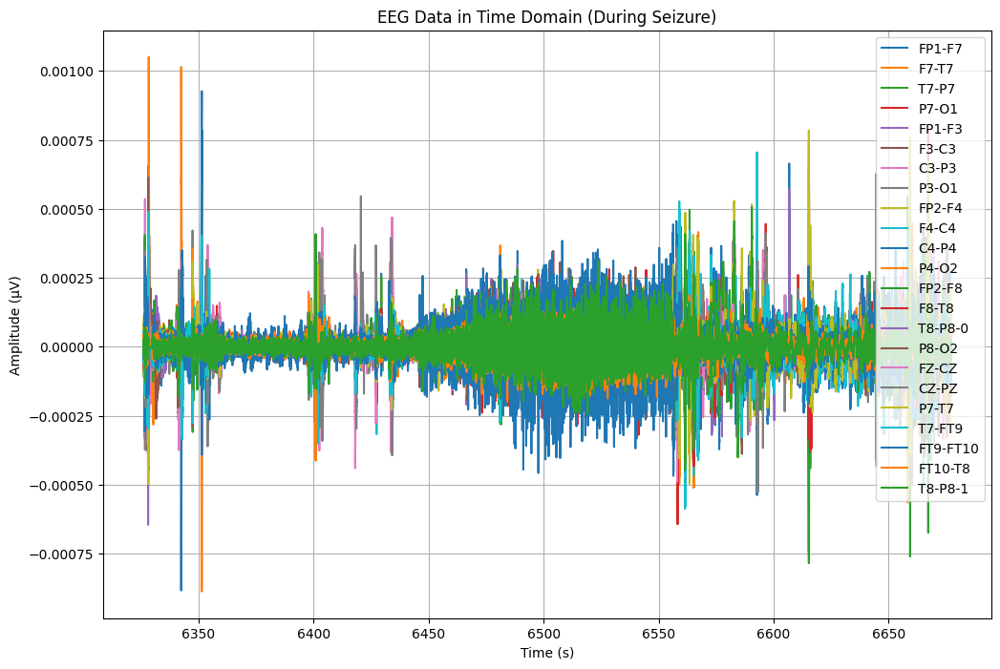

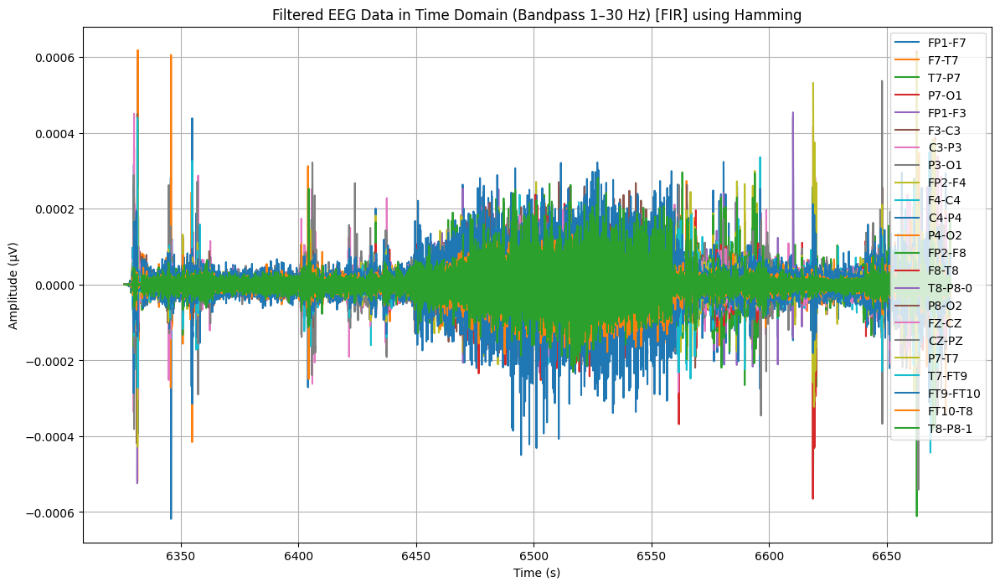

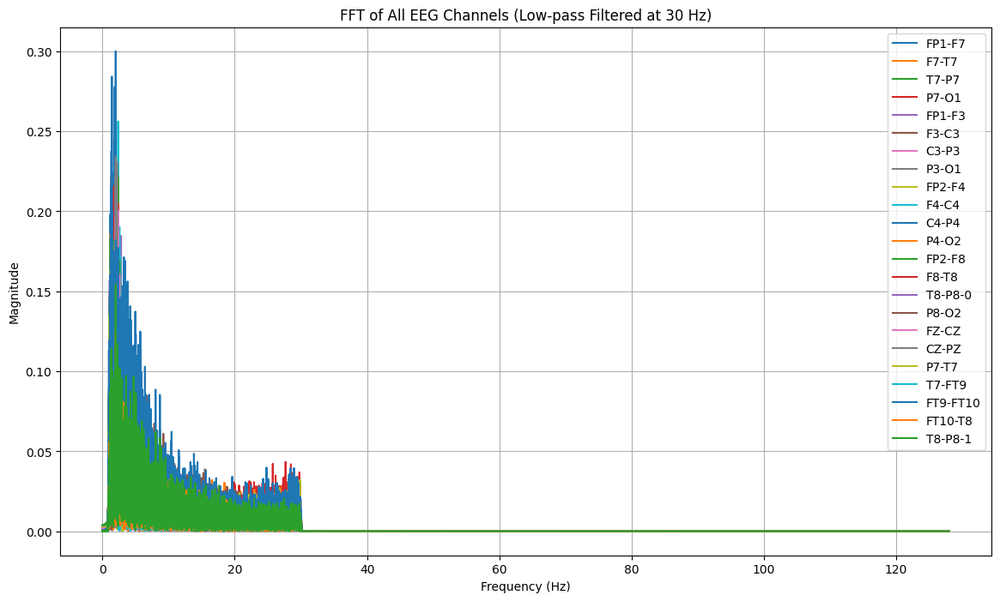

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  6326.000000  tidak kejang -1.934925e-10  1.361614e-10  1.074958e-10   
1  6326.003906  tidak kejang -2.107956e-10  1.488718e-09 -3.017270e-10   
2  6326.007812  tidak kejang -5.138467e-10  2.205207e-09 -2.017266e-10   
3  6326.011719  tidak kejang -1.707666e-10  2.795540e-09 -9.374225e-10   
4  6326.015625  tidak kejang  4.413617e-10  2.768082e-09 -1.905212e-09   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  4.514825e-10  3.368203e-10  3.368203e-10  1.361614e-10 -2.938220e-10  ...   
1  1.144266e-10  5.203543e-10  5.776854e-10  1.001403e-09 -1.030897e-09  ...   
2 -1.116320e-10  4.049728e-10  4.456662e-10  9.635148e-10 -4.929221e-10  ...   
3  5.365055e-11  3.434382e-10  2.473330e-10  6.278165e-10  4.574541e-10  ...   
4  6.377883e-10  4.271746e-10  6.596689e-11  6.147081e-10  7.797321e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file19 = "/content/drive/MyDrive/TA/EDF/chb04_08.edf"
data19 = mne.io.read_raw_edf(file19)
data19

data, times = data19.get_data(return_times=True)
channel_names = data19.ch_names

df19 = pd.DataFrame(data.T, columns=channel_names)
df19['Time'] = times
df19.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df19['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df19[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 6326
end_time_seconds = 6677

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df19.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb04_08.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA19 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb04_08.csv")
TA19.head()

time = TA19['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA19.columns:
        plt.plot(time, TA19[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA19['Time'].values
eeg_columns = TA19.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA19[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 6446:
        return "tidak kejang"
    elif 6446 <= row['Time'] < 6447:
        return "kejang"
    else:
        return "tidak kejang"

TA_19 = filtered_df.copy()
TA_19['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_19[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_19.to_csv("/content/drive/MyDrive/TA/FILTERING/chb04_08.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_19.drop(['Time', 'seizure'], axis=1)
y = TA_19['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


Extracting EDF parameters from /content/drive/MyDrive/TA/EDF/chb04_28.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


<ipython-input-4-543cd4714fc1>:2: RuntimeWarning: Channel names are not unique, found duplicates for: {'T8-P8'}. Applying running numbers for duplicates.
  data20 = mne.io.read_raw_edf(file20)


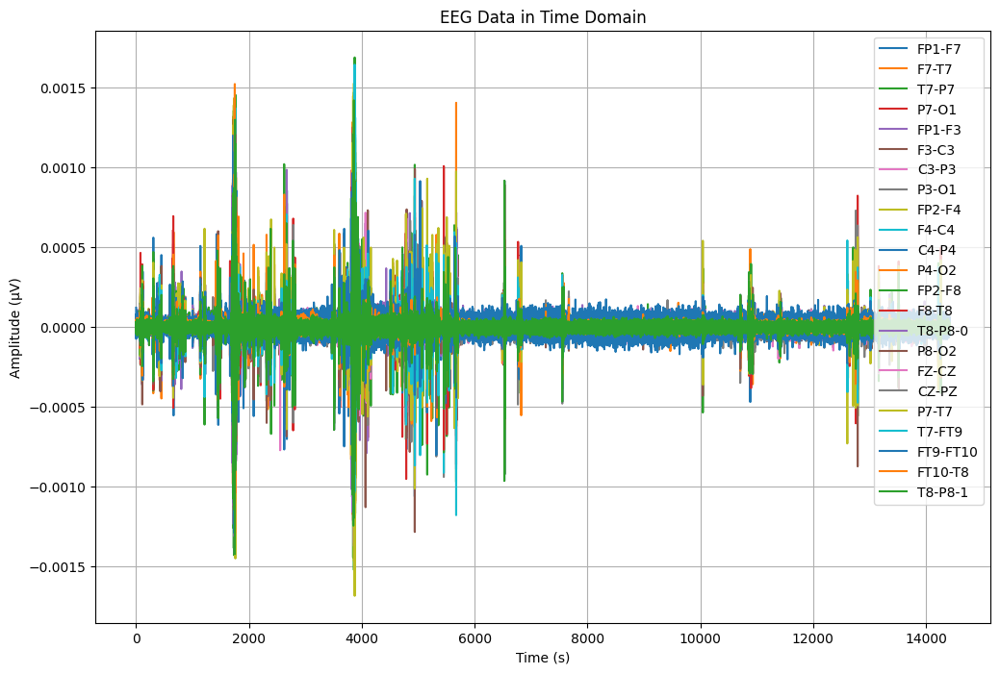

Data berhasil disimpan dalam file CSV: /content/drive/MyDrive/TA/SAMPEL/chb04_28.csv


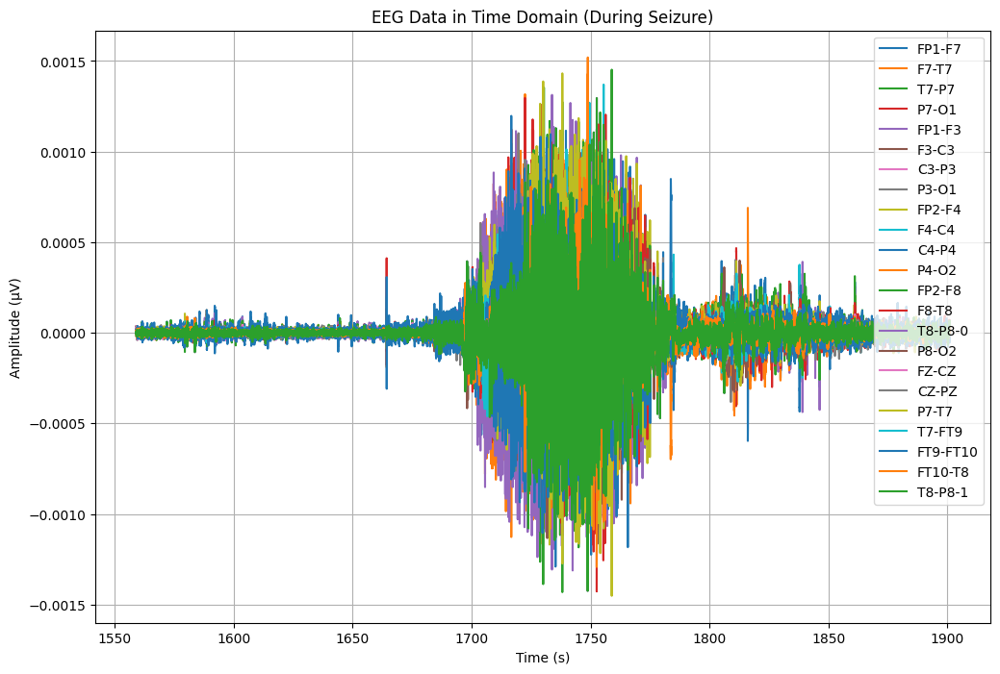

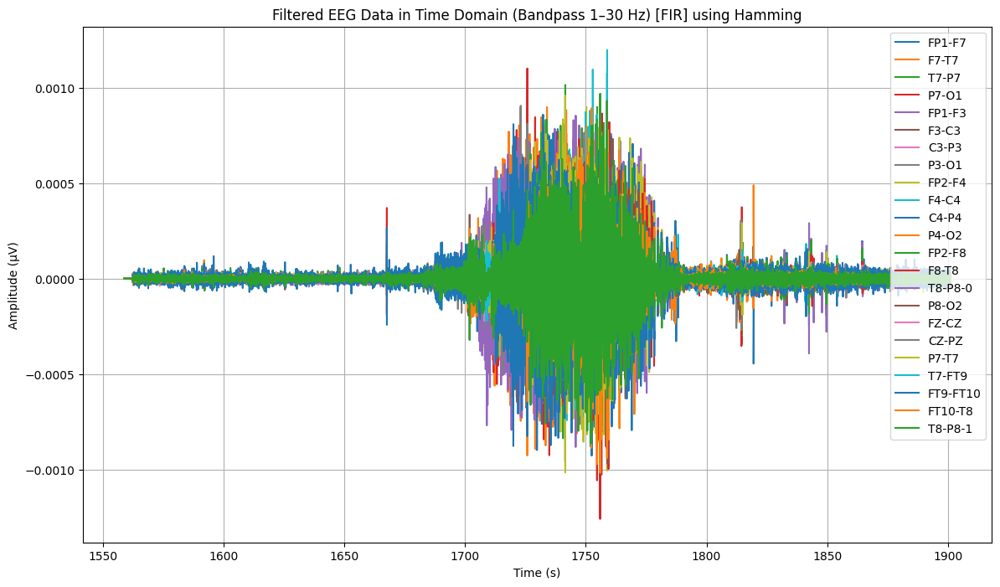

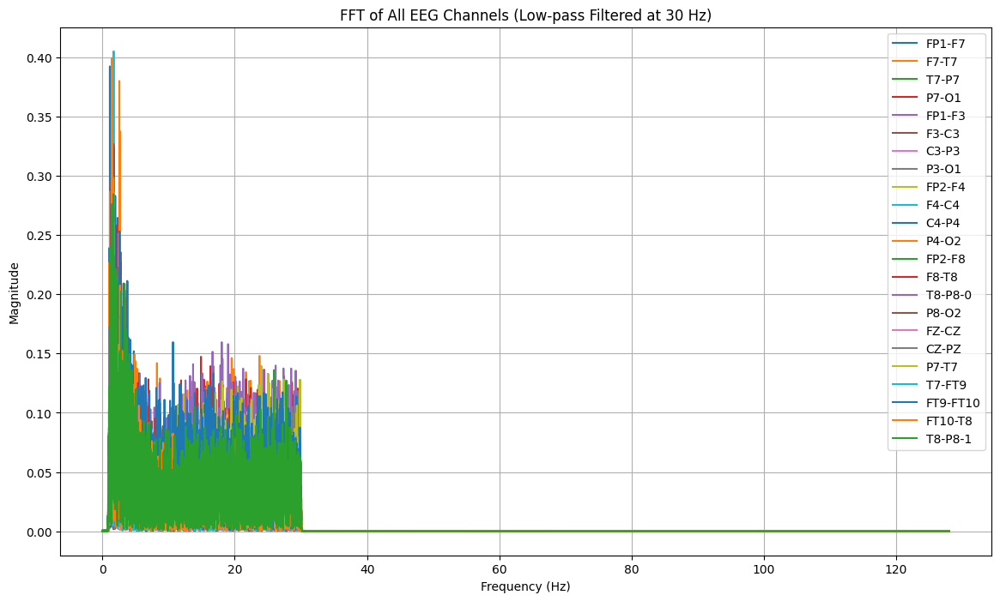

          Time       seizure        FP1-F7         F7-T7         T7-P7  \
0  1559.000000  tidak kejang -1.096458e-09 -9.961281e-10  1.934925e-10   
1  1559.003906  tidak kejang -1.356947e-09 -1.497142e-09  6.746781e-11   
2  1559.007812  tidak kejang -1.271330e-09 -1.461472e-09 -2.400281e-10   
3  1559.011719  tidak kejang -1.013209e-09 -1.017940e-09 -4.836325e-10   
4  1559.015625  tidak kejang -1.047434e-09 -8.167564e-10 -4.800612e-10   

          P7-O1        FP1-F3         F3-C3         C3-P3         P3-O1  ...  \
0  4.658153e-10 -1.340115e-09 -8.241347e-10  3.081547e-10  4.084842e-10  ...   
1  5.939984e-10 -1.812966e-09 -1.203068e-09  3.495134e-10  4.529756e-10  ...   
2  3.358747e-11 -1.749093e-09 -1.025731e-09  7.567411e-11 -2.174267e-10  ...   
3 -4.035107e-10 -1.351215e-09 -5.364867e-10 -2.922426e-10 -7.068686e-10  ...   
4 -3.576269e-10 -1.326185e-09 -2.825505e-10 -3.704890e-10 -6.706812e-10  ...   

          F8-T8       T8-P8-0         P8-O2         FZ-CZ         CZ-PZ  \

In [ ]:
file20 = "/content/drive/MyDrive/TA/EDF/chb04_28.edf"
data20 = mne.io.read_raw_edf(file20)
data20

data, times = data20.get_data(return_times=True)
channel_names = data20.ch_names

df20 = pd.DataFrame(data.T, columns=channel_names)
df20['Time'] = times
df20.head()

channels = ['FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']
time = df20['Time']

plt.figure(figsize=(12, 8))

for channel in channels:
    plt.plot(time, df20[channel], label=channel)

plt.title('EEG Data in Time Domain')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

sample_rate = 256

# Konversi waktu ke indeks data (dalam sampel)
start_time_seconds = 1559
end_time_seconds = 1901

start_index = int(start_time_seconds * sample_rate)
end_index = int(end_time_seconds * sample_rate)

df_cut = df20.iloc[start_index:end_index]

# Menyimpan ke file CSV
csv_file = "/content/drive/MyDrive/TA/SAMPEL/chb04_28.csv"
df_cut.to_csv(csv_file, index=False)

print(f"Data berhasil disimpan dalam file CSV: {csv_file}")

# import data yang sudah dipotong
TA20 = pd.read_csv("/content/drive/MyDrive/TA/SAMPEL/chb04_28.csv")
TA20.head()

time = TA20['Time']

plt.figure(figsize=(12, 8))

# Looping untuk menampilkan masing-masing saluran EEG yang dipilih
for channel in channels:
    if channel in TA20.columns:
        plt.plot(time, TA20[channel], label=channel)

plt.title('EEG Data in Time Domain (During Seizure)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

from scipy.signal import firwin, lfilter

# Fungsi untuk membuat filter band-pass menggunakan FIR
def bandpass_filter_fir(data, lowcut, highcut, sampling_rate, num_taps):
    nyquist = 0.5 * sampling_rate  # Frekuensi Nyquist
    taps = firwin(num_taps, [lowcut / nyquist, highcut / nyquist], pass_zero='bandpass', window='hamming')  # Desain koefisien filter FIR dengan Hamming window
    filtered_data = lfilter(taps, 1.0, data, axis=0)
    return filtered_data

lowcut_freq = 1
highcut_freq = 30
sampling_rate = 256
num_taps = 1735  # Panjang filter (orde + 1), nilai diperbesar untuk memastikan transisi yang lebih tajam

time = TA20['Time'].values
eeg_columns = TA20.columns[:-1]  # Semua kolom kecuali 'Time' (saluran EEG)
eeg_data = TA20[eeg_columns].values  # Data EEG

# Terapkan filter bandpass FIR pada data EEG
filtered_data = bandpass_filter_fir(eeg_data, lowcut_freq, highcut_freq, sampling_rate, num_taps)

filtered_df = pd.DataFrame(filtered_data, columns=eeg_columns)
filtered_df['Time'] = time

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:
        plt.plot(filtered_df['Time'], filtered_df[channel], label=channel)

plt.title('Filtered EEG Data in Time Domain (Bandpass 1–30 Hz) [FIR] using Hamming')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

def compute_fft(signal, sampling_rate):
    N = len(signal)  # Panjang sinyal
    T = 1.0 / sampling_rate  # Interval sampling
    fft_vals = np.fft.fft(signal)  # Menghitung FFT
    fft_freqs = np.fft.fftfreq(N, T)  # Frekuensi
    fft_vals = np.abs(fft_vals[:N // 2])  # Magnitude (frekuensi positif saja)
    fft_freqs = fft_freqs[:N // 2]  # Frekuensi positif saja
    return fft_freqs, fft_vals

sampling_rate = 256  # Misal 256 Hz

plt.figure(figsize=(14, 8))

for channel in channels:
    if channel in filtered_df.columns:  # Memastikan saluran ada dalam data
        signal = filtered_df[channel].values  # Mengambil sinyal dari saluran EEG
        fft_freqs, fft_vals = compute_fft(signal, sampling_rate)  # Menghitung FFT
        plt.plot(fft_freqs, fft_vals, label=channel)  # Menambahkan ke plot

plt.title('FFT of All EEG Channels (Low-pass Filtered at 30 Hz)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

# Fungsi untuk menentukan label kejang atau tidak
def label_seizure(row):
    if row['Time'] < 1679:
        return "tidak kejang"
    elif 1679 <= row['Time'] < 1781:
        return "kejang"
    else:
        return "tidak kejang"

TA_20 = filtered_df.copy()
TA_20['seizure'] = filtered_df.apply(label_seizure, axis=1)

print(TA_20[['Time', 'seizure', 'FP1-F7', 'F7-T7', 'T7-P7', 'P7-O1', 'FP1-F3', 'F3-C3',
           'C3-P3', 'P3-O1', 'FP2-F4', 'F4-C4', 'C4-P4', 'P4-O2', 'FP2-F8', 'F8-T8',
           'T8-P8-0', 'P8-O2', 'FZ-CZ', 'CZ-PZ', 'P7-T7', 'T7-FT9', 'FT9-FT10', 'FT10-T8', 'T8-P8-1']].head())

# Simpan data yang sudah dilabel jadi kejang dan tidak kejang
TA_20.to_csv("/content/drive/MyDrive/TA/FILTERING/chb04_28.csv", index=False)

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X = TA_20.drop(['Time', 'seizure'], axis=1)
y = TA_20['seizure']

# Membagi data menjadi data pelatihan dan data pengujian secara stratified
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))


In [ ]:
import pandas as pd

# Mengimpor data dari Google Drive (gunakan path sesuai dengan lokasi file di drive)
TA_1 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_03.csv")
TA_2 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_04.csv")
TA_3 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_15.csv")
TA_4 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_16.csv")
TA_5 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_18.csv")
TA_6 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_21.csv")
TA_7 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb01_26.csv")
TA_8 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb02_16.csv")
TA_9 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb02_16+.csv")
TA_10 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb02_19.csv")
TA_11 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_01.csv")
TA_12 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_02.csv")
TA_13 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_03.csv")
TA_14 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_04.csv")
TA_15 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_34.csv")
TA_16 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_35.csv")
TA_17 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb03_36.csv")
TA_18 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_05.csv")
TA_19 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_08.csv")
TA_20 = pd.read_csv("/content/drive/MyDrive/TA/FILTERING/chb04_28.csv")

# Menggabungkan semua dataframe dari TA_1 hingga TA_20 menjadi TA_data
TA_data = pd.concat([TA_1, TA_2, TA_3, TA_4, TA_5, TA_6, TA_7, TA_8, TA_9, TA_10,
                     TA_11, TA_12, TA_13, TA_14, TA_15, TA_16, TA_17, TA_18, TA_19, TA_20], ignore_index=True)

# Menampilkan 5 baris pertama dari TA_data
print(TA_data.head())



         FP1-F7         F7-T7         T7-P7         P7-O1        FP1-F3  \
0  7.238053e-10  6.234759e-10  7.668036e-10  7.954692e-10  2.078253e-10   
1  9.992766e-10  7.381539e-10  1.033380e-09  1.204221e-09  1.170563e-10   
2  8.857156e-10  4.470170e-10  7.902019e-10  1.277161e-09 -1.348525e-10   
3  7.343207e-10  2.100491e-11  3.908199e-10  1.113325e-09 -3.489108e-10   
4  7.315565e-10 -1.604552e-10  2.416220e-10  1.039370e-09 -3.331321e-10   

          F3-C3         C3-P3         P3-O1        FP2-F4         F4-C4  ...  \
0  1.526441e-09  8.671331e-10  3.368203e-10 -1.182454e-09  1.368780e-09  ...   
1  2.013300e-09  1.251504e-09  6.350165e-10 -1.654477e-09  1.969474e-09  ...   
2  1.636464e-09  1.080135e-09  8.733445e-10 -1.429403e-09  1.971472e-09  ...   
3  1.072467e-09  7.599432e-10  8.021434e-10 -7.727634e-10  1.855360e-09  ...   
4  9.153794e-10  5.442950e-10  7.088998e-10 -3.623447e-10  1.991493e-09  ...   

          FZ-CZ         CZ-PZ         P7-T7        T7-FT9      FT9-F

Jumlah data seizure dan tidak seizure:
seizure
tidak kejang    1195520
kejang           361472
Name: count, dtype: int64


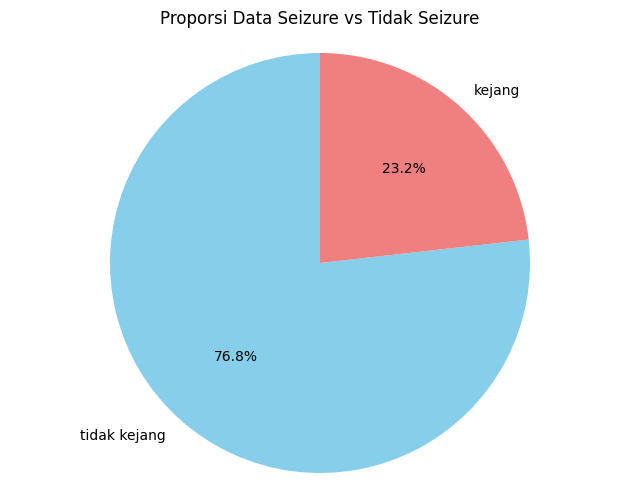

In [ ]:
import matplotlib.pyplot as plt

# Menghitung jumlah masing-masing label (seizure dan tidak seizure)
seizure_counts = TA_data['seizure'].value_counts()

# Menampilkan jumlah data seizure dan tidak seizure
print("Jumlah data seizure dan tidak seizure:")
print(seizure_counts)

# Membuat pie chart
plt.figure(figsize=(8, 6))
plt.pie(seizure_counts, labels=seizure_counts.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])
plt.title('Proporsi Data Seizure vs Tidak Seizure')
plt.axis('equal')  # Menjaga proporsi lingkaran tetap
plt.show()


In [ ]:
# Simpan data yang digabung
TA_data.to_csv("/content/drive/MyDrive/TA/gabung_20data.csv", index=False)

Akurasi: 0.9298841679003464
Laporan Klasifikasi:
               precision    recall  f1-score   support

      kejang       0.97      0.72      0.83     72295
tidak kejang       0.92      0.99      0.96    239104

    accuracy                           0.93    311399
   macro avg       0.94      0.86      0.89    311399
weighted avg       0.93      0.93      0.93    311399



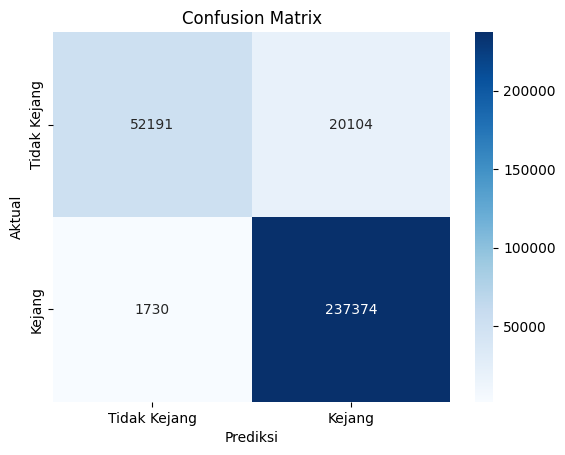

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns

# Memisahkan fitur (X) dan label (y)
X = TA_data.drop(['Time', 'seizure'], axis=1)  # Fitur (semua kolom kecuali 'Time' dan 'seizure')
y = TA_data['seizure']  # Label (kolom 'seizure')

# Split data menjadi training dan testing dengan stratified split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Membuat model Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)  # Melatih model

# Prediksi pada data testing
y_pred = model.predict(X_test)

# Evaluasi hasil
print("Akurasi:", accuracy_score(y_test, y_pred))
print("Laporan Klasifikasi:\n", classification_report(y_test, y_pred))

# Membuat confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Tidak Kejang', 'Kejang'], yticklabels=['Tidak Kejang', 'Kejang'])
plt.xlabel('Prediksi')
plt.ylabel('Aktual')
plt.title('Confusion Matrix')
plt.show()
